In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.integrate import odeint
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LinearRegression,Ridge,Lasso,ElasticNet

In [4]:
# parameters

t_max = 180             # シミュレーション日数
dt    = 0.001
pop   = 1000000         # シミュレーション人口（100万人）
b     = 1               # ルーズなb
m     = 0.04            # E→S
g     = 0.2 - m         # E -> I 1/incubtation
dh    = 0.007           # mortality in confirmed case（7%）/infectious period（10日）
rh    = 0.093           # d_i + r_i = Constant(1/infectious period（10日）) 
do    = 0.010           # mortality in unconfirmed case（4%）/infectious period（10日）
ro    = 0.090           # d_o + r_o = Constant(1/infectious period（10日）)

#初期状態

Sh = 1
Eh = 1
Ih = 1
Rh = 0
Dh = 0

So = 999900
Eo = 0
Io = 97
Ro = 0
Do = 0

ini_state = [Sh, Eh, Ih, Rh, Dh, So, Eo, Io, Ro, Do
    ]

In [5]:
def sigmoid(a):
    e = math.e
    s = 1 / (1 + e**-a)
    return s

In [6]:
def tSEIRD(v, t, a, m, b, g, rh, dh, ro, do, n, p, Se, Sp, cap):
    beds = np.sum(ini_state) * cap
    return [
        - b * v[0] * v[2]/ (v[0] + v[1] + v[2]) + m * v[1] - a * v[0], #[0] S_h
        b * v[0] * v[2] / (v[0] + v[1] + v[2]) - (m + g) * v[1] + n * (1 - Sp) * v[6] * sigmoid(beds-(v[0]+v[1]+v[2])), #[1] E_h
        g * v[1] - (rh + dh) * v[2] + p * Se * v[7] * sigmoid(beds-(v[0]+v[1]+v[2])), #[2] I_h
        rh * v[2], #[3] R_h
        dh * v[2], #[4] D_h
        - b * v[5] * v[7] / (v[5] + v[6] + v[7] + v[8] + v[3]) + m * v[6] + a * v[0], #[5] S_o
        b * v[5] * v[7] / (v[5] + v[6] + v[7] + v[8] + v[3]) - (m + g) * v[6] - n * (1 - Sp) * v[6] * sigmoid(beds - (v[0]+v[1]+v[2])) ,#[6] E_o
        g * v[6] - (ro + do) * v[7] - p * Se * v[7] * sigmoid(beds - (v[0]+v[1]+v[2])), #[7] I_o
        ro * v[7], #[8] R_o
        do * v[7] #[9] D_o
                ]

In [7]:
def tSEIRD_matrix(n,p,Se=0.7,Sp=0.7,cap=0.1,a=0):

    times = np.arange(0, t_max, dt)
    args = (a, m, b, g, rh, dh, ro, do, n, p, Se, Sp, cap)

    result = odeint(tSEIRD, ini_state, times, args)

    df = pd.DataFrame(result)
    
    df['Sh'] = df[0]# / 1000
    df['Eh'] = df[1]# / 1000
    df['Ih'] = df[2]# / 1000
    df['Rh'] = df[3]# / 1000
    df['Dh'] = df[4]# / 1000
    
    df['So'] = df[5]# / 1000
    df['Eo'] = df[6]# / 1000
    df['Io'] = df[7]# / 1000
    df['Ro'] = df[8]# / 1000
    df['Do'] = df[9]# / 1000
    
    df['Susceptible'] = (df[0] + df[5])# / 1000 #10
    df['Exposed']     = (df[1] + df[6])# / 1000 #11
    df['Infectious']  = (df[2] + df[7])# / 1000 #12
    df['Recovered']   = (df[3] + df[8])# / 1000 #13
    df['Dead']        = (df[4] + df[9])# / 1000 #14

    df['Hospitalised']= (df[0] + df[1] + df[2])# / 1000 #15
    df['Outside']     = (df[3] + df[5] + df[6] + df[7] + df[8])# / 1000 #16
    
    df['TP']          = (p * Se * df[7])# / 1000 #17
    df['FP']          = (n * (1 - Sp) * df[6])# / 1000 #18
    df['Positive']    = df['TP'] + df['FP'] #19

    df['all']         = (df[0]+df[1]+df[2]+df[3]+df[4]+df[5]+df[6]+df[7]+df[8]+df[9])# / 1000 #20
    df['beta_in']     = b / df['Hospitalised'] #21
    df['beta_out']    = b / df['Outside'] #22
    
    df['delta_Dh']    = dh * df[2]
    df['delta_Do']    = do * df[7]

    df_ = df.drop([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], axis=1)
    
    return df_[['Infectious','TP','FP']]

In [91]:
def matrix_to_regression(n,p):
    df = tSEIRD_matrix(n,p,0.7,0.7)[1:]
    title = float(n),float(p)
    
    X = df.drop('Infectious',axis=1)
    X['product'] = X['TP'] * X['FP']
    Y = df['Infectious']

    vif = pd.DataFrame()
    vif['VIF Factor'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['features'] = X.columns
    print(vif)
    
    # 回帰直線、ロッソ、リッジのモデルを生成
    lr = LinearRegression(fit_intercept=False)
    lasso = Lasso(fit_intercept=False)
    ridge = Ridge(fit_intercept=False)
    elnet = ElasticNet(fit_intercept=False)
    
    # モデル関数を作成
    lr.fit(X, Y)
    lasso.fit(X, Y)
    ridge.fit(X, Y)
    elnet.fit(X, Y)
    
    # 生データ、直線回帰、ラッソ回帰、リッジ回帰で算出されたモデル関数を図示
    fig, ax = plt.subplots()
    t = np.arange(1, 180)
    
    y0 = df['Infectious'][1000:1800000:1000]
    c0 = 'green'
    l0 = 'raw'
    ax.plot(t, y0, color=c0, label=l0)
    
    y1 = lr.predict(X)[1000:1800000:1000]
    c1 = 'blue'
    l1 = 'lr'
    ax.plot(t, y1, color=c1, label=l1)

    y2 = ridge.predict(X)[1000:1800000:1000]
    c2 = 'black'
    l2 = 'Ridge'
    ax.plot(t, y2, color=c2, label=l2)

    y3 = lasso.predict(X)[1000:1800000:1000]
    c3 = 'red'
    l3 = 'Lasso'
    ax.plot(t, y3, color=c3, label=l3)
    
    y4 = elnet.predict(X)[1000:1800000:1000]
    c4 = 'orange'
    l4 = 'elastic'
    ax.plot(t, y4, color=c4, label=l4)

    ax.set_xlabel('Elasped time (days)')
    ax.set_ylabel('Infectious populations (person)')

    plt.title(title)
    plt.legend(loc='upper right')
    
    #枠線消した
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().yaxis.set_ticks_position('left')
    plt.gca().xaxis.set_ticks_position('bottom')

    plt.show()

    # 回帰係数の提示
    print('lr,lasso,ridge,elastic_netの回帰係数')
#    coef = []
#    coef.append([lr.coef_])
#    coef.append([lasso.coef_])
#    coef.append([ridge.coef_])
#    coef.append([elnet.coef_])
#    print(coef)
    
    df_coef = pd.DataFrame()
    df_coef = pd.concat([df_coef,pd.DataFrame(lr.coef_).T])
    df_coef = pd.concat([df_coef,pd.DataFrame(lasso.coef_).T])
    df_coef = pd.concat([df_coef,pd.DataFrame(ridge.coef_).T])
    df_coef = pd.concat([df_coef,pd.DataFrame(elnet.coef_).T])
    df_coef.columns = ['TP','FP','product']
    df_coef.index = ['lr','lasso','ridge','elastic']
    print(df_coef)

    # Infectiousトレンド
    fig, ax = plt.subplots()
    t = np.arange(1, 180)
    y_0 = tSEIRD_matrix(0.7,0.7,n,p)['Infectious'][1000:1800000:1000]
    l_0 = 'Infectious'
    
    ax.plot(t, y_0, color=c0, label=l_0)    
    ax.set_xlabel('Elasped time (days)')
    ax.set_ylabel('Infectious populations (person)')

    plt.title(title)
    plt.legend(loc='upper right')
    
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().yaxis.set_ticks_position('left')
    plt.gca().xaxis.set_ticks_position('bottom')

    plt.show()
    
    # TPトレンド
    fig, ax = plt.subplots()
    t = np.arange(1, 180)
    y_1 = tSEIRD_matrix(0.7,0.7,n,p)['TP'][1000:1800000:1000]
    l_1 = 'TP'
    
    ax.plot(t, y_1, color=c0, label=l_1)
    ax.set_xlabel('Elasped time (days)')
    ax.set_ylabel('TP (person)')
    
    plt.title(title)
    plt.legend(loc='upper right')

    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().yaxis.set_ticks_position('left')
    plt.gca().xaxis.set_ticks_position('bottom')
    plt.show()
    
    # FPトレンド
    fig, ax = plt.subplots()
    t = np.arange(1, 180)
    y_2 = tSEIRD_matrix(0.7,0.7,n,p)['FP'][1000:1800000:1000]
    l_2 = 'FP'
    
    ax.plot(t, y_1, color=c0, label=l_2)
    ax.set_xlabel('Elasped time (days)')
    ax.set_ylabel('FP (person)')
    
    plt.title(title)
    plt.legend(loc='upper right')

    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().yaxis.set_ticks_position('left')
    plt.gca().xaxis.set_ticks_position('bottom')
    plt.show()
    
    return df_coef

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    3.964459       TP
1    9.768303       FP
2   11.871206  product


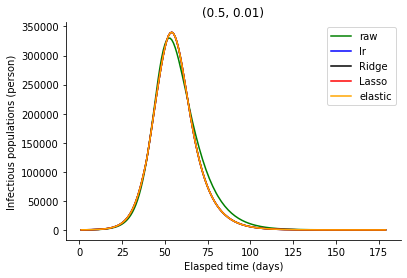

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       202.247081  1.274691 -0.001623
lasso    202.247070  1.274691 -0.001623
ridge    202.247081  1.274691 -0.001623
elastic  202.245905  1.274700 -0.001623


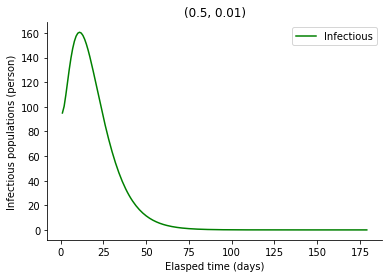

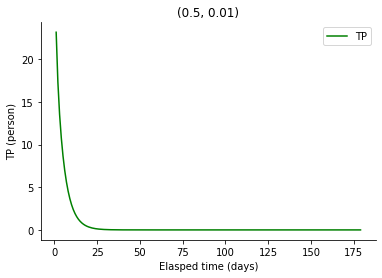

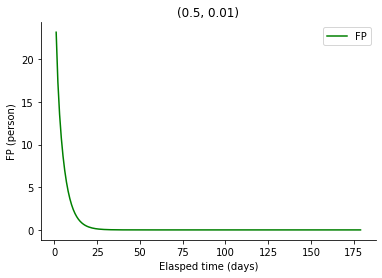

In [92]:
ns = [0.5]
ps = [0.01]

for n in ns:
    for p in ps:
        matrix_to_regression(n,p)

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    3.964459       TP
1    9.768303       FP
2   11.871206  product


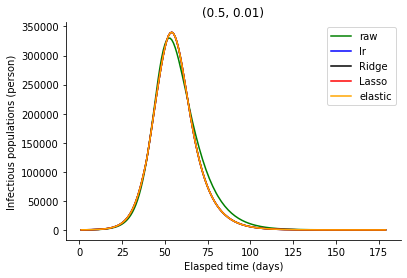

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       202.247081  1.274691 -0.001623
lasso    202.247070  1.274691 -0.001623
ridge    202.247081  1.274691 -0.001623
elastic  202.245905  1.274700 -0.001623


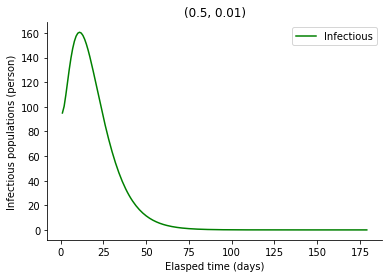

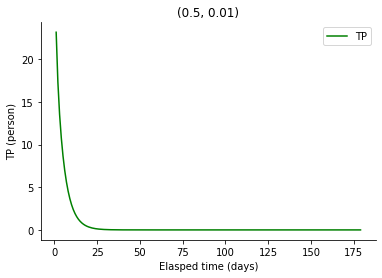

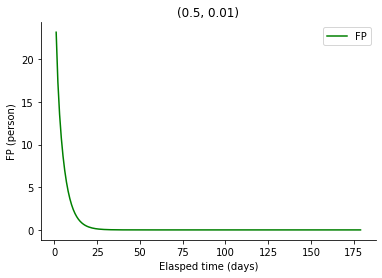

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.170847       TP
1    9.719213       FP
2   11.893310  product


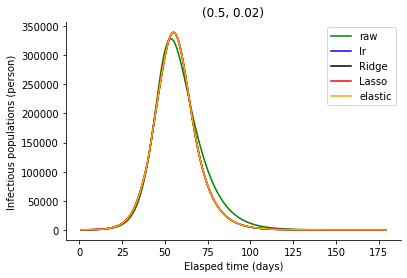

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       103.769117  1.382424 -0.000924
lasso    103.769114  1.382424 -0.000924
ridge    103.769117  1.382424 -0.000924
elastic  103.768952  1.382427 -0.000924


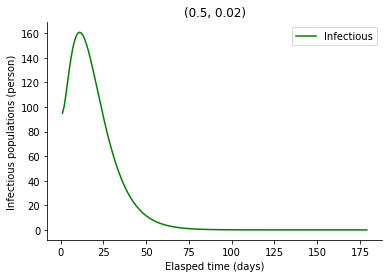

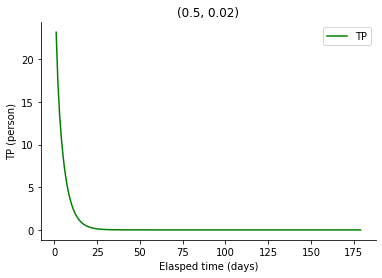

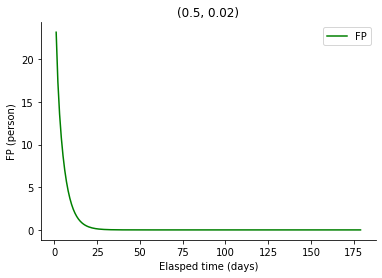

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.695881       TP
1    9.580483       FP
2   11.903068  product


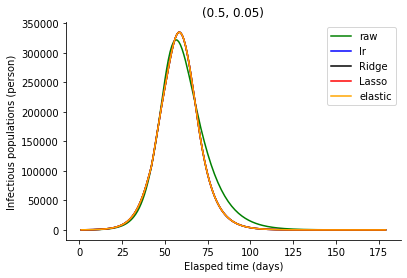

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       43.847330  1.712189 -0.000481
lasso    43.847329  1.712189 -0.000481
ridge    43.847330  1.712189 -0.000481
elastic  43.847316  1.712189 -0.000481


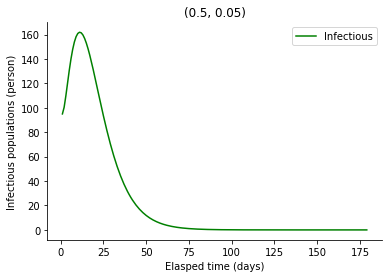

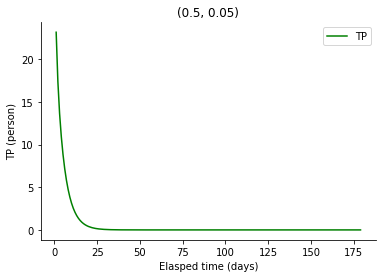

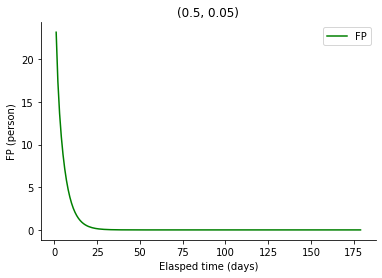

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    5.372270       TP
1    9.381529       FP
2   11.824290  product


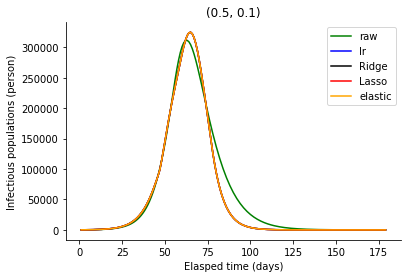

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       23.186546  2.281387 -0.000318
lasso    23.186546  2.281387 -0.000318
ridge    23.186546  2.281387 -0.000318
elastic  23.186544  2.281387 -0.000318


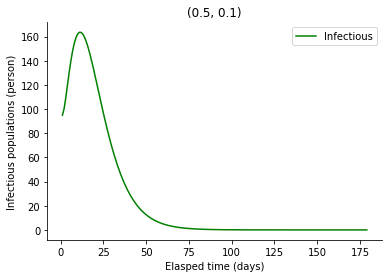

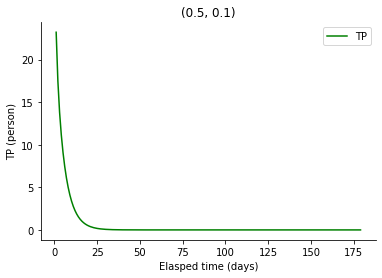

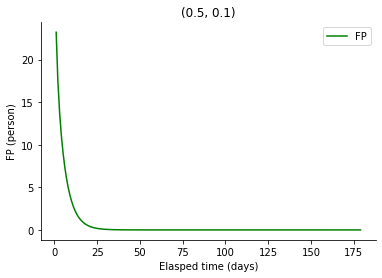

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    6.622315       TP
1    9.052586       FP
2   11.572998  product


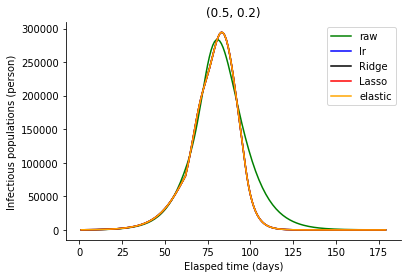

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       12.679966  3.581461 -0.000253
lasso    12.679966  3.581461 -0.000253
ridge    12.679966  3.581461 -0.000253
elastic  12.679966  3.581461 -0.000253


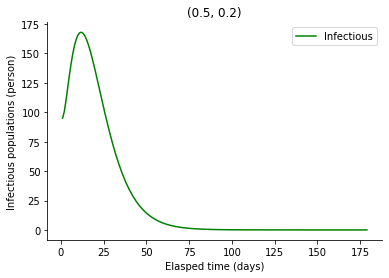

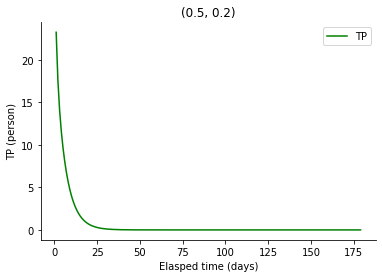

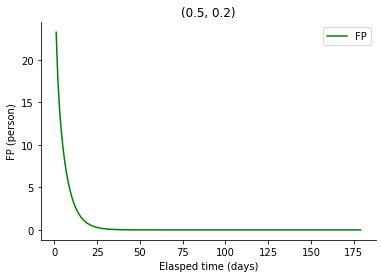

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    3.952462       TP
1    9.796690       FP
2   11.931120  product


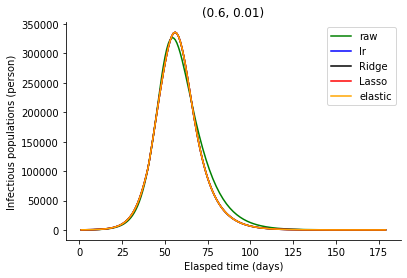

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       203.193942  1.337813 -0.001552
lasso    203.193931  1.337813 -0.001552
ridge    203.193942  1.337813 -0.001552
elastic  203.192735  1.337821 -0.001552


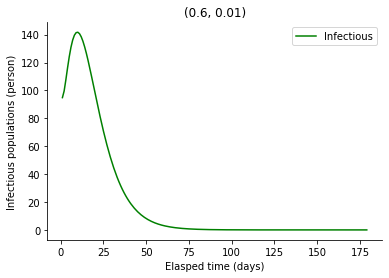

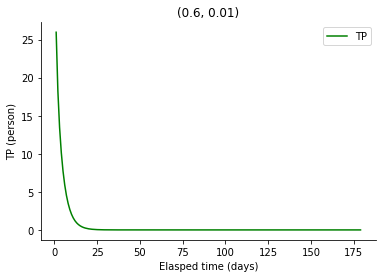

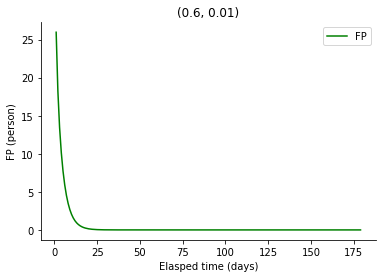

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.145866       TP
1    9.754706       FP
2   11.956550  product


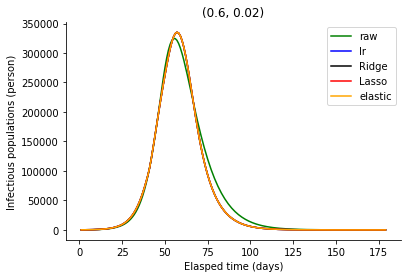

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       104.049473  1.424909 -0.000868
lasso    104.049470  1.424909 -0.000868
ridge    104.049473  1.424909 -0.000868
elastic  104.049305  1.424911 -0.000868


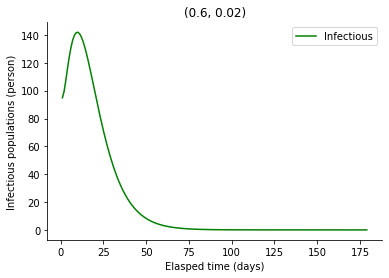

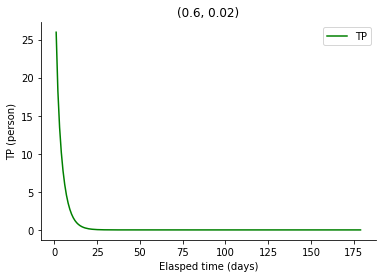

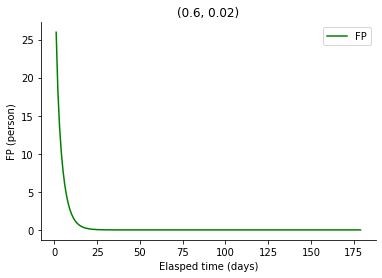

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.640869       TP
1    9.638048       FP
2   11.976310  product


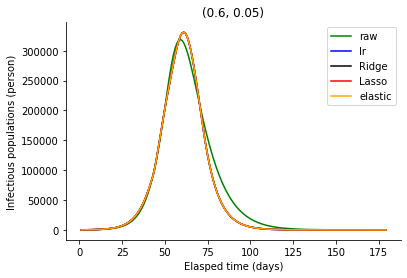

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP  product
lr       43.817301  1.694503 -0.00044
lasso    43.817300  1.694503 -0.00044
ridge    43.817301  1.694503 -0.00044
elastic  43.817287  1.694503 -0.00044


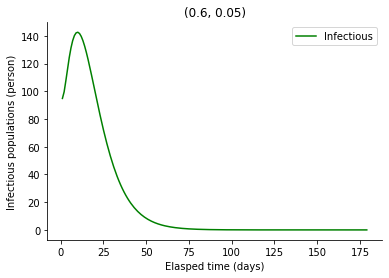

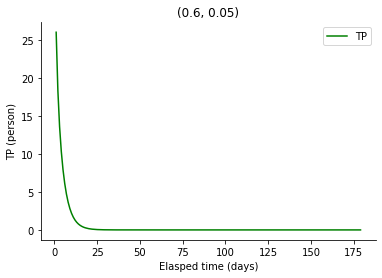

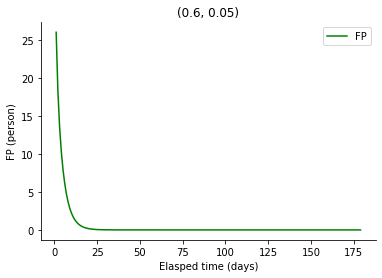

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    5.294432       TP
1    9.471914       FP
2   11.910413  product


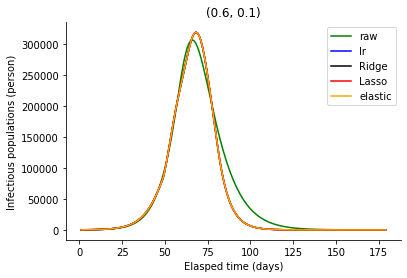

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       23.147606  2.174887 -0.000288
lasso    23.147606  2.174887 -0.000288
ridge    23.147606  2.174887 -0.000288
elastic  23.147604  2.174888 -0.000288


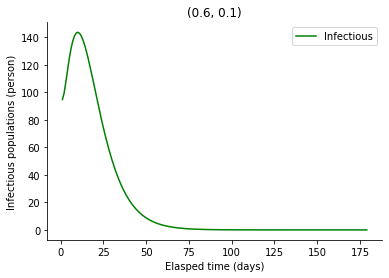

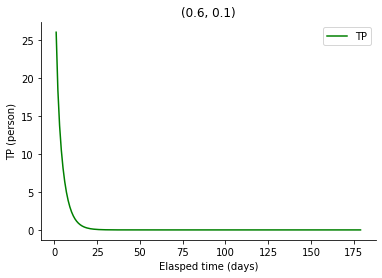

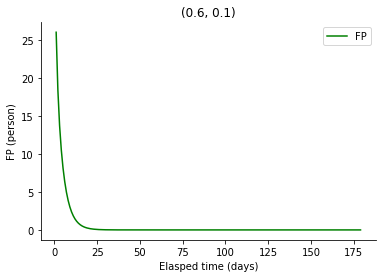

   VIF Factor features
0    6.627725       TP
1    9.178510       FP
2   11.632409  product


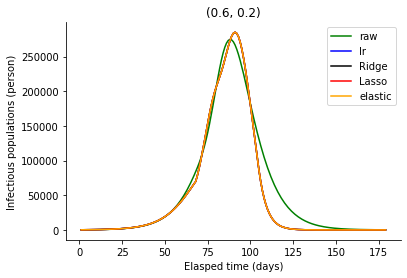

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       12.793736  3.395612 -0.000239
lasso    12.793736  3.395612 -0.000239
ridge    12.793736  3.395612 -0.000239
elastic  12.793735  3.395612 -0.000239


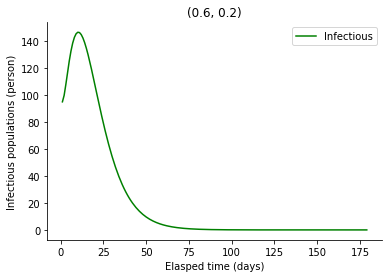

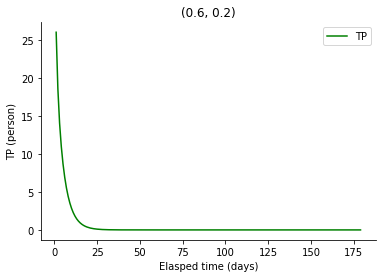

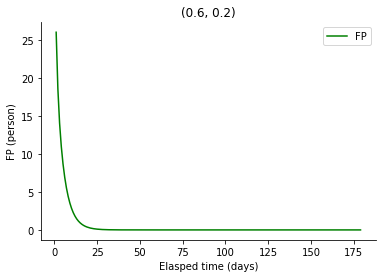

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    3.947395       TP
1    9.814785       FP
2   11.975856  product


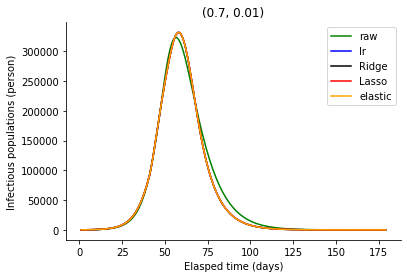

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       204.158107  1.352684 -0.001489
lasso    204.158095  1.352684 -0.001489
ridge    204.158107  1.352684 -0.001489
elastic  204.156866  1.352690 -0.001489


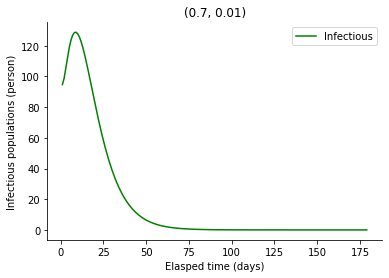

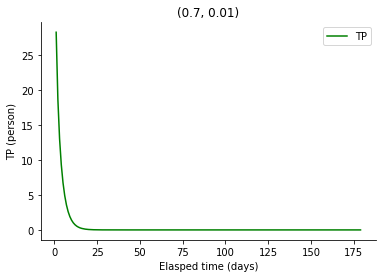

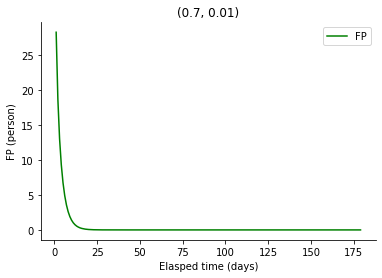

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.130642       TP
1    9.779049       FP
2   12.004407  product


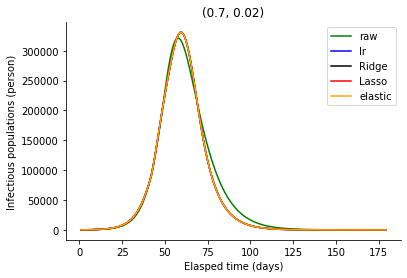

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       104.391703  1.426533 -0.000823
lasso    104.391700  1.426533 -0.000823
ridge    104.391703  1.426533 -0.000823
elastic  104.391531  1.426535 -0.000823


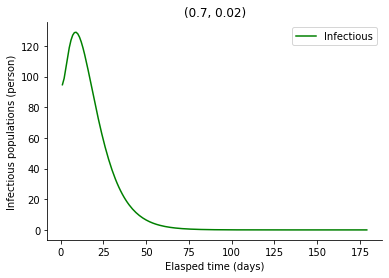

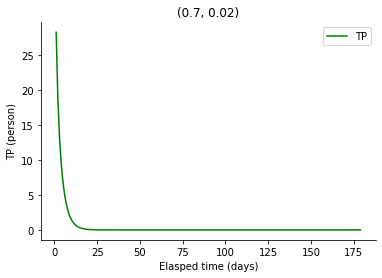

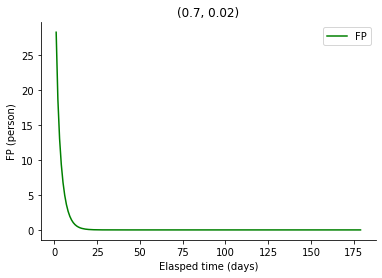

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.602896       TP
1    9.680783       FP
2   12.033276  product


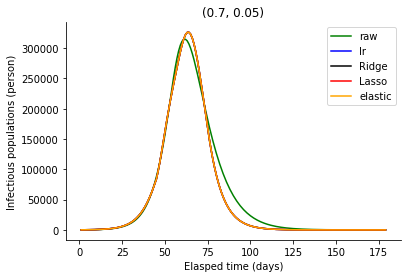

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP  product
lr       43.857358  1.658095 -0.00041
lasso    43.857357  1.658095 -0.00041
ridge    43.857358  1.658095 -0.00041
elastic  43.857343  1.658096 -0.00041


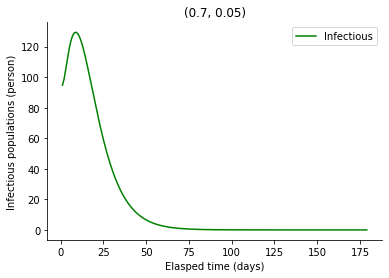

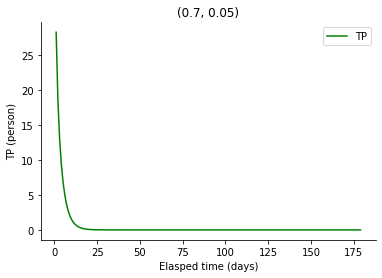

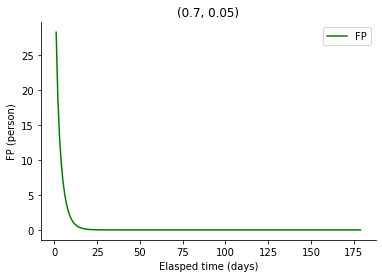

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    5.242987       TP
1    9.541223       FP
2   11.977552  product


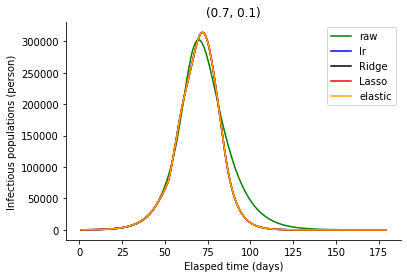

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       23.168283  2.085333 -0.000267
lasso    23.168283  2.085333 -0.000267
ridge    23.168283  2.085333 -0.000267
elastic  23.168281  2.085333 -0.000267


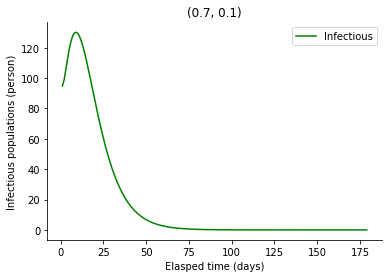

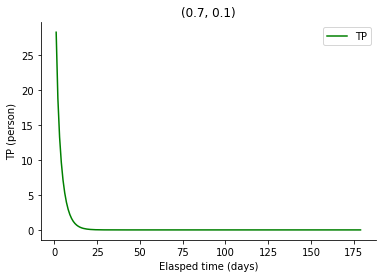

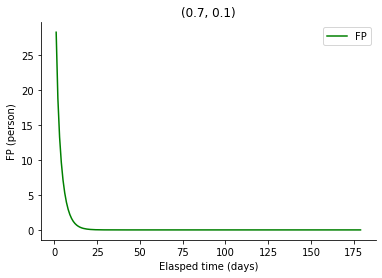

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    6.738892       TP
1    9.271676       FP
2   11.643997  product


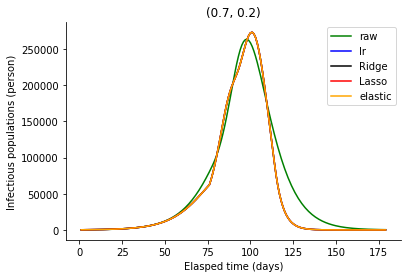

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       13.036712  3.334873 -0.000239
lasso    13.036712  3.334873 -0.000239
ridge    13.036712  3.334873 -0.000239
elastic  13.036711  3.334873 -0.000239


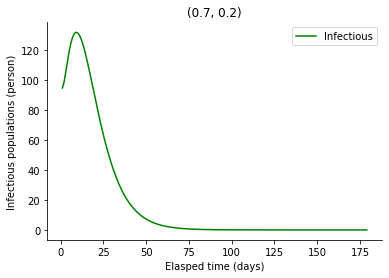

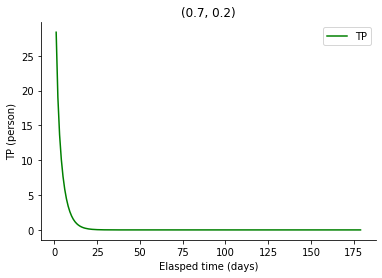

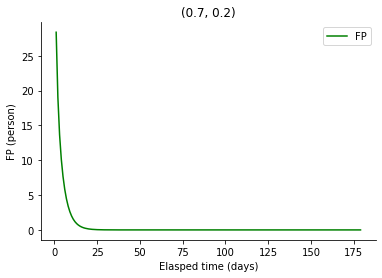

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    3.946816       TP
1    9.827250       FP
2   12.009327  product


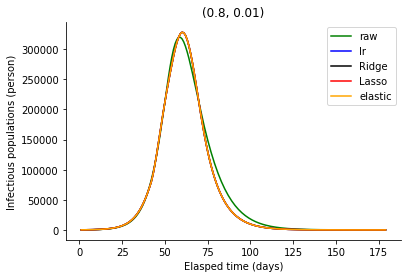

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       205.137341  1.343996 -0.001434
lasso    205.137328  1.343996 -0.001434
ridge    205.137341  1.343996 -0.001434
elastic  205.136065  1.344001 -0.001434


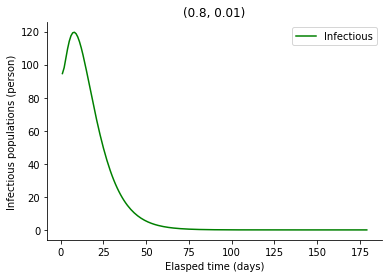

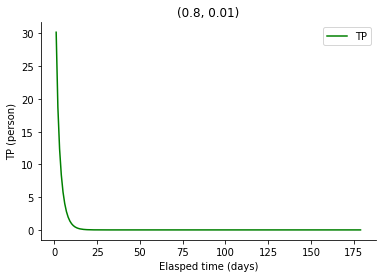

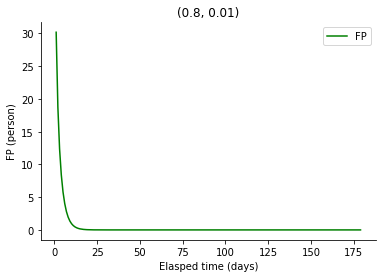

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.122067       TP
1    9.796848       FP
2   12.040470  product


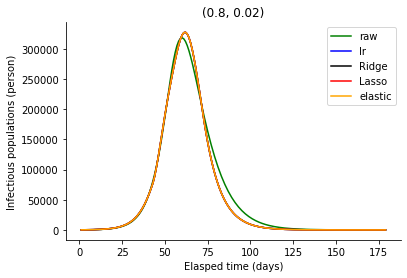

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       104.779927  1.409033 -0.000785
lasso    104.779924  1.409033 -0.000785
ridge    104.779927  1.409033 -0.000785
elastic  104.779751  1.409035 -0.000785


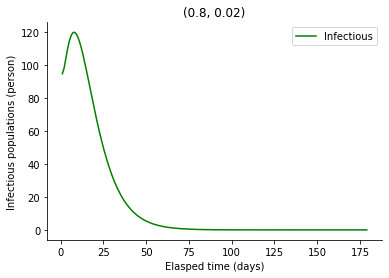

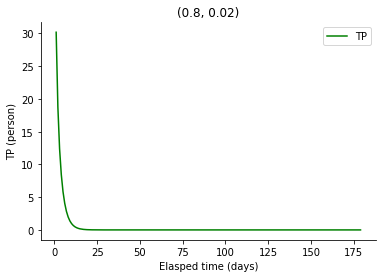

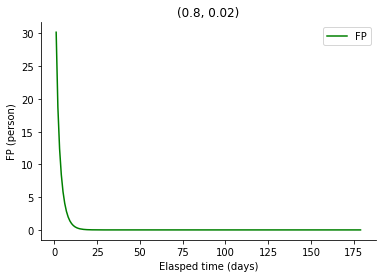

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.577270       TP
1    9.714019       FP
2   12.076963  product


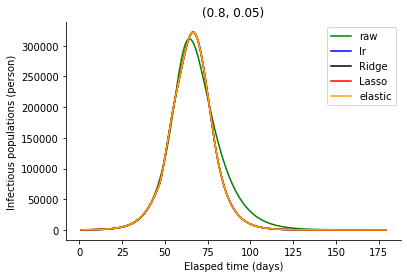

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       43.950807  1.615917 -0.000387
lasso    43.950806  1.615917 -0.000387
ridge    43.950807  1.615917 -0.000387
elastic  43.950792  1.615917 -0.000387


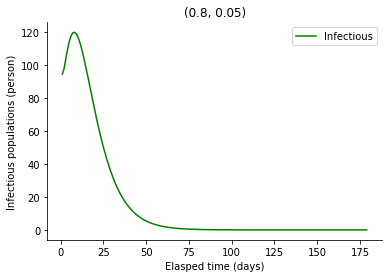

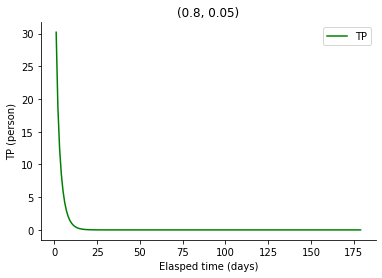

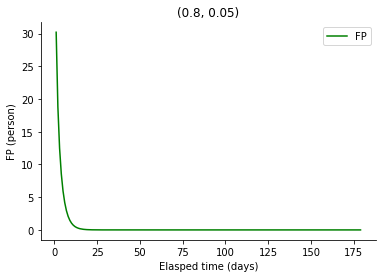

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    5.212755       TP
1    9.596815       FP
2   12.028340  product


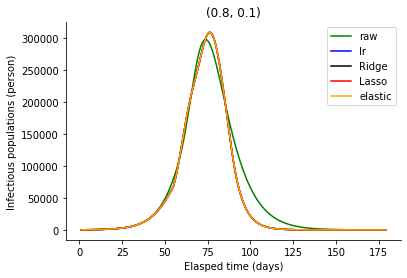

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       23.240958  2.012992 -0.000253
lasso    23.240958  2.012992 -0.000253
ridge    23.240958  2.012992 -0.000253
elastic  23.240956  2.012992 -0.000253


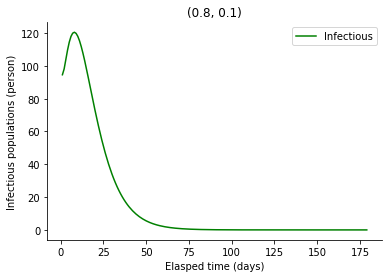

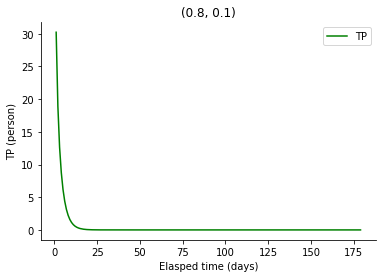

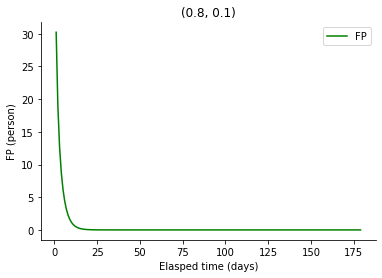

   VIF Factor features
0    7.045618       TP
1    9.338239       FP
2   11.572478  product


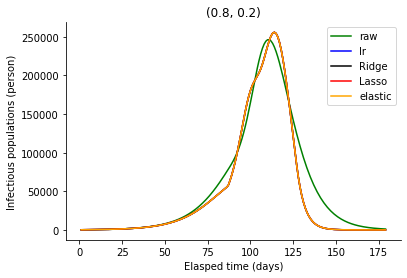

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       13.526677  3.439458 -0.000262
lasso    13.526677  3.439458 -0.000262
ridge    13.526677  3.439458 -0.000262
elastic  13.526677  3.439458 -0.000262


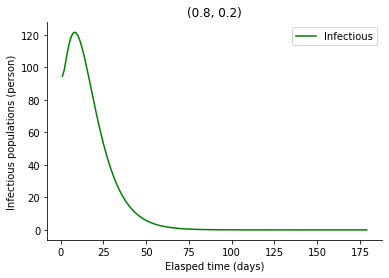

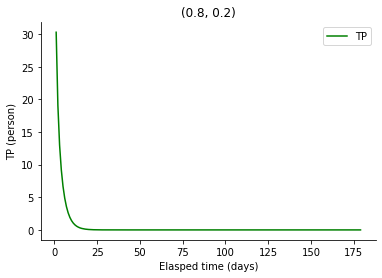

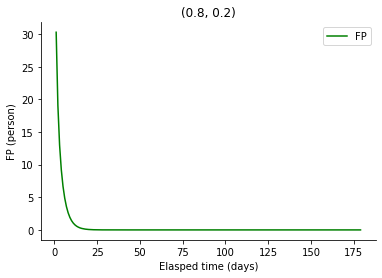

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    3.949396       TP
1    9.837017       FP
2   12.034908  product


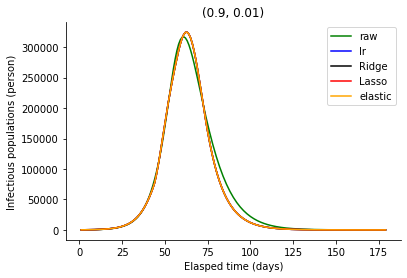

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       206.135486  1.324016 -0.001386
lasso    206.135474  1.324016 -0.001386
ridge    206.135486  1.324016 -0.001386
elastic  206.134174  1.324021 -0.001386


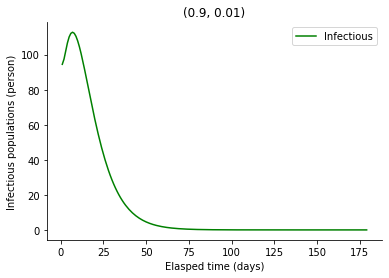

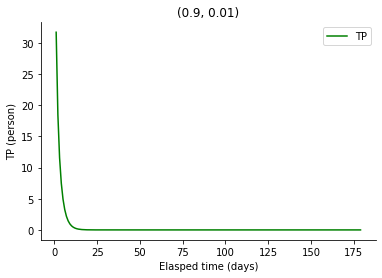

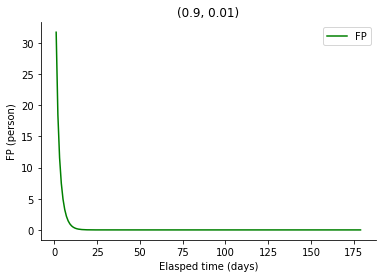

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.118357       TP
1    9.811202       FP
2   12.068109  product


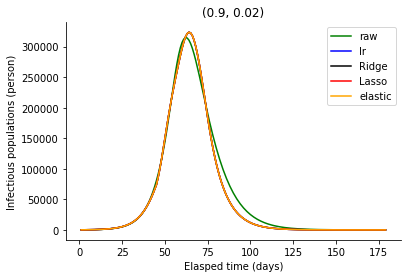

lr,lasso,ridge,elastic_netの回帰係数
                 TP        FP   product
lr       105.207346  1.383100 -0.000755
lasso    105.207342  1.383100 -0.000755
ridge    105.207346  1.383100 -0.000755
elastic  105.207165  1.383102 -0.000755


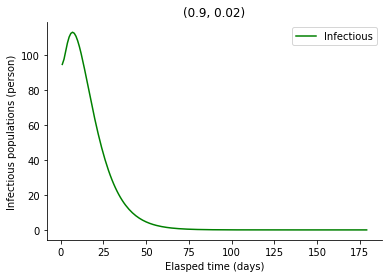

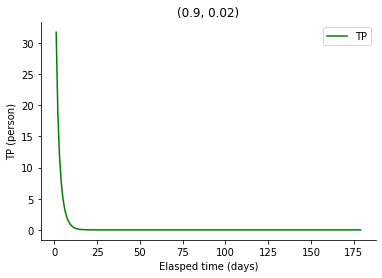

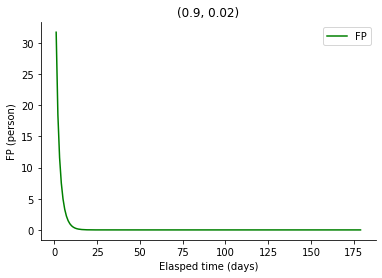

   VIF Factor features
0    4.561206       TP
1    9.741650       FP
2   12.110699  product


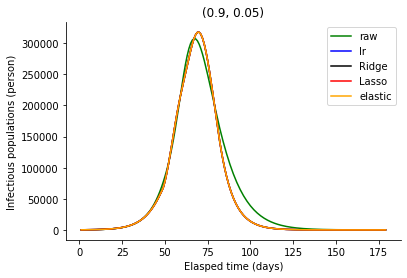

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       44.089436  1.574098 -0.000369
lasso    44.089435  1.574098 -0.000369
ridge    44.089436  1.574098 -0.000369
elastic  44.089421  1.574098 -0.000369


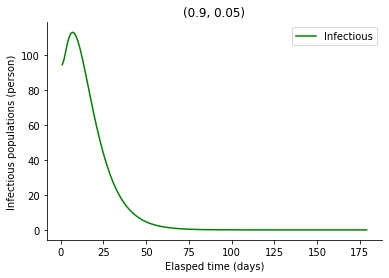

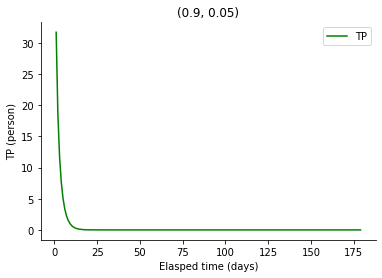

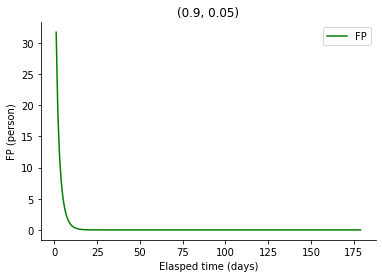

   VIF Factor features
0    5.201390       TP
1    9.644121       FP
2   12.065664  product


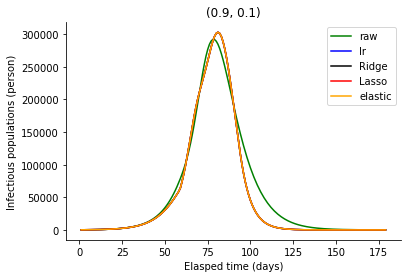

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       23.365408  1.958108 -0.000244
lasso    23.365408  1.958108 -0.000244
ridge    23.365408  1.958108 -0.000244
elastic  23.365406  1.958108 -0.000244


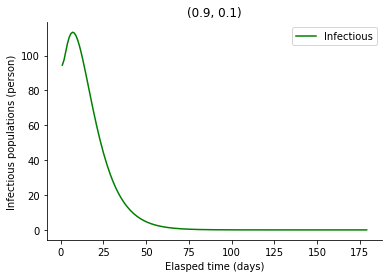

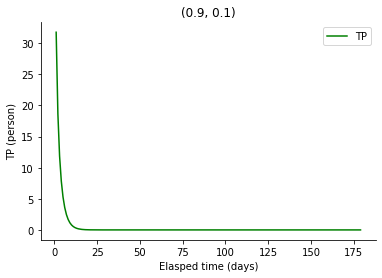

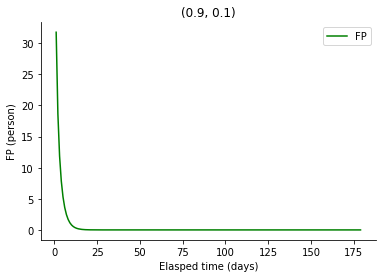

   VIF Factor features
0    8.008719       TP
1    9.382190       FP
2   11.253286  product


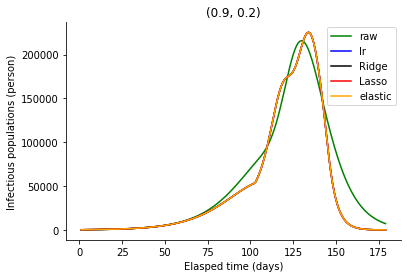

lr,lasso,ridge,elastic_netの回帰係数
                TP        FP   product
lr       14.819682  3.942885 -0.000353
lasso    14.819682  3.942885 -0.000353
ridge    14.819682  3.942885 -0.000353
elastic  14.819681  3.942885 -0.000353


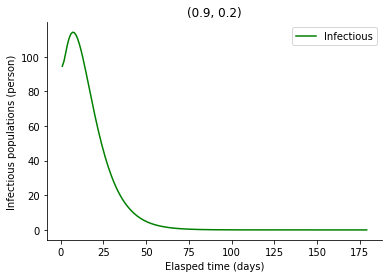

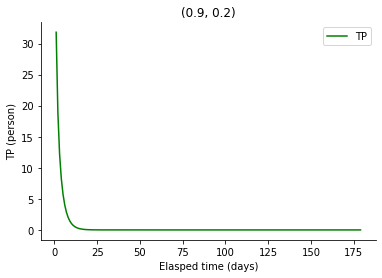

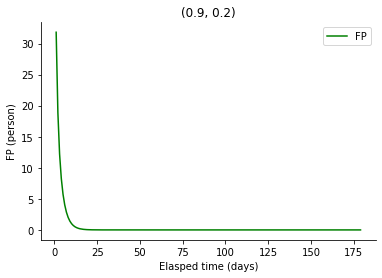

In [85]:
ns = [0.5,0.6,0.7,0.8,0.9]
ps = [0.01,0.02,0.05,0.1,0.2]

for n in ns:
    for p in ps:
        matrix_to_regression(n,p)

In [87]:
df = tSEIRD_matrix(n,p,0.7,0.7)[1:]
X = df.drop('Infectious',axis=1)
X['product'] = X['TP'] * X['FP']
Y = df['Infectious']

lr = LinearRegression(fit_intercept=False)
lr.fit(X, Y)

a = pd.DataFrame()
a = pd.concat([a,pd.DataFrame(lr.coef_).T])
a = pd.concat([a,pd.DataFrame(lr.coef_).T])
#a = a.rename(columns={0:'TP'})
a.index = ['lr','ll']
a.columns = ['TP','FP','product']
a

#a = pd.DataFrame(lr.coef_).T
#a = pd.concat(a,pd.DataFrame(lr.coef_).T)
#a

,TP,FP,product
lr,14.819682,3.942885,-0.000353
ll,14.819682,3.942885,-0.000353


In [ ]:
# VIF(product)>5によりモデルに入れない

In [9]:
def matrix_to_regression_(n,p):
    df = tSEIRD_matrix(n,p,0.7,0.7)[1:]
    title = str(n),str(p)
    
    X = df.drop('Infectious',axis=1)
    Y = df['Infectious']

    vif = pd.DataFrame()
    vif['VIF Factor'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['features'] = X.columns
    print(vif)
    
    # 回帰直線、ロッソ、リッジのモデルを生成
    lr = LinearRegression(fit_intercept=False)
    lasso = Lasso(fit_intercept=False)
    ridge = Ridge(fit_intercept=False)

    # モデル関数を作成
    lr.fit(X, Y)
    lasso.fit(X, Y)
    ridge.fit(X, Y)

    # 生データ、直線回帰、ラッソ回帰、リッジ回帰で算出されたモデル関数を図示
    fig, ax = plt.subplots()
    t = np.arange(1, 180)
    
    y0 = df['Infectious'][1000:1800000:1000]
    c0 = 'green'
    l0 = 'raw'
    ax.plot(t, y0, color=c0, label=l0)
    
    y1 = lr.predict(X)[1000:1800000:1000]
    c1 = 'blue'
    l1 = 'lr'
    ax.plot(t, y1, color=c1, label=l1)

    y2 = ridge.predict(X)[1000:1800000:1000]
    c2 = 'black'
    l2 = 'Ridge'
    ax.plot(t, y2, color=c2, label=l2)

    y3 = lasso.predict(X)[1000:1800000:1000]
    c3 = 'red'
    l3 = 'Lasso'
    ax.plot(t, y3, color=c3, label=l3)

    ax.set_xlabel('Elasped time (days)')
    ax.set_ylabel('Infectious populations (person)')

    plt.title(title)
    plt.legend(loc='upper right')
    
    #枠線消した
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().yaxis.set_ticks_position('left')
    plt.gca().xaxis.set_ticks_position('bottom')

    plt.show()

    # 回帰係数の提示
    print('lr,lassoとridgeの回帰係数')
    coef=[]
    coef.append([lr.coef_])
    coef.append([lasso.coef_])
    coef.append([ridge.coef_])
    print(coef)
    
    # Infectiousトレンド
    fig, ax = plt.subplots()
    t = np.arange(1, 180)
    y_0 = tSEIRD_matrix(0.7,0.7,n,p)['Infectious'][1000:1800000:1000]
    l_0 = 'Infectious'
    
    ax.plot(t, y_0, color=c0, label=l_0)    
    ax.set_xlabel('Elasped time (days)')
    ax.set_ylabel('Infectious populations (person)')

    plt.title(title)
    plt.legend(loc='upper right')
    
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().yaxis.set_ticks_position('left')
    plt.gca().xaxis.set_ticks_position('bottom')

    plt.show()
    
    # TPトレンド
    fig, ax = plt.subplots()
    t = np.arange(1, 180)
    y_1 = tSEIRD_matrix(0.7,0.7,n,p)['TP'][1000:1800000:1000]
    l_1 = 'TP'
    
    ax.plot(t, y_1, color=c0, label=l_1)
    ax.set_xlabel('Elasped time (days)')
    ax.set_ylabel('TP (person)')
    
    plt.title(title)
    plt.legend(loc='upper right')

    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().yaxis.set_ticks_position('left')
    plt.gca().xaxis.set_ticks_position('bottom')
    plt.show()
    
    # FPトレンド
    fig, ax = plt.subplots()
    t = np.arange(1, 180)
    y_2 = tSEIRD_matrix(0.7,0.7,n,p)['FP'][1000:1800000:1000]
    l_2 = 'FP'
    
    ax.plot(t, y_1, color=c0, label=l_2)
    ax.set_xlabel('Elasped time (days)')
    ax.set_ylabel('FP (person)')
    
    plt.title(title)
    plt.legend(loc='upper right')

    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().yaxis.set_ticks_position('left')
    plt.gca().xaxis.set_ticks_position('bottom')
    plt.show()

   VIF Factor features
0         NaN       TP
1         NaN       FP


C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


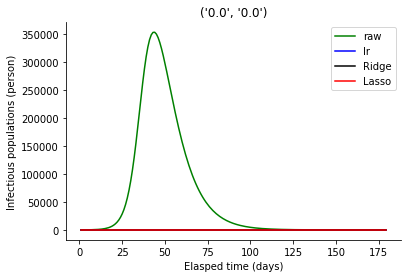

lr,lassoとridgeの回帰係数
[[array([0., 0.])], [array([0., 0.])], [array([0., 0.])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


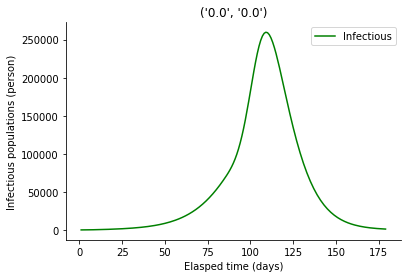

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


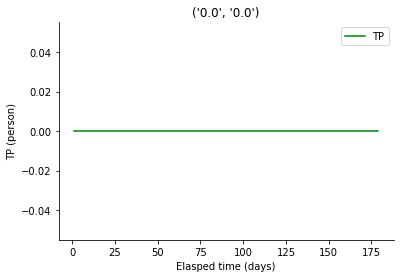

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


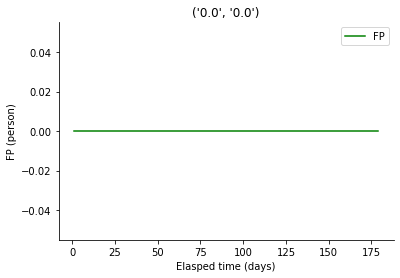

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0         1.0       TP
1         NaN       FP


C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


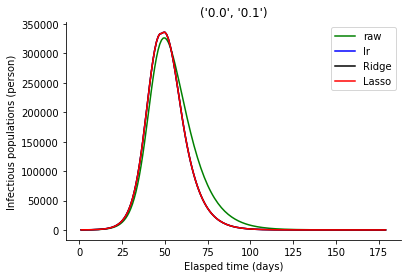

lr,lassoとridgeの回帰係数
[[array([21.2040373,  0.       ])], [array([21.20403726,  0.        ])], [array([21.2040373,  0.       ])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


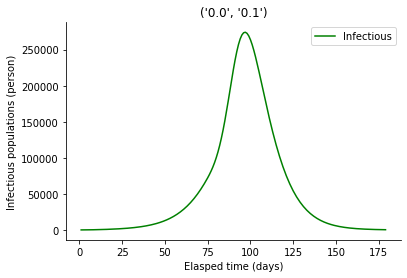

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


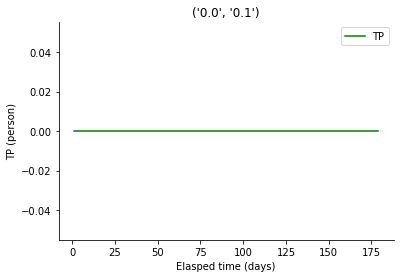

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


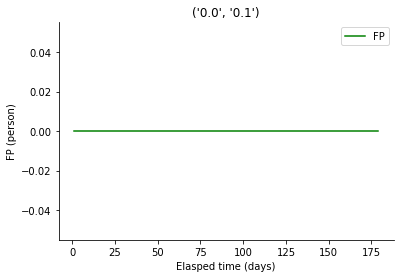

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         1.0       TP
1         NaN       FP


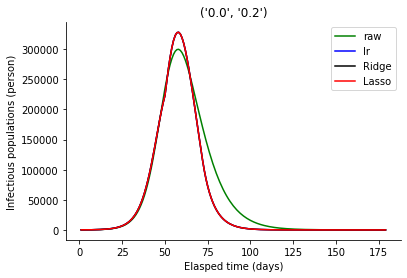

lr,lassoとridgeの回帰係数
[[array([11.73013395,  0.        ])], [array([11.73013393,  0.        ])], [array([11.73013395,  0.        ])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


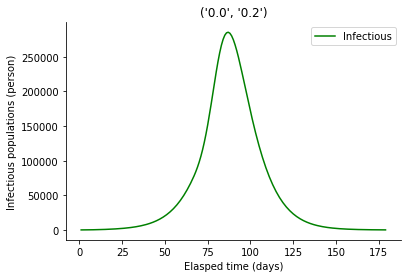

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


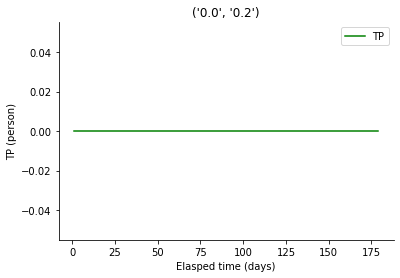

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


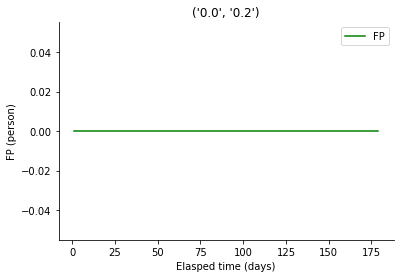

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0         1.0       TP
1         NaN       FP


C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


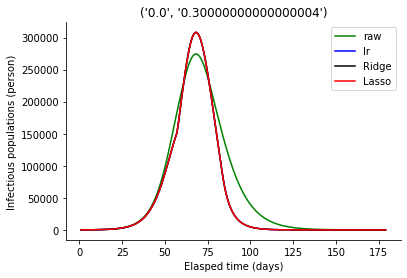

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


lr,lassoとridgeの回帰係数
[[array([8.41356263, 0.        ])], [array([8.41356262, 0.        ])], [array([8.41356263, 0.        ])]]


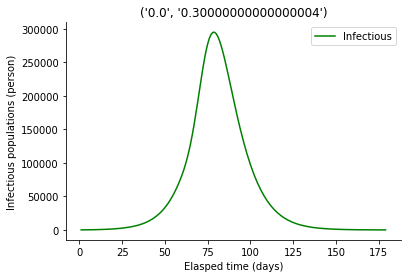

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


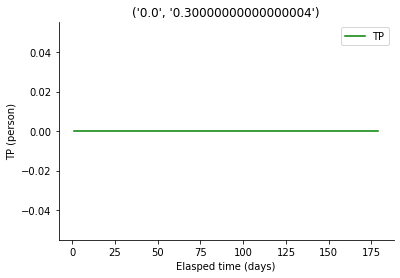

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


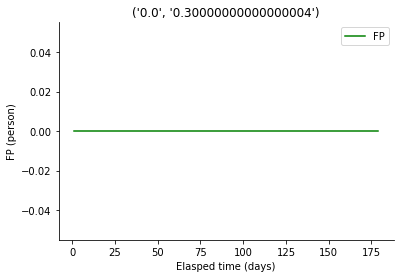

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         1.0       TP
1         NaN       FP


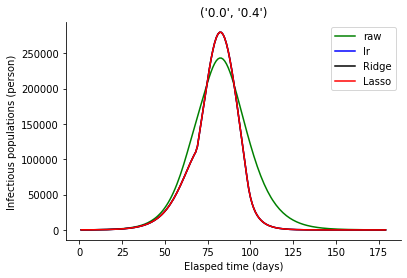

lr,lassoとridgeの回帰係数
[[array([6.9762059, 0.       ])], [array([6.97620589, 0.        ])], [array([6.9762059, 0.       ])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


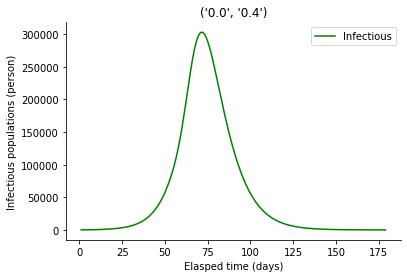

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


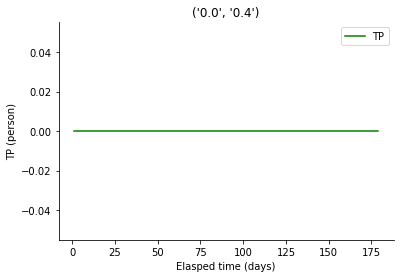

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


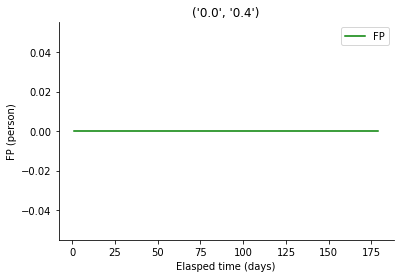

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         1.0       TP
1         NaN       FP


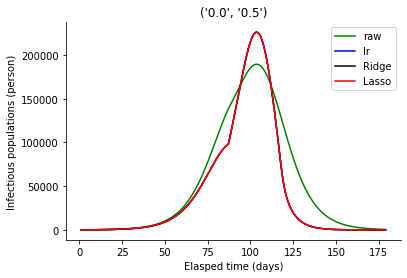

lr,lassoとridgeの回帰係数
[[array([7.22384102, 0.        ])], [array([7.22384101, 0.        ])], [array([7.22384102, 0.        ])]]


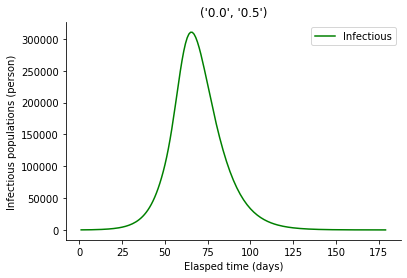

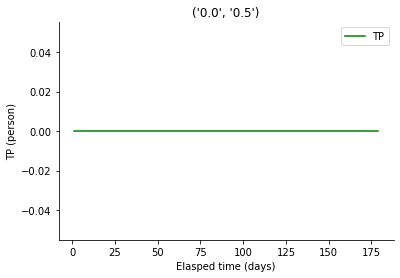

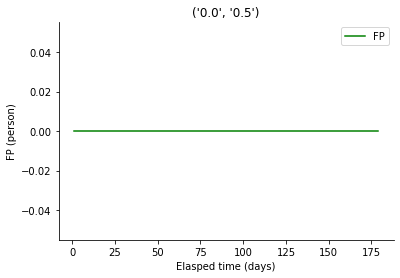

   VIF Factor features
0         1.0       TP
1         NaN       FP


C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


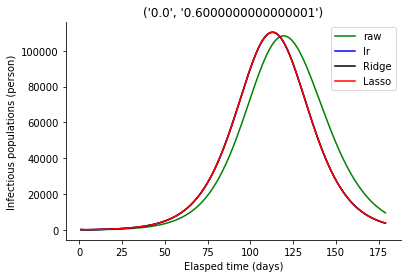

lr,lassoとridgeの回帰係数
[[array([11.60442901,  0.        ])], [array([11.60442895,  0.        ])], [array([11.60442901,  0.        ])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


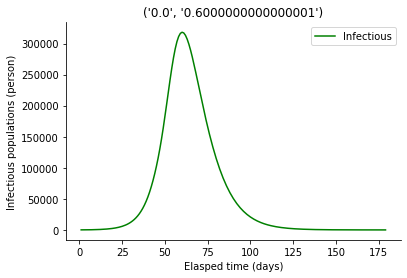

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


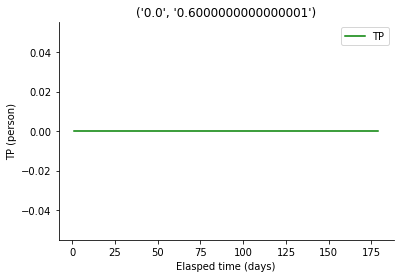

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


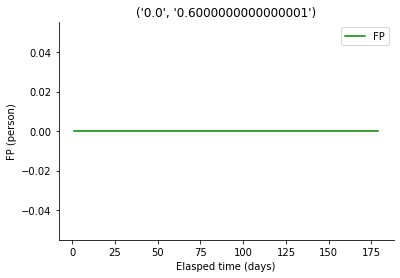

C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         1.0       TP
1         NaN       FP


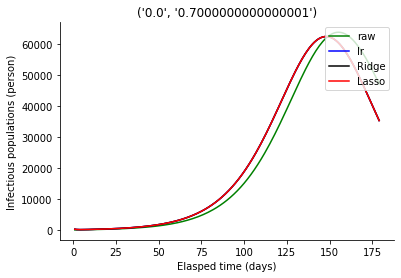

lr,lassoとridgeの回帰係数
[[array([11.21628304,  0.        ])], [array([11.21628292,  0.        ])], [array([11.21628304,  0.        ])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


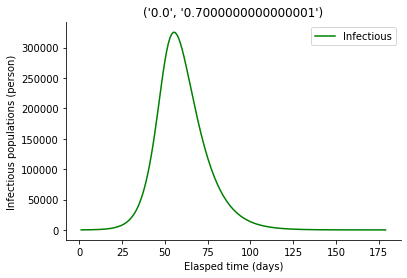

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


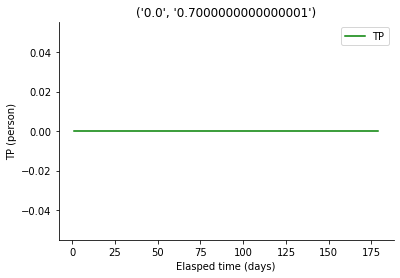

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


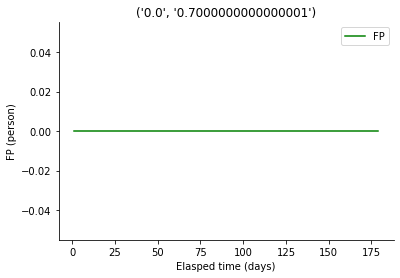

C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         1.0       TP
1         NaN       FP


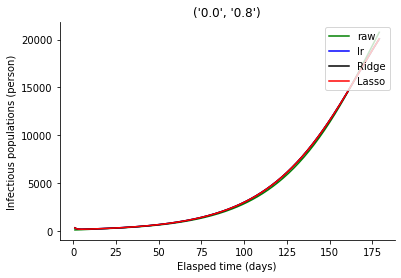

lr,lassoとridgeの回帰係数
[[array([9.98979639, 0.        ])], [array([9.98979466, 0.        ])], [array([9.98979639, 0.        ])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


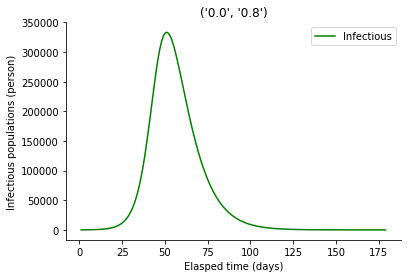

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


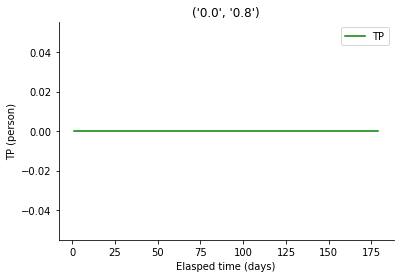

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


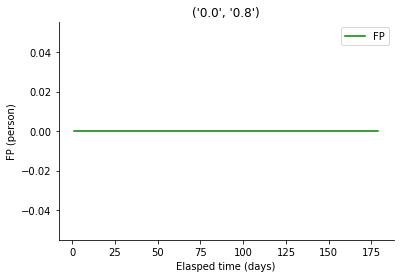

   VIF Factor features
0         1.0       TP
1         NaN       FP


C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


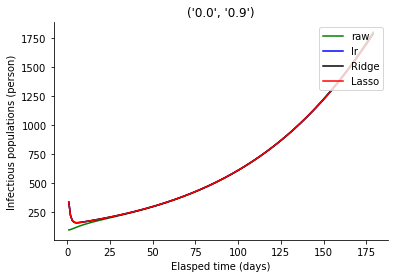

lr,lassoとridgeの回帰係数
[[array([10.35981928,  0.        ])], [array([10.35966042,  0.        ])], [array([10.35981927,  0.        ])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


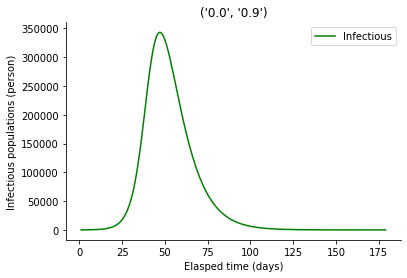

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


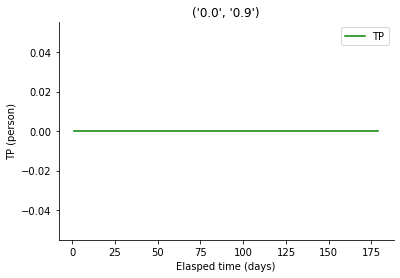

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


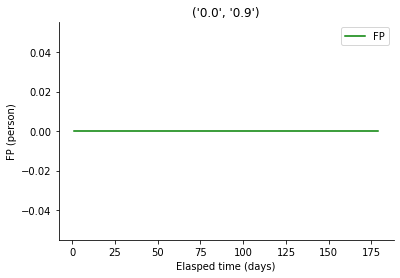

C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         1.0       TP
1         NaN       FP


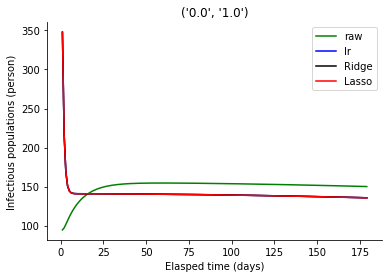

lr,lassoとridgeの回帰係数
[[array([10.36736681,  0.        ])], [array([10.36226709,  0.        ])], [array([10.36736651,  0.        ])]]


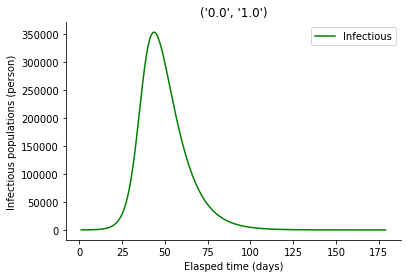

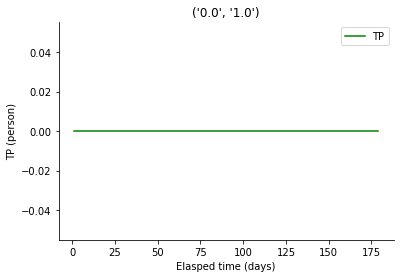

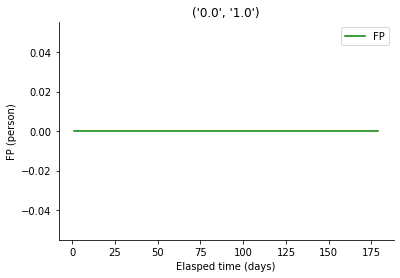

C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         NaN       TP
1         1.0       FP


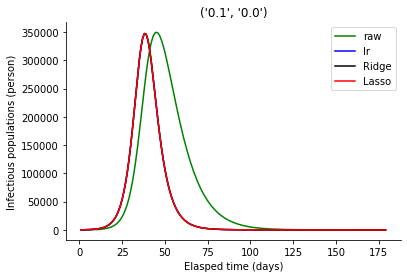

lr,lassoとridgeの回帰係数
[[array([ 0.        , 40.68299899])], [array([ 0.        , 40.68299878])], [array([ 0.        , 40.68299899])]]


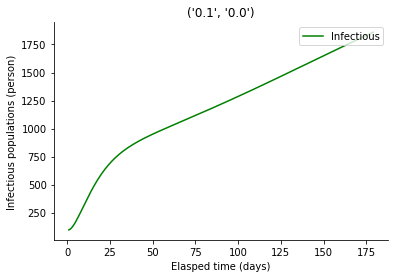

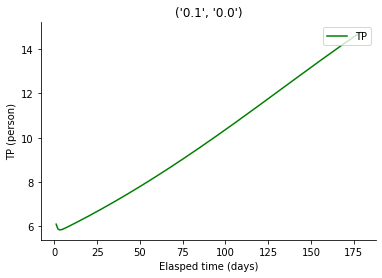

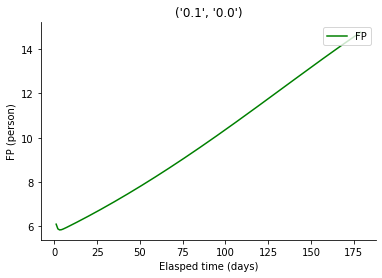

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.574168       TP
1    4.574168       FP


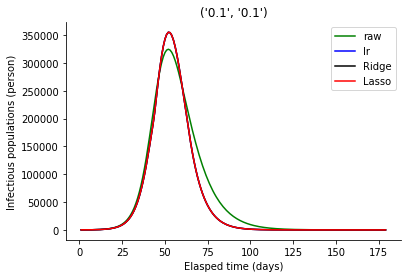

lr,lassoとridgeの回帰係数
[[array([22.74511537, -6.114922  ])], [array([22.74511482, -6.11492062])], [array([22.74511537, -6.114922  ])]]


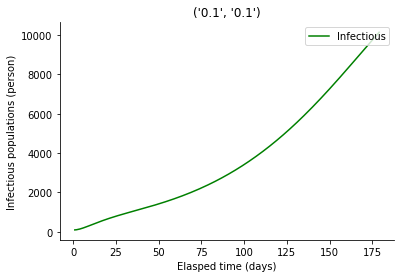

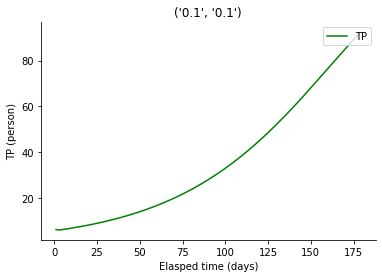

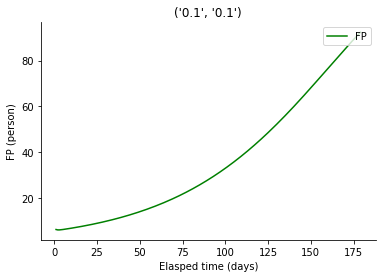

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    5.052951       TP
1    5.052951       FP


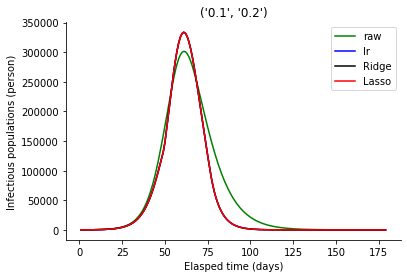

lr,lassoとridgeの回帰係数
[[array([11.34743515, -1.32981456])], [array([11.34743485, -1.32981311])], [array([11.34743515, -1.32981456])]]


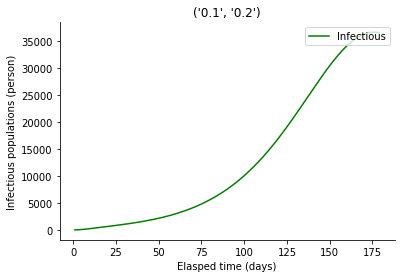

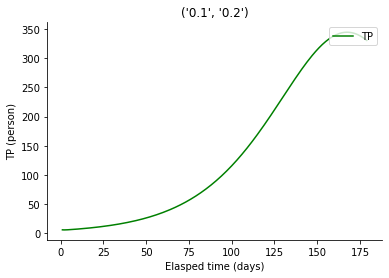

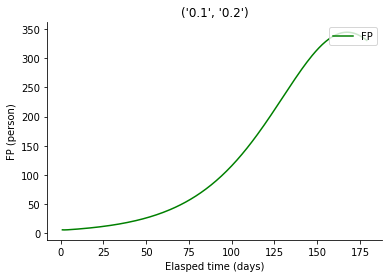

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    5.509037       TP
1    5.509037       FP


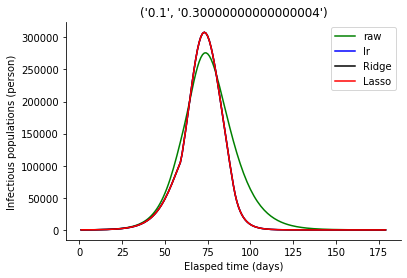

lr,lassoとridgeの回帰係数
[[array([7.41297619, 3.69528452])], [array([7.41297643, 3.69528284])], [array([7.41297619, 3.69528452])]]


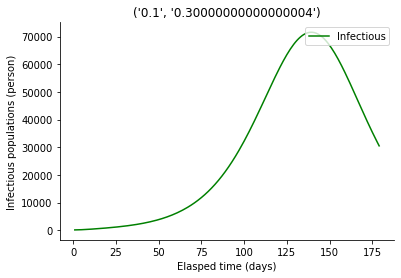

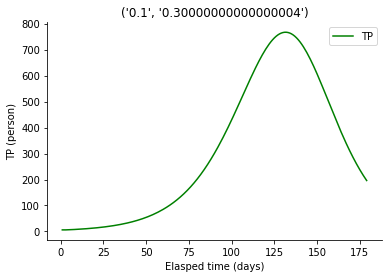

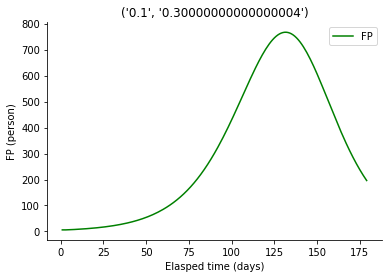

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    6.278909       TP
1    6.278909       FP


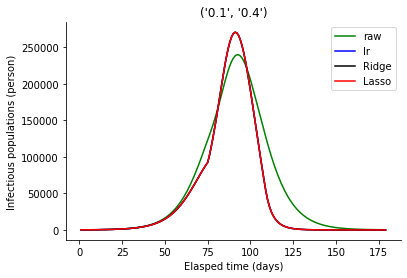

lr,lassoとridgeの回帰係数
[[array([ 5.37355133, 10.77778868])], [array([ 5.37355161, 10.77778639])], [array([ 5.37355133, 10.77778868])]]


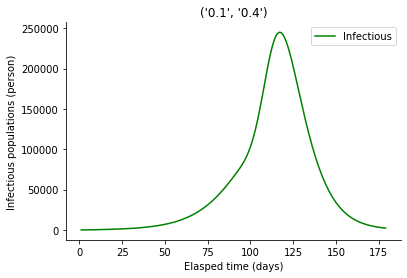

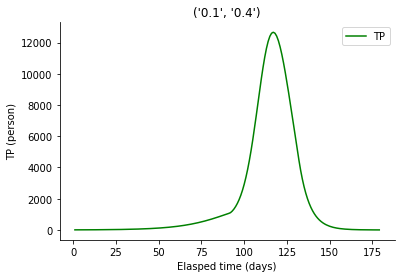

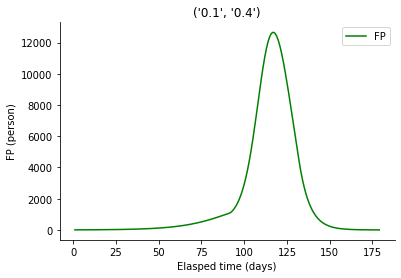

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0   18.966614       TP
1   18.966614       FP


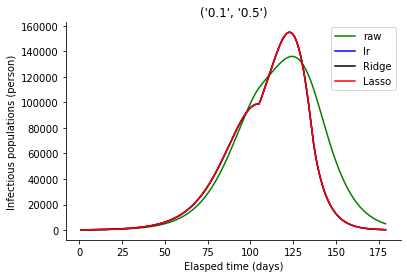

lr,lassoとridgeの回帰係数
[[array([ 7.36244957, 16.94056791])], [array([ 7.3624527 , 16.94055076])], [array([ 7.36244957, 16.94056791])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


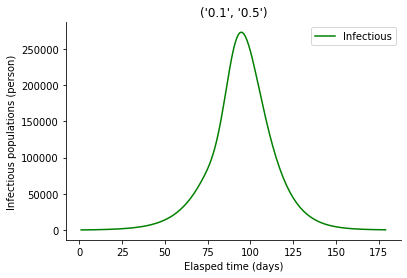

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


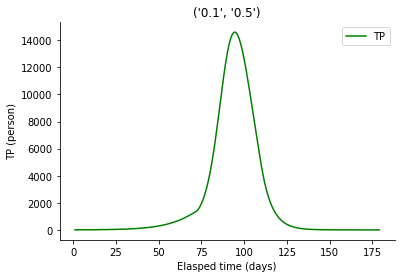

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


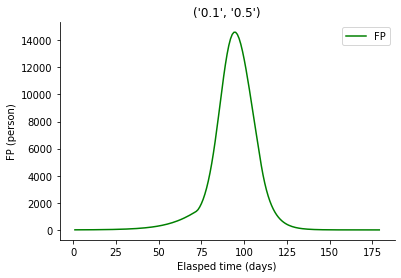

   VIF Factor features
0  558.148601       TP
1  558.148601       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 250153358443.6146, tolerance: 20587869198.88571
  positive)


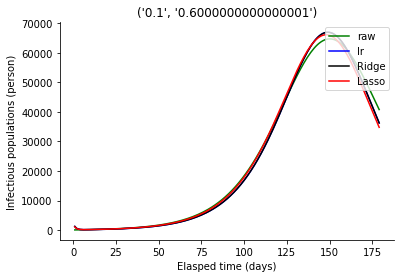

lr,lassoとridgeの回帰係数
[[array([  65.71956526, -223.2494888 ])], [array([  57.04981003, -186.09466903])], [array([  65.71956472, -223.2494865 ])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


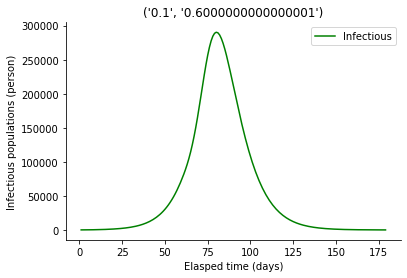

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


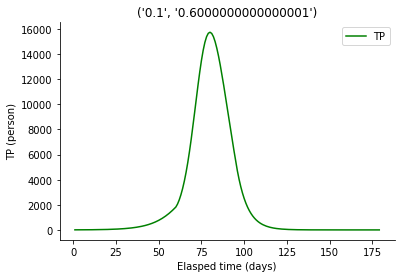

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


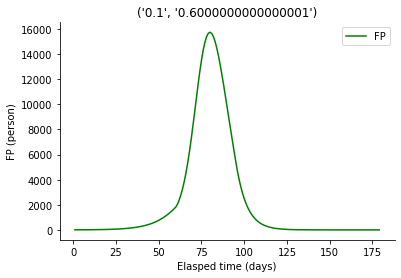

    VIF Factor features
0  15521.86119       TP
1  15521.86119       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1848993558.3817196, tolerance: 697401334.1276807
  positive)


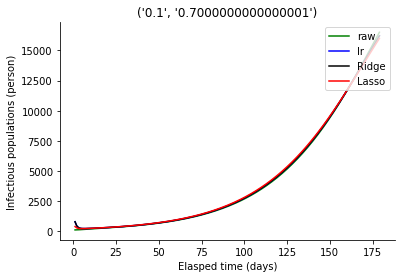

lr,lassoとridgeの回帰係数
[[array([ 33.11702937, -90.43308056])], [array([13.3433487 , -5.56015266])], [array([ 33.11689316, -90.43249591])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


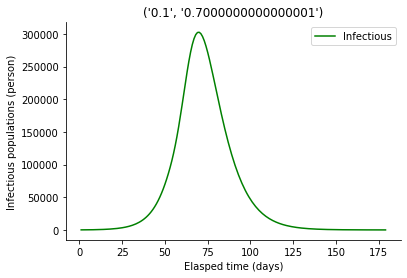

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


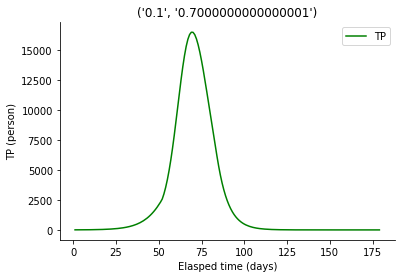

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


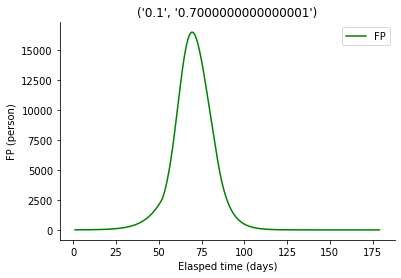

   VIF Factor features
0  160.211277       TP
1  160.211277       FP


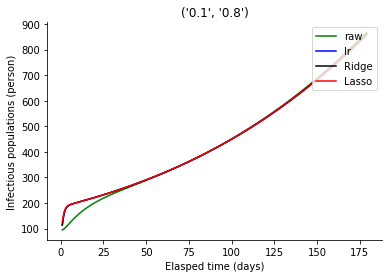

lr,lassoとridgeの回帰係数
[[array([ 0.12833892, 57.10399153])], [array([ 0.70403474, 54.51285511])], [array([ 0.12849494, 57.10328865])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


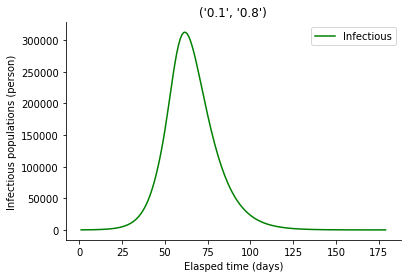

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


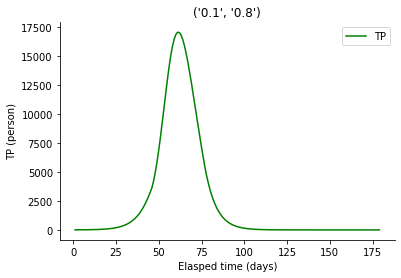

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


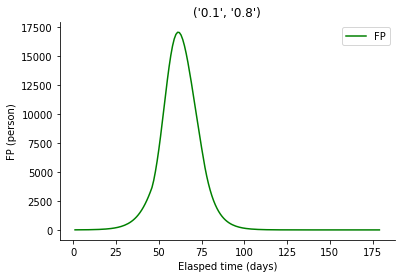

   VIF Factor features
0    7.321444       TP
1    7.321444       FP


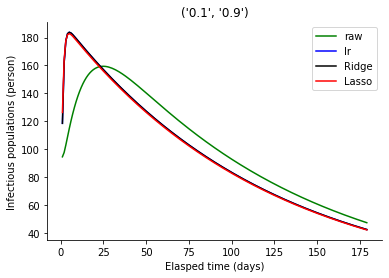

lr,lassoとridgeの回帰係数
[[array([5.71467753e-02, 6.24194228e+01])], [array([ 0.42025506, 60.31732405])], [array([5.7302389e-02, 6.2418550e+01])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


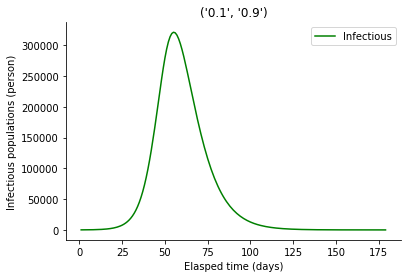

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


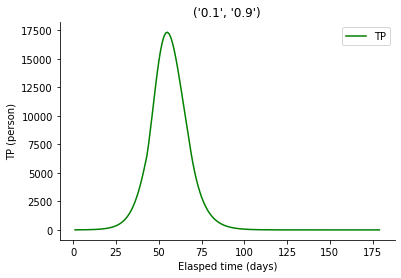

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


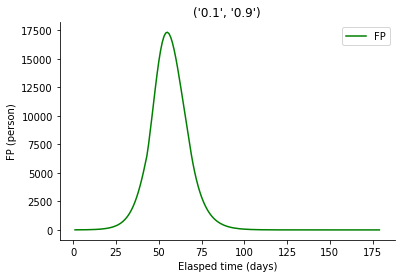

   VIF Factor features
0    3.202444       TP
1    3.202444       FP


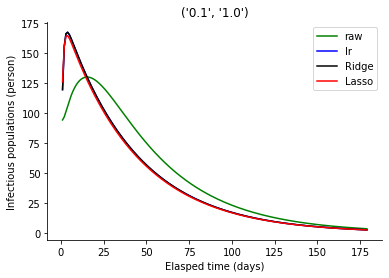

lr,lassoとridgeの回帰係数
[[array([ 0.19704462, 62.46984803])], [array([ 0.55077102, 59.51744488])], [array([ 0.19719453, 62.46867764])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


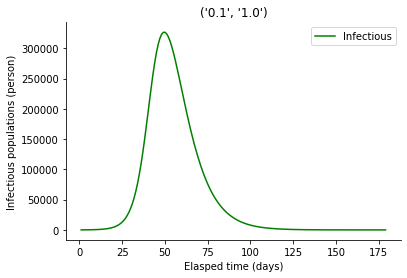

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


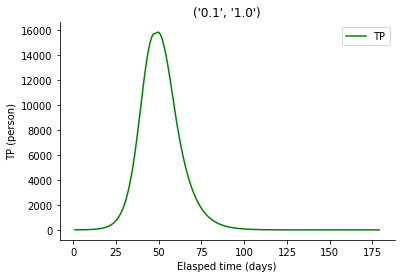

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


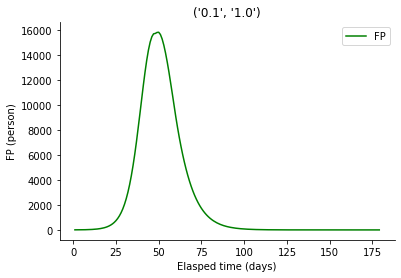

   VIF Factor features
0         NaN       TP
1         1.0       FP


C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


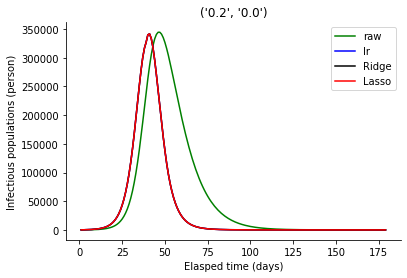

lr,lassoとridgeの回帰係数
[[array([ 0.        , 21.78830869])], [array([ 0.        , 21.78830863])], [array([ 0.        , 21.78830869])]]


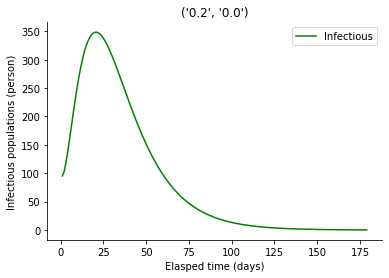

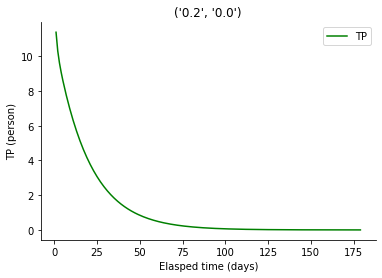

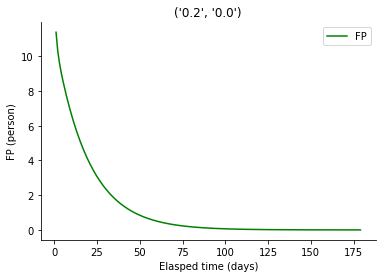

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.404669       TP
1    4.404669       FP


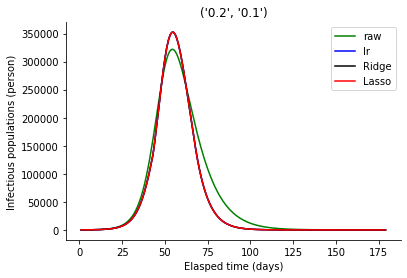

lr,lassoとridgeの回帰係数
[[array([21.77621648, -2.30999748])], [array([21.77621613, -2.30999702])], [array([21.77621648, -2.30999748])]]


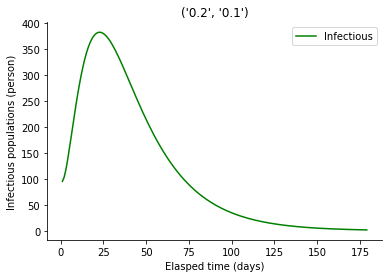

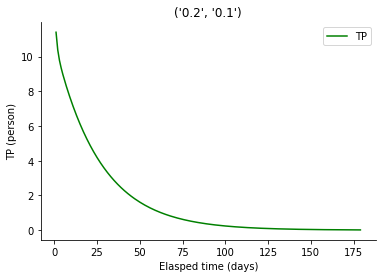

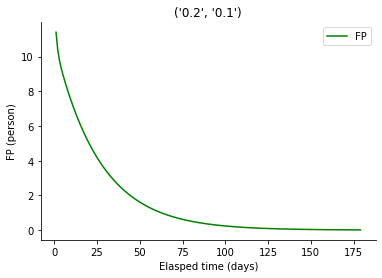

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.991337       TP
1    4.991337       FP


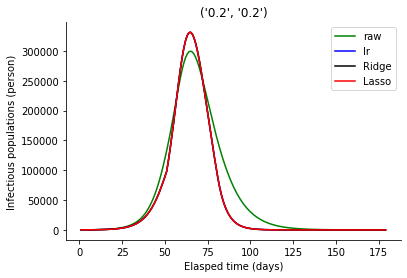

lr,lassoとridgeの回帰係数
[[array([10.96124696, -0.33598529])], [array([10.96124678, -0.33598483])], [array([10.96124696, -0.33598529])]]


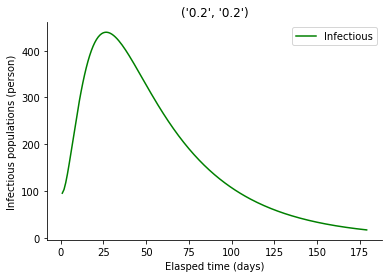

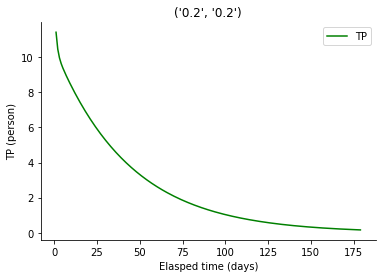

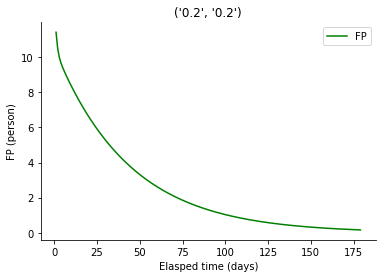

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    5.601632       TP
1    5.601632       FP


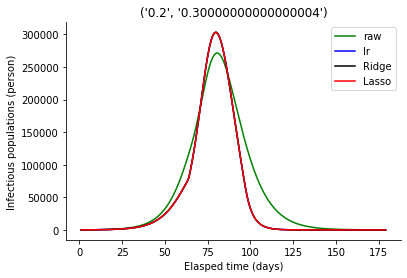

lr,lassoとridgeの回帰係数
[[array([7.20943295, 2.17084656])], [array([7.2094331 , 2.17084603])], [array([7.20943295, 2.17084656])]]


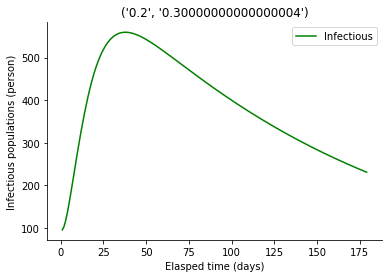

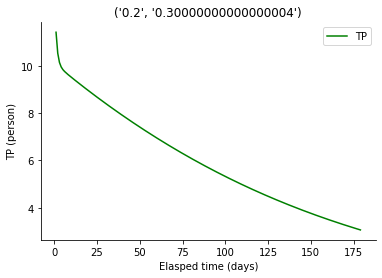

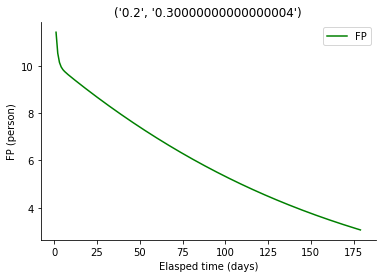

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    6.907268       TP
1    6.907268       FP


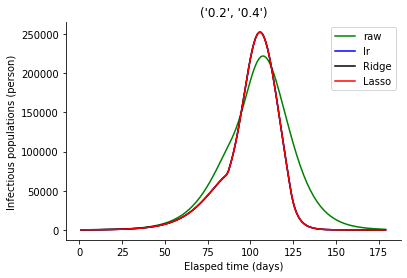

lr,lassoとridgeの回帰係数
[[array([5.13222056, 7.302778  ])], [array([5.13222078, 7.30277711])], [array([5.13222056, 7.302778  ])]]


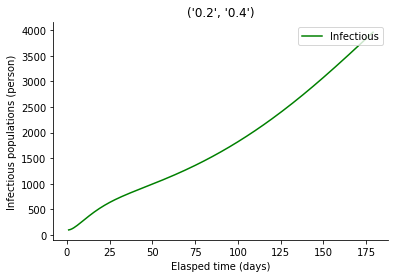

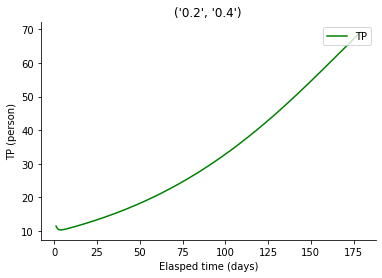

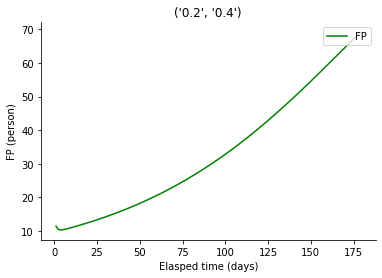

   VIF Factor features
0  291.228979       TP
1  291.228979       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 828405928590.2318, tolerance: 28588846204.980633
  positive)


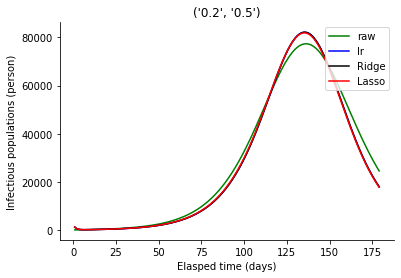

lr,lassoとridgeの回帰係数
[[array([  75.72552378, -122.67439924])], [array([  73.82059977, -118.73911533])], [array([  75.72552368, -122.67439904])]]


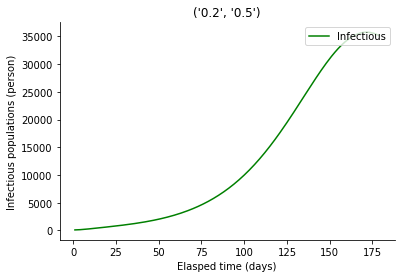

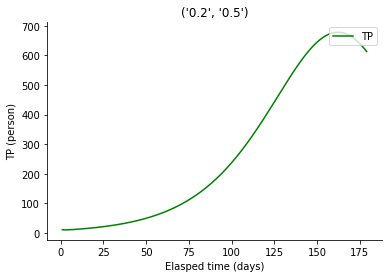

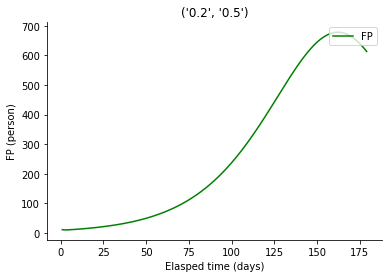

    VIF Factor features
0  8545.959037       TP
1  8545.959037       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7379570722.495379, tolerance: 1373857624.2690923
  positive)


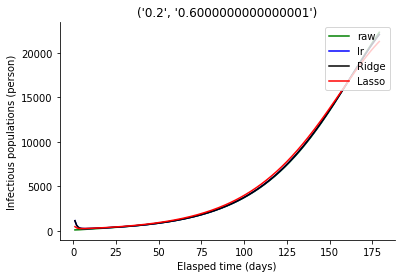

lr,lassoとridgeの回帰係数
[[array([ 56.47503791, -87.86730971])], [array([19.01148353, -9.68702997])], [array([ 56.47500704, -87.8672453 ])]]


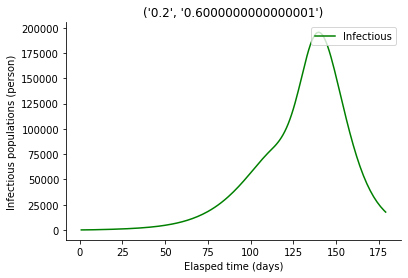

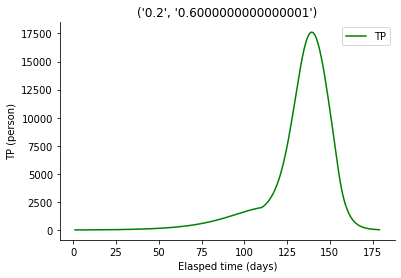

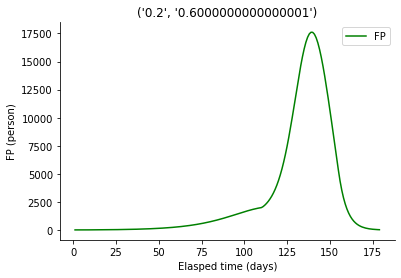

   VIF Factor features
0  145.190865       TP
1  145.190865       FP


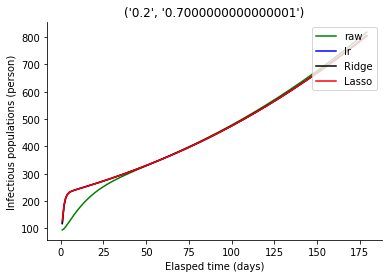

lr,lassoとridgeの回帰係数
[[array([-0.67878379, 35.0670638 ])], [array([-0.20173614, 34.01573343])], [array([-0.67872471, 35.06693327])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


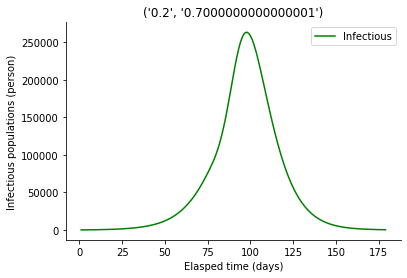

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


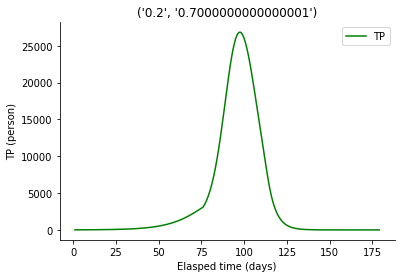

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


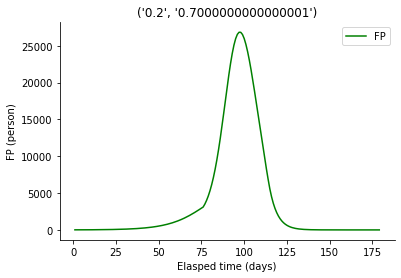

   VIF Factor features
0    6.740956       TP
1    6.740956       FP


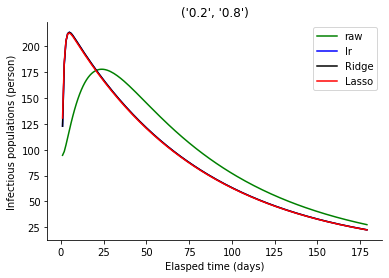

lr,lassoとridgeの回帰係数
[[array([-0.54575966, 36.70663654])], [array([-0.15747812, 35.64789352])], [array([-0.54570364, 36.70647691])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


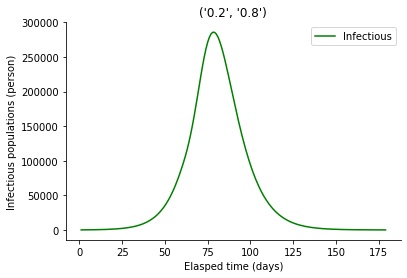

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


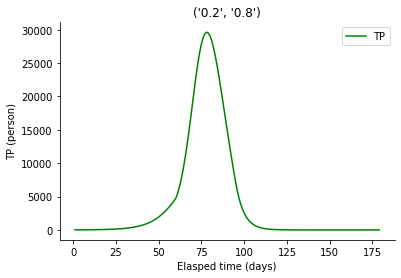

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


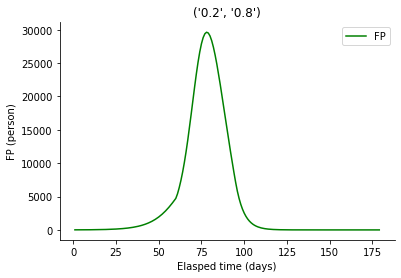

   VIF Factor features
0    3.267989       TP
1    3.267989       FP


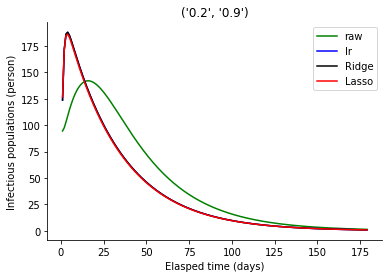

lr,lassoとridgeの回帰係数
[[array([-0.18715491, 35.289876  ])], [array([ 0.        , 34.46471182])], [array([-0.18710367, 35.28967449])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


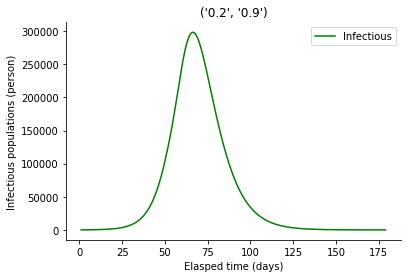

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


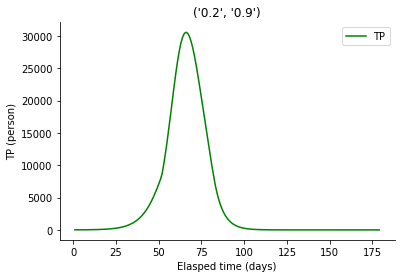

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


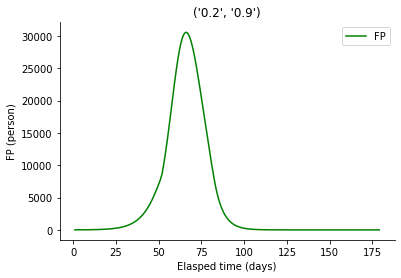

   VIF Factor features
0    2.409107       TP
1    2.409107       FP


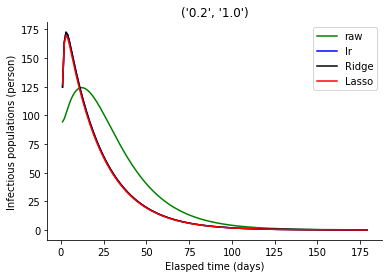

lr,lassoとridgeの回帰係数
[[array([1.18129189e-02, 3.48822625e+01])], [array([ 0.181561  , 33.82602764])], [array([1.18616289e-02, 3.48820098e+01])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


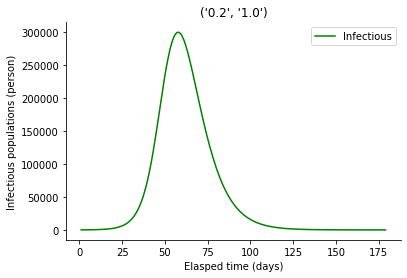

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


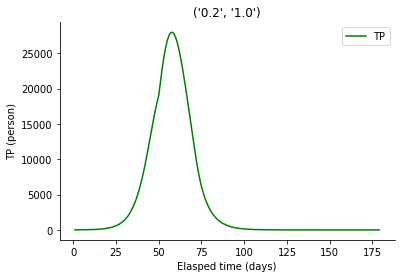

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


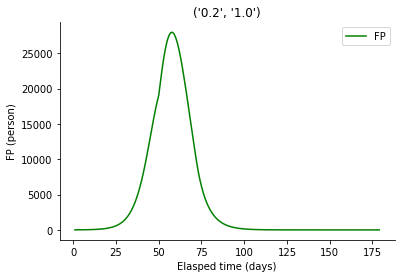

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         NaN       TP
1         1.0       FP


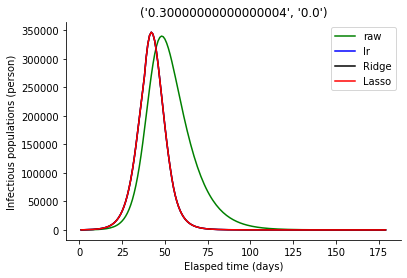

lr,lassoとridgeの回帰係数
[[array([ 0.        , 14.88409009])], [array([ 0.        , 14.88409006])], [array([ 0.        , 14.88409009])]]


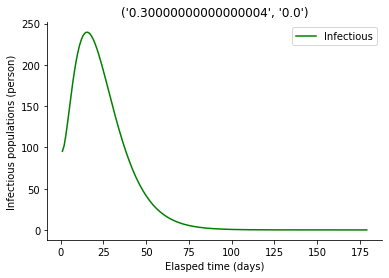

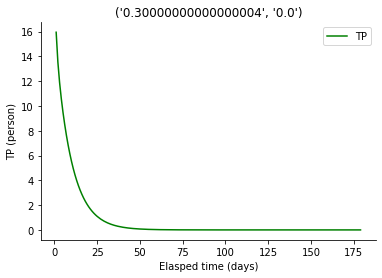

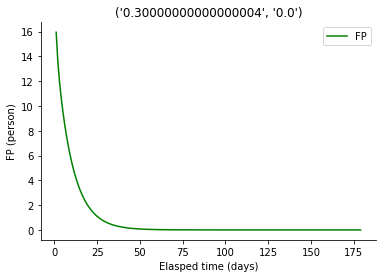

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0     4.30072       TP
1     4.30072       FP


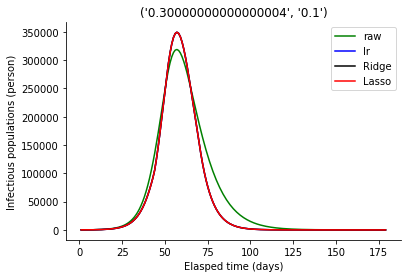

lr,lassoとridgeの回帰係数
[[array([21.29021745, -1.23108745])], [array([21.29021716, -1.2310872 ])], [array([21.29021745, -1.23108745])]]


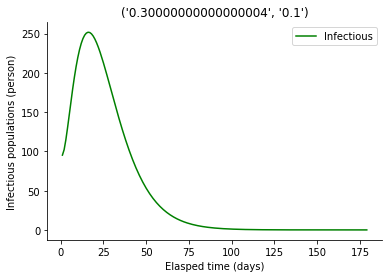

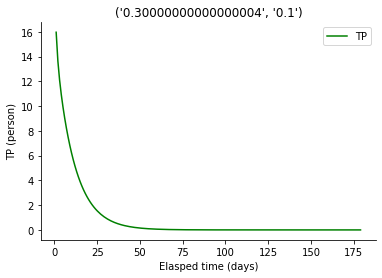

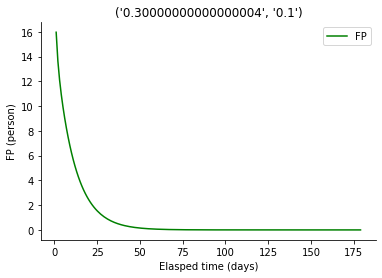

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.948365       TP
1    4.948365       FP


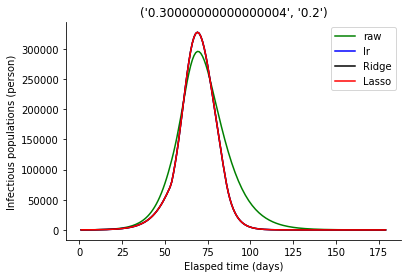

lr,lassoとridgeの回帰係数
[[array([10.76447611, -0.05383075])], [array([10.76447596, -0.05383051])], [array([10.76447611, -0.05383075])]]


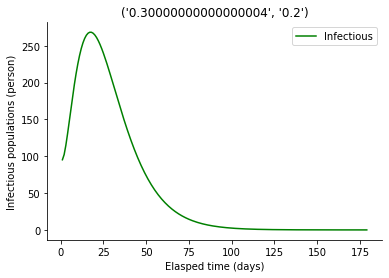

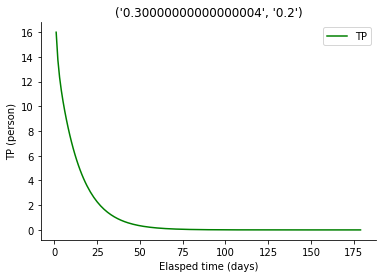

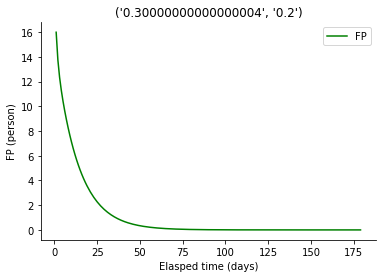

   VIF Factor features
0    5.734004       TP
1    5.734004       FP


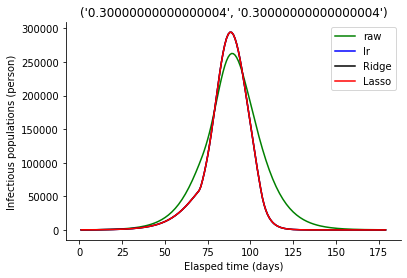

lr,lassoとridgeの回帰係数
[[array([7.10547177, 1.77087833])], [array([7.10547188, 1.77087805])], [array([7.10547177, 1.77087833])]]


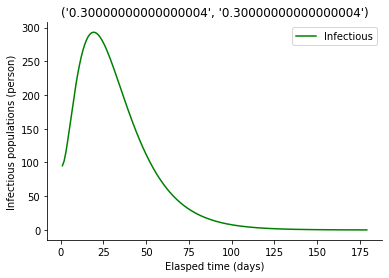

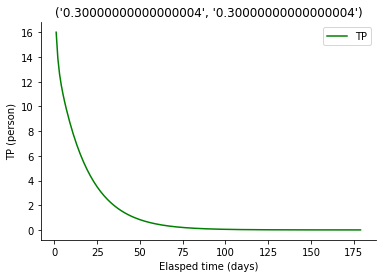

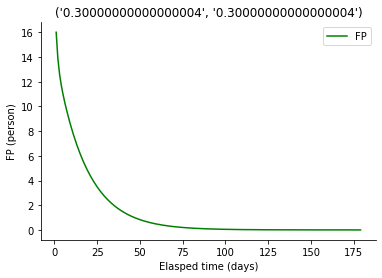

   VIF Factor features
0   10.011648       TP
1   10.011648       FP


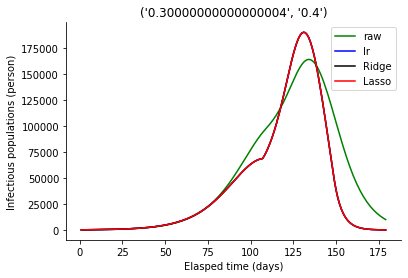

lr,lassoとridgeの回帰係数
[[array([ 4.60057   , 10.35723346])], [array([ 4.60057051, 10.35723227])], [array([ 4.60057   , 10.35723346])]]


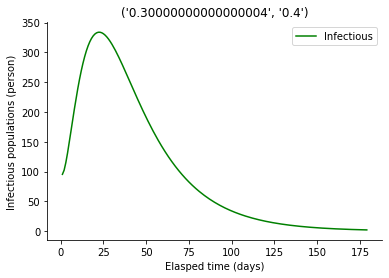

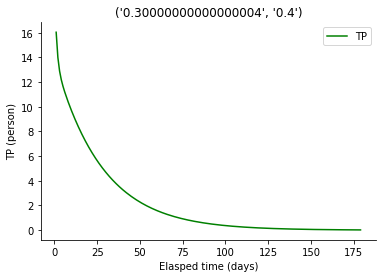

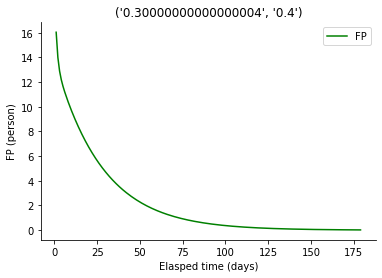

    VIF Factor features
0  1384.374381       TP
1  1384.374381       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60555278406.744865, tolerance: 6161933036.463493
  positive)


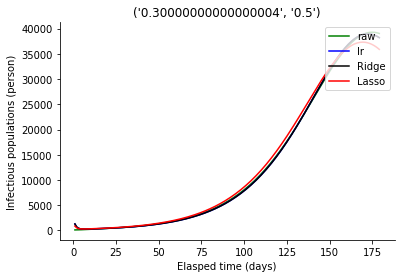

lr,lassoとridgeの回帰係数
[[array([ 74.99229728, -77.71752439])], [array([ 47.13900913, -39.98482261])], [array([ 74.992296  , -77.71752267])]]


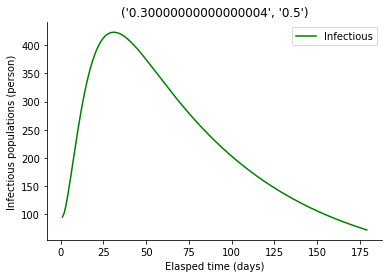

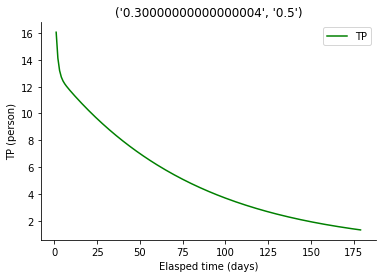

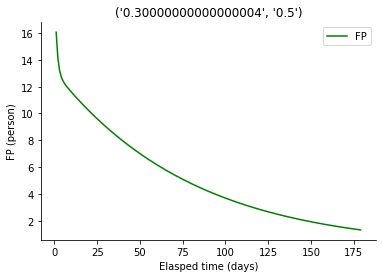

   VIF Factor features
0  446.436039       TP
1  446.436039       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 94556315.93879859, tolerance: 13709606.468988158
  positive)


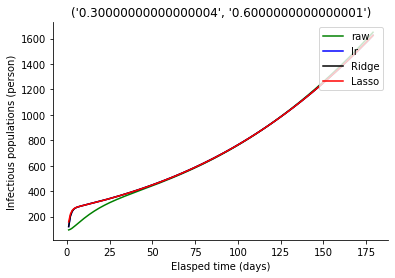

lr,lassoとridgeの回帰係数
[[array([-1.48734531, 26.73585159])], [array([ 0.59034199, 23.80333841])], [array([-1.48730641, 26.73579658])]]


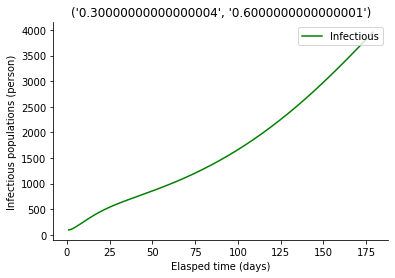

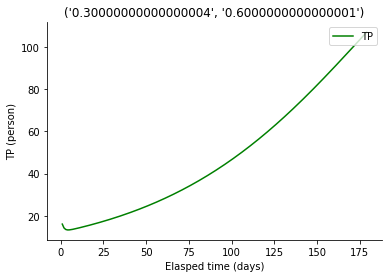

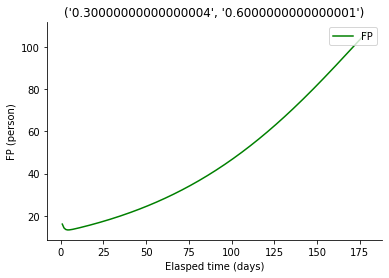

   VIF Factor features
0    8.454151       TP
1    8.454151       FP


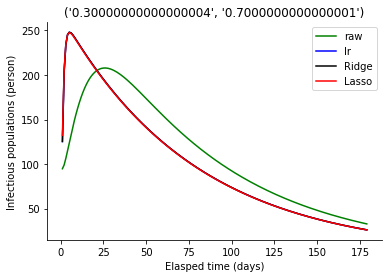

lr,lassoとridgeの回帰係数
[[array([-1.37301545, 28.40794696])], [array([-1.0061752 , 27.78106633])], [array([-1.37297935, 28.40788248])]]


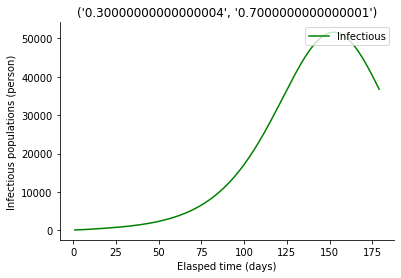

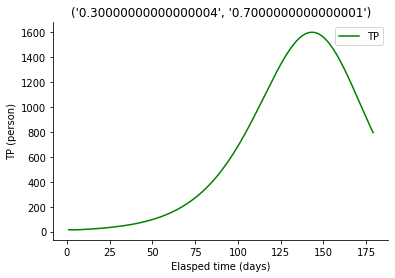

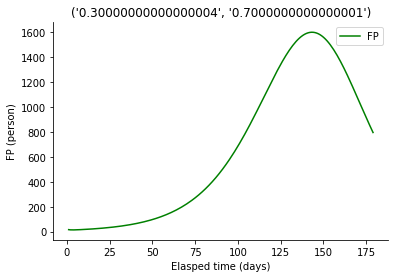

   VIF Factor features
0    3.677848       TP
1    3.677848       FP


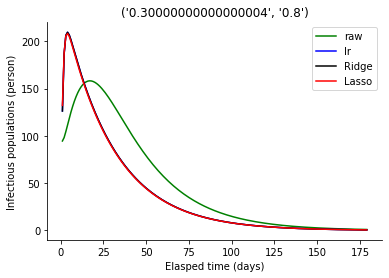

lr,lassoとridgeの回帰係数
[[array([-0.6732723, 26.2081827])], [array([-0.34616459, 25.47663576])], [array([-0.67324137, 26.20810634])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


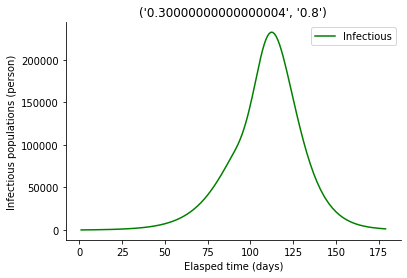

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


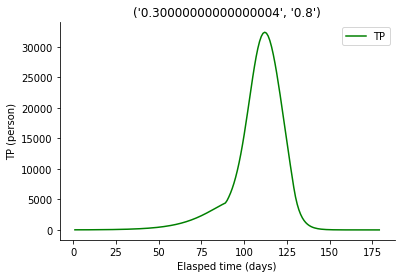

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


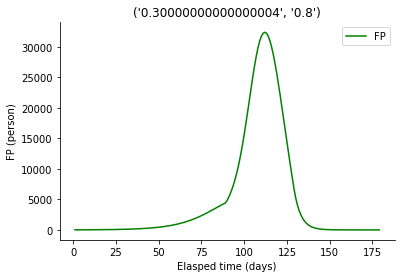

   VIF Factor features
0    2.627589       TP
1    2.627589       FP


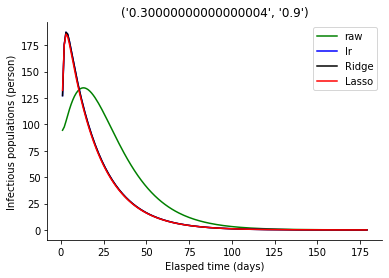

lr,lassoとridgeの回帰係数
[[array([-0.30043218, 25.2267632 ])], [array([-1.32610150e-03,  2.43701616e+01])], [array([-0.30040401, 25.22667106])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


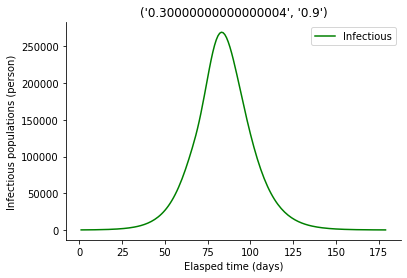

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


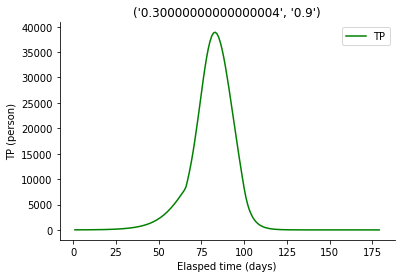

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


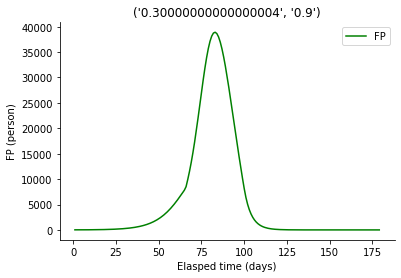

   VIF Factor features
0    2.169006       TP
1    2.169006       FP


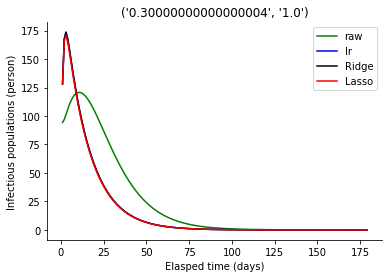

lr,lassoとridgeの回帰係数
[[array([-0.09045481, 24.94775263])], [array([1.75679314e-02, 2.43331418e+01])], [array([-0.09042813, 24.94764102])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


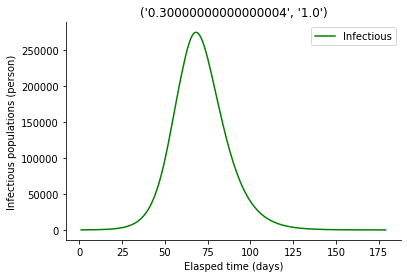

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


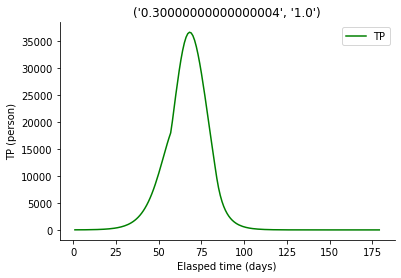

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


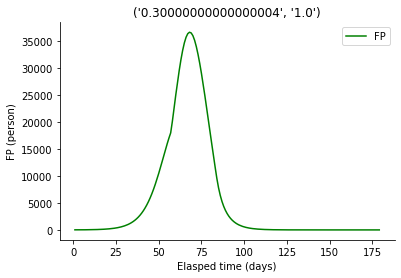

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         NaN       TP
1         1.0       FP


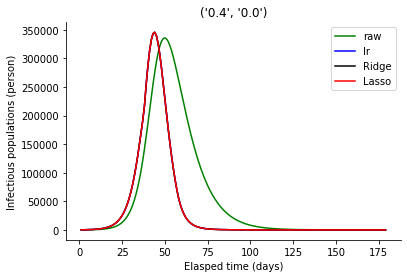

lr,lassoとridgeの回帰係数
[[array([ 0.        , 11.32725571])], [array([ 0.       , 11.3272557])], [array([ 0.        , 11.32725571])]]


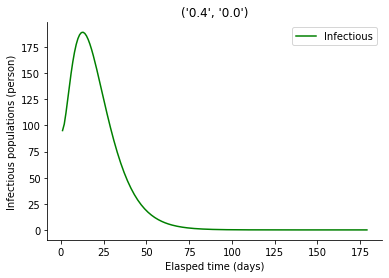

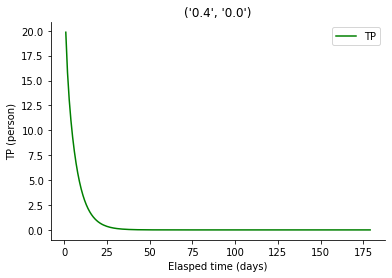

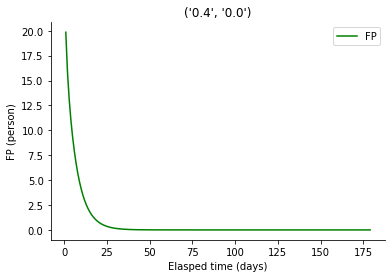

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.219896       TP
1    4.219896       FP


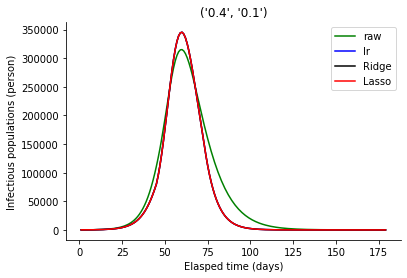

lr,lassoとridgeの回帰係数
[[array([20.98445808, -0.74200541])], [array([20.98445782, -0.74200524])], [array([20.98445808, -0.74200541])]]


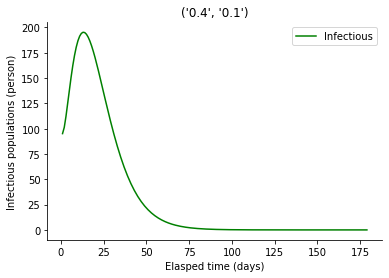

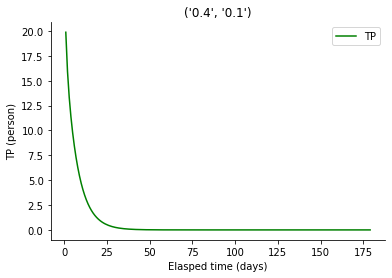

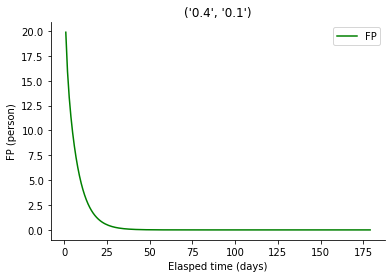

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0     4.92037       TP
1     4.92037       FP


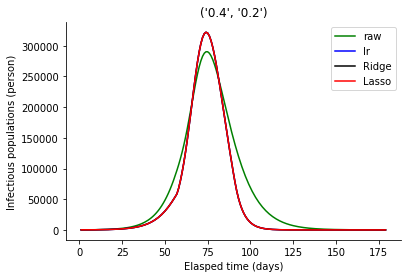

lr,lassoとridgeの回帰係数
[[array([10.64597538,  0.09237916])], [array([10.64597548,  0.09237902])], [array([10.64597538,  0.09237916])]]


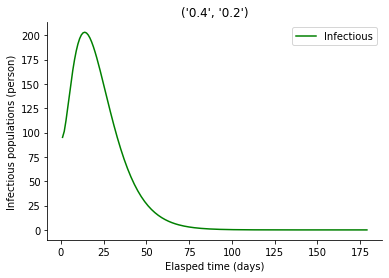

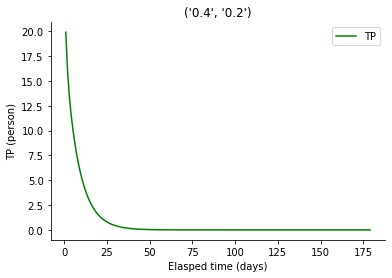

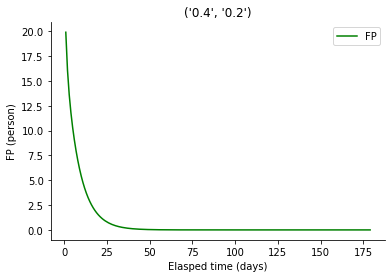

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    5.989641       TP
1    5.989641       FP


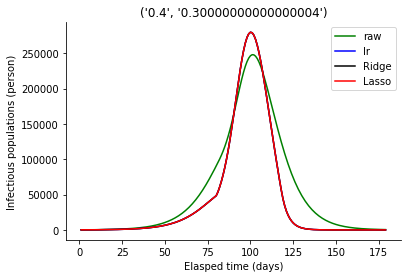

lr,lassoとridgeの回帰係数
[[array([7.03556103, 1.78415802])], [array([7.03556115, 1.78415779])], [array([7.03556103, 1.78415802])]]


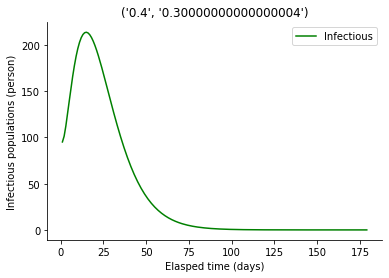

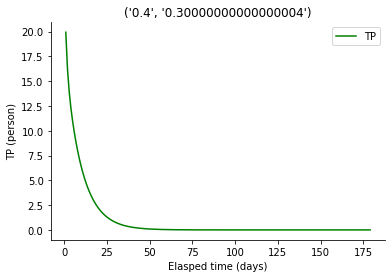

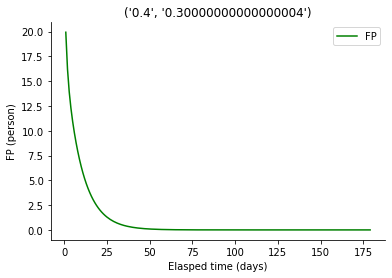

   VIF Factor features
0  242.269338       TP
1  242.269338       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 523016643996.31793, tolerance: 22694005701.267056
  positive)


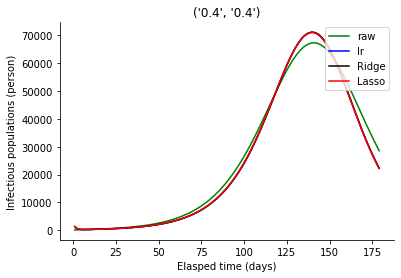

lr,lassoとridgeの回帰係数
[[array([ 93.07372363, -69.57110605])], [array([ 91.93554104, -68.4589071 ])], [array([ 93.07372354, -69.57110596])]]


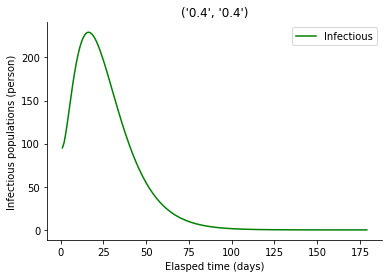

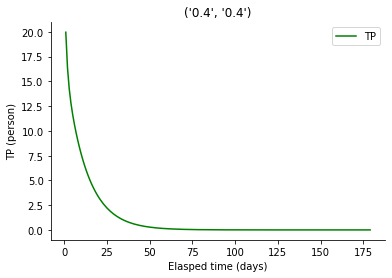

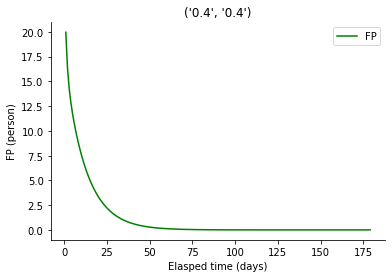

    VIF Factor features
0  5506.155892       TP
1  5506.155892       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 504188364.5010924, tolerance: 166140144.63714367
  positive)


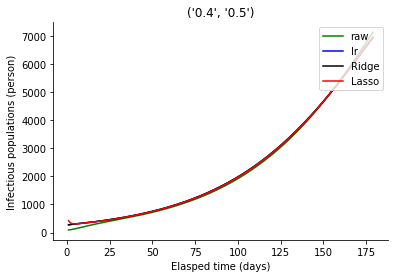

lr,lassoとridgeの回帰係数
[[array([ 7.75843883, 11.58313254])], [array([17.38121491,  1.92371029])], [array([ 7.75844361, 11.58312774])]]


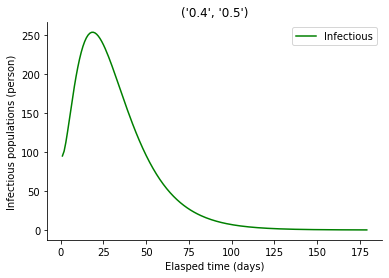

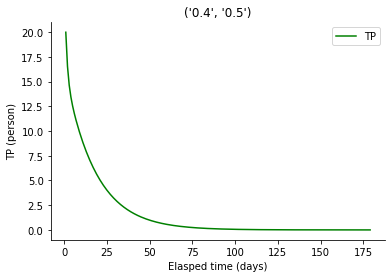

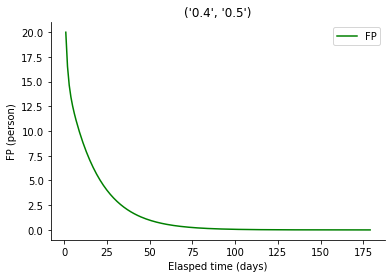

   VIF Factor features
0   15.767671       TP
1   15.767671       FP


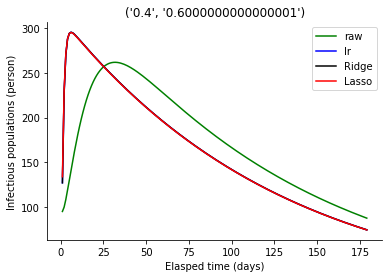

lr,lassoとridgeの回帰係数
[[array([-2.67363881, 25.07238218])], [array([-2.27705794, 24.61147263])], [array([-2.67360754, 25.0723449 ])]]


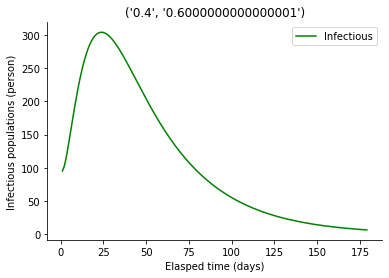

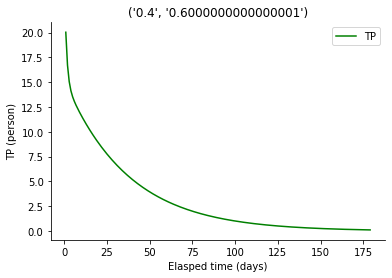

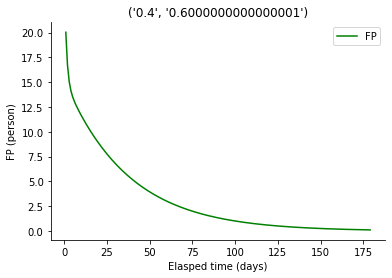

   VIF Factor features
0    4.553812       TP
1    4.553812       FP


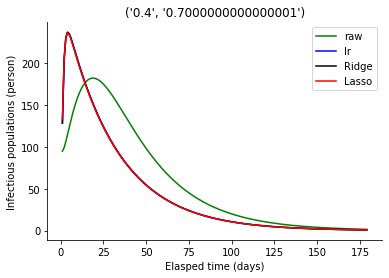

lr,lassoとridgeの回帰係数
[[array([-1.38470393, 22.06979756])], [array([-1.04691289, 21.55850772])], [array([-1.38467955, 22.06975714])]]


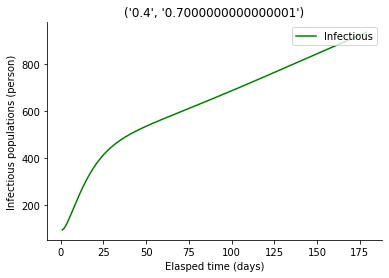

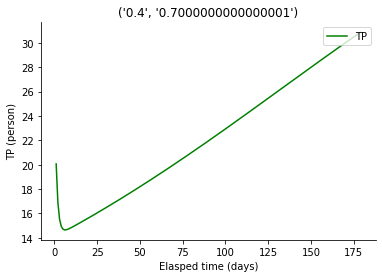

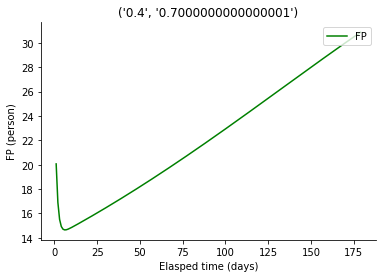

   VIF Factor features
0    3.000974       TP
1    3.000974       FP


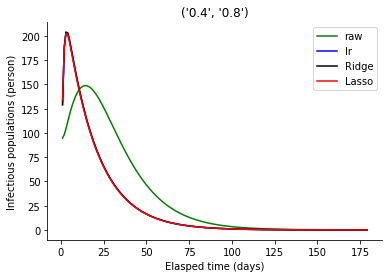

lr,lassoとridgeの回帰係数
[[array([-0.71712586, 20.52379058])], [array([-0.41739741, 19.94267188])], [array([-0.717105  , 20.52374421])]]


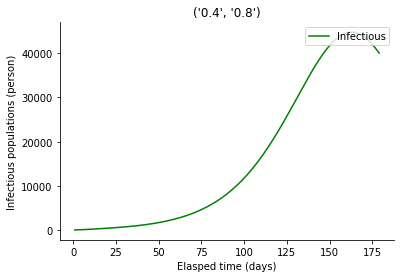

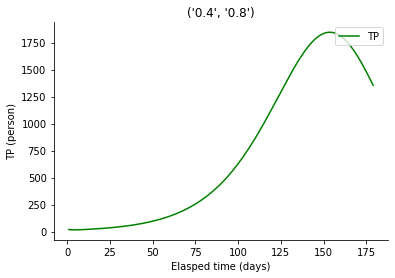

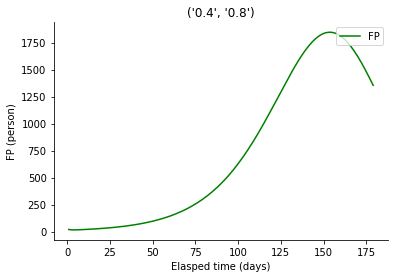

   VIF Factor features
0    2.392382       TP
1    2.392382       FP


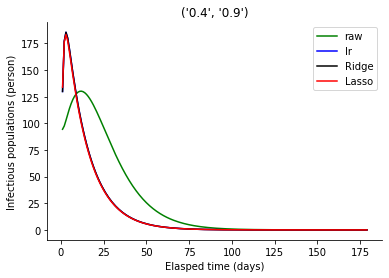

lr,lassoとridgeの回帰係数
[[array([-0.35708337, 19.85629501])], [array([-0.08484433, 19.19340772])], [array([-0.35706438, 19.85624045])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


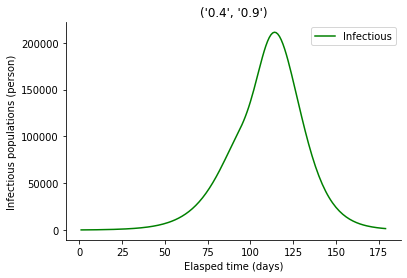

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


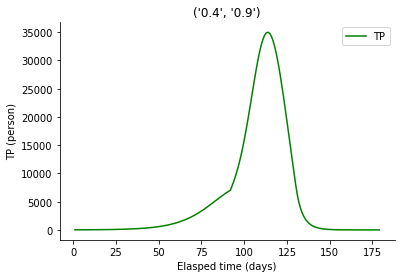

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


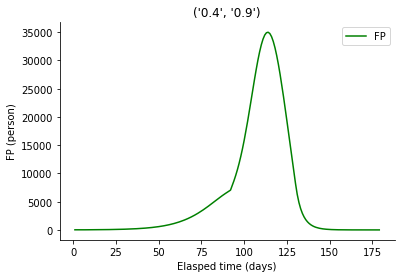

   VIF Factor features
0    2.067662       TP
1    2.067662       FP


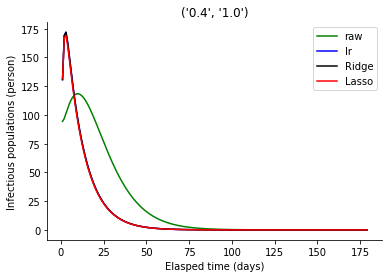

lr,lassoとridgeの回帰係数
[[array([-0.14859373, 19.67832804])], [array([ 0.        , 19.11510331])], [array([-0.14857579, 19.67826329])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


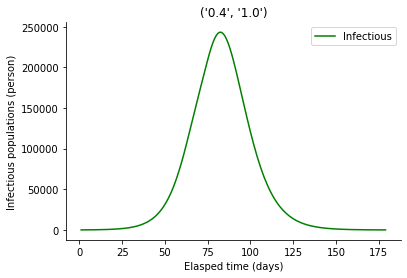

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


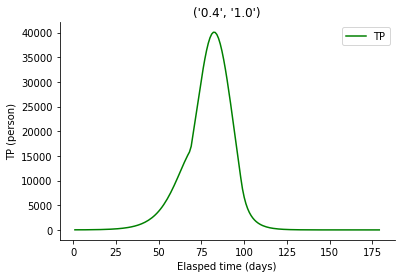

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


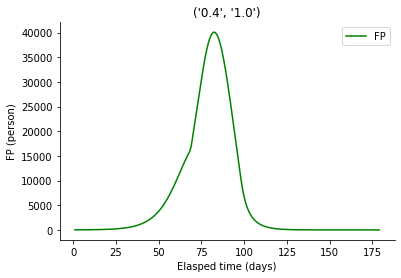

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0         NaN       TP
1         1.0       FP


C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


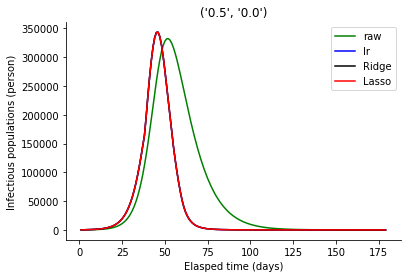

lr,lassoとridgeの回帰係数
[[array([0.        , 9.16191678])], [array([0.        , 9.16191677])], [array([0.        , 9.16191678])]]


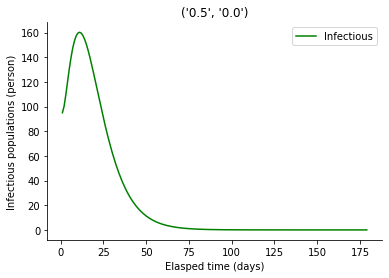

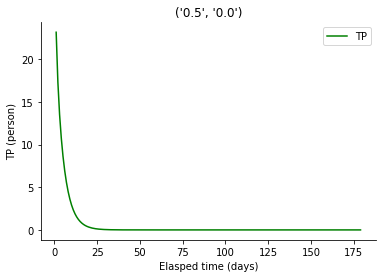

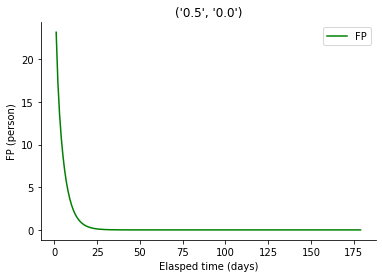

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.158787       TP
1    4.158787       FP


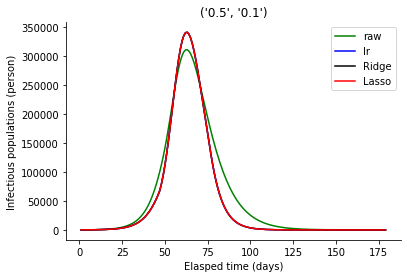

lr,lassoとridgeの回帰係数
[[array([20.77832765, -0.47316033])], [array([20.7783274, -0.4731602])], [array([20.77832765, -0.47316033])]]


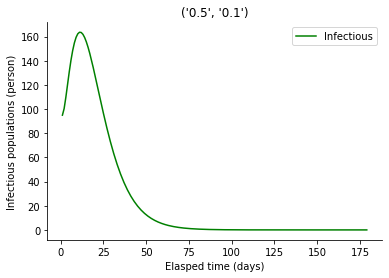

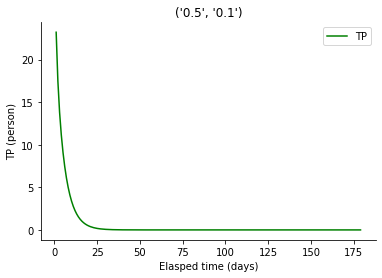

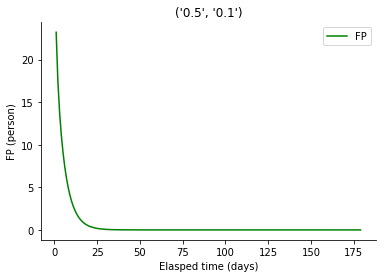

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.919198       TP
1    4.919198       FP


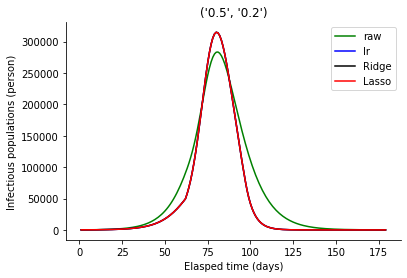

lr,lassoとridgeの回帰係数
[[array([10.57605033,  0.19211939])], [array([10.57605043,  0.19211929])], [array([10.57605033,  0.19211939])]]


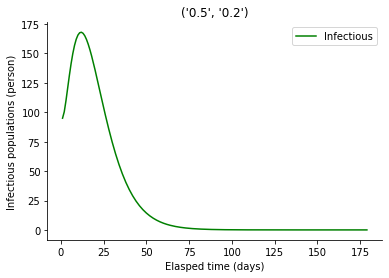

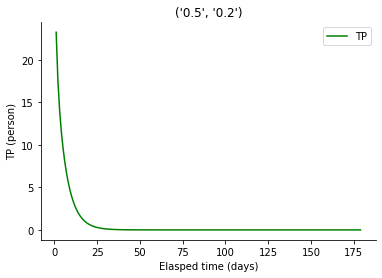

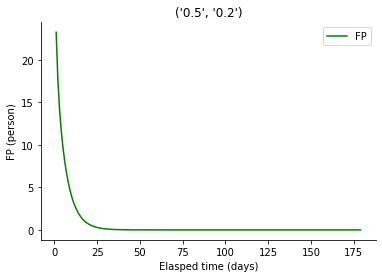

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    6.677454       TP
1    6.677454       FP


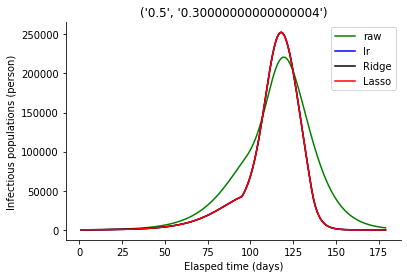

lr,lassoとridgeの回帰係数
[[array([6.92963962, 2.35982917])], [array([6.92963978, 2.35982894])], [array([6.92963962, 2.35982917])]]


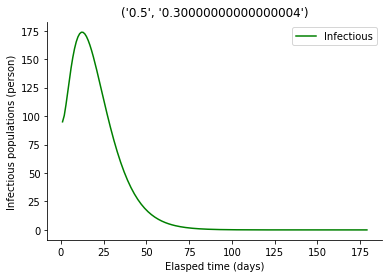

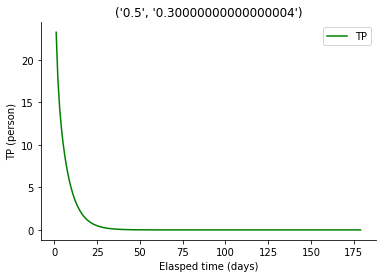

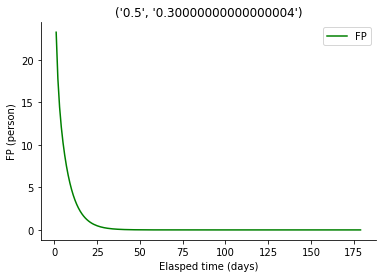

    VIF Factor features
0  1223.051003       TP
1  1223.051003       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 35562605009.85382, tolerance: 4823629240.86909
  positive)


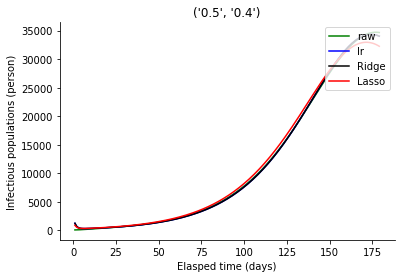

lr,lassoとridgeの回帰係数
[[array([ 89.07067645, -50.66911466])], [array([ 59.89898708, -28.30545698])], [array([ 89.07067472, -50.66911333])]]


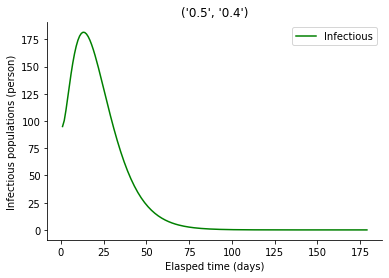

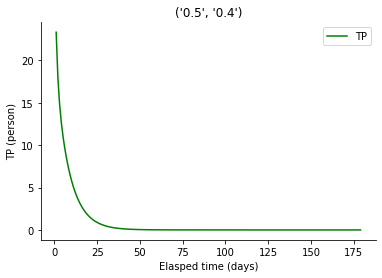

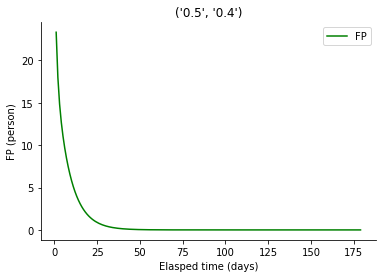

   VIF Factor features
0   94.770579       TP
1   94.770579       FP


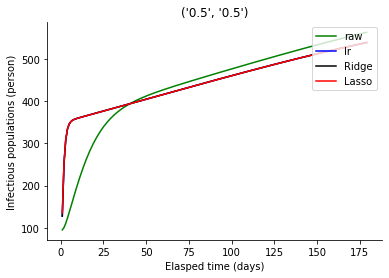

lr,lassoとridgeの回帰係数
[[array([-4.35989313, 22.93622319])], [array([-3.86666068, 22.52533713])], [array([-4.35986041, 22.93619582])]]


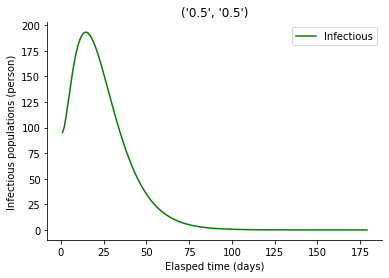

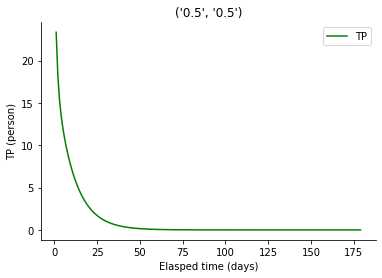

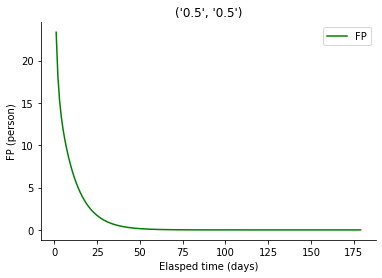

   VIF Factor features
0    6.558834       TP
1    6.558834       FP


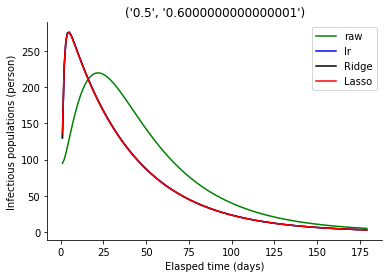

lr,lassoとridgeの回帰係数
[[array([-2.57105211, 20.39389862])], [array([-2.19235485, 19.98996521])], [array([-2.57102843, 20.3938717 ])]]


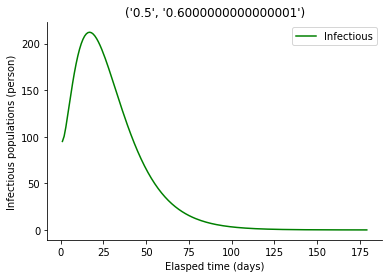

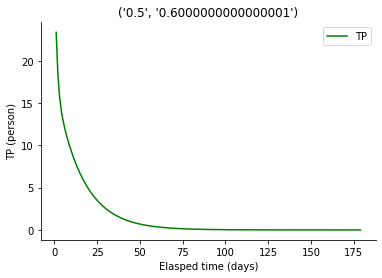

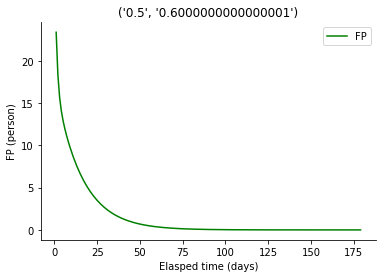

   VIF Factor features
0    3.635304       TP
1    3.635304       FP


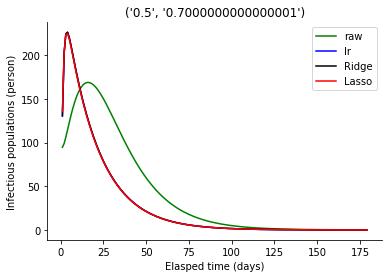

lr,lassoとridgeの回帰係数
[[array([-1.34290255, 18.0610539 ])], [array([-1.01931965, 17.61660444])], [array([-1.34288422, 18.06102548])]]


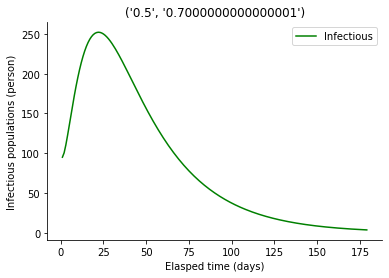

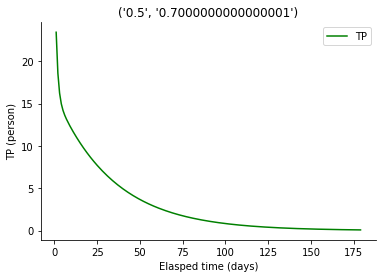

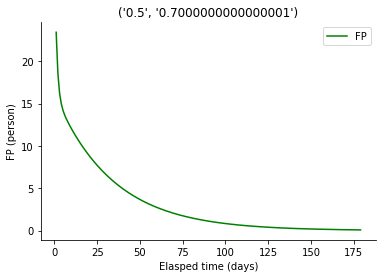

   VIF Factor features
0     2.72658       TP
1     2.72658       FP


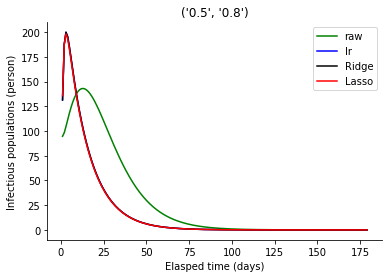

lr,lassoとridgeの回帰係数
[[array([-0.72516717, 16.95576425])], [array([-0.43907618, 16.45985822])], [array([-0.72515149, 16.95573226])]]


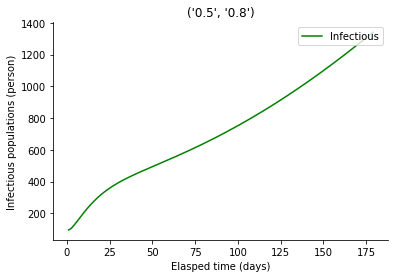

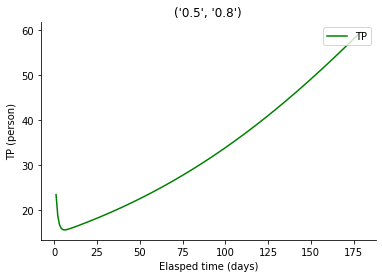

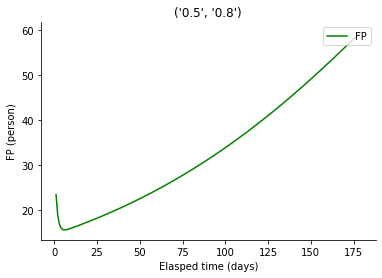

   VIF Factor features
0    2.283861       TP
1    2.283861       FP


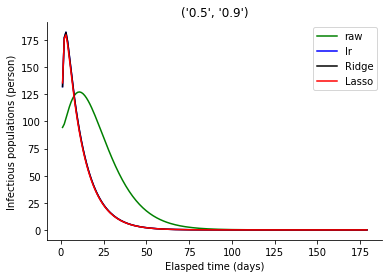

lr,lassoとridgeの回帰係数
[[array([-0.38359502, 16.48407292])], [array([-0.1253524 , 15.92893222])], [array([-0.38358077, 16.48403589])]]


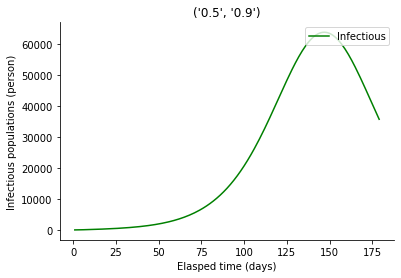

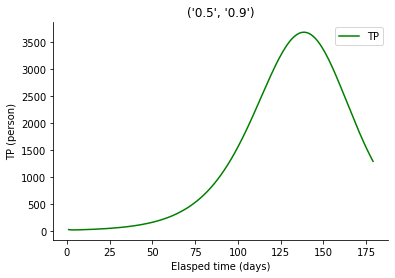

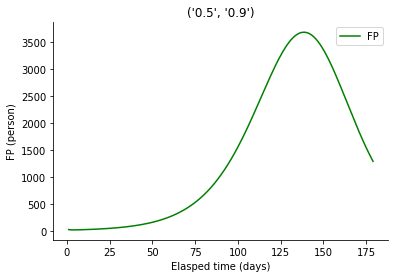

   VIF Factor features
0    2.021863       TP
1    2.021863       FP


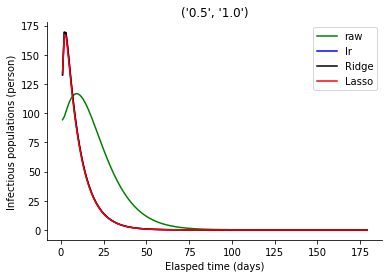

lr,lassoとridgeの回帰係数
[[array([-0.18171657, 16.37562342])], [array([-0.        , 15.84402396])], [array([-0.18170311, 16.37558009])]]


C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


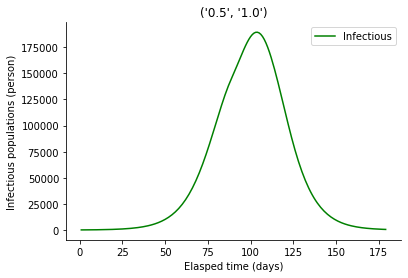

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


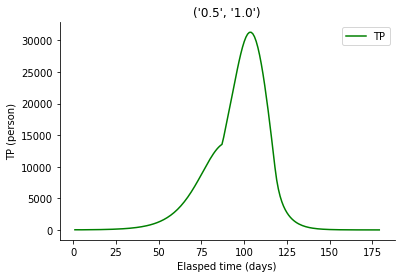

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


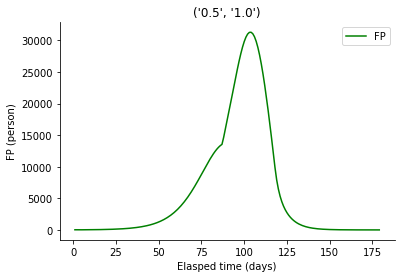

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         NaN       TP
1         1.0       FP


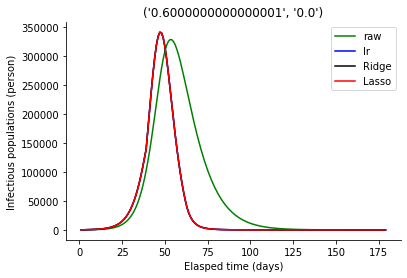

lr,lassoとridgeの回帰係数
[[array([0.        , 7.70557992])], [array([0.        , 7.70557992])], [array([0.        , 7.70557992])]]


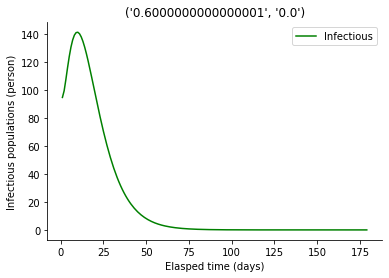

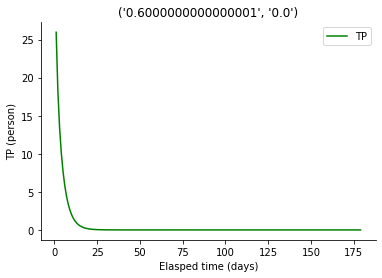

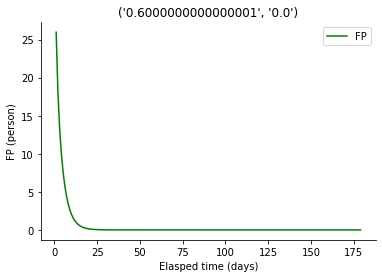

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.114958       TP
1    4.114958       FP


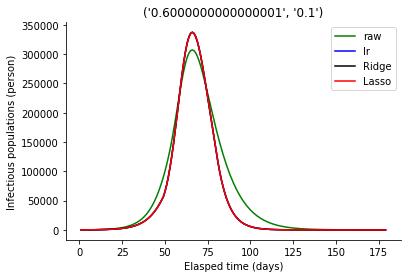

lr,lassoとridgeの回帰係数
[[array([20.63820929, -0.30815471])], [array([20.63820906, -0.30815461])], [array([20.63820929, -0.30815471])]]


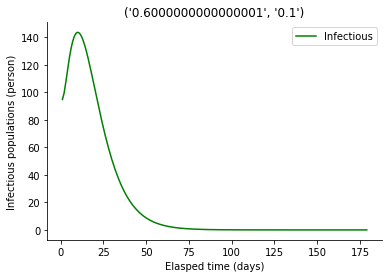

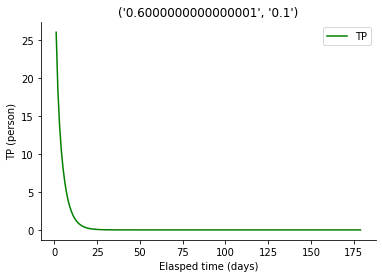

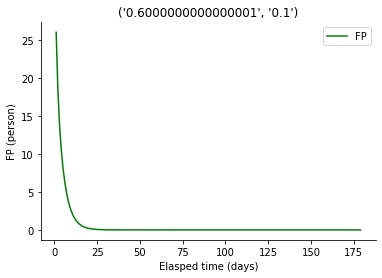

   VIF Factor features
0    4.958402       TP
1    4.958402       FP


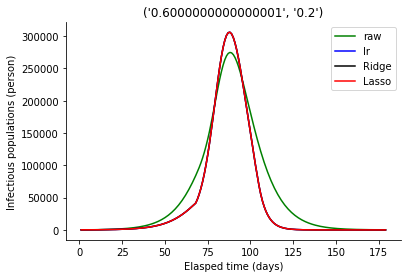

lr,lassoとridgeの回帰係数
[[array([10.5460243 ,  0.27745814])], [array([10.54602441,  0.27745804])], [array([10.5460243 ,  0.27745814])]]


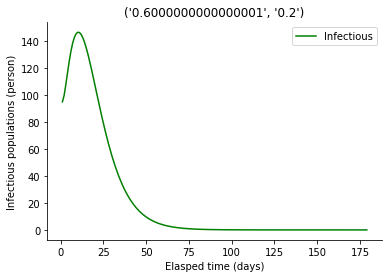

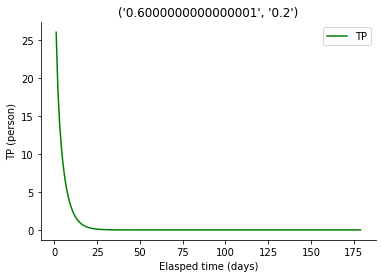

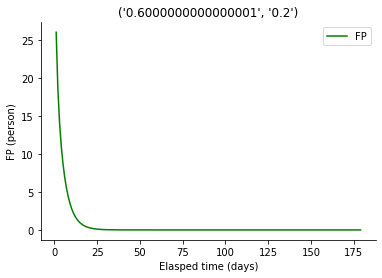

   VIF Factor features
0  123.560409       TP
1  123.560409       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1514185273688.7896, tolerance: 31399023503.619133
  positive)


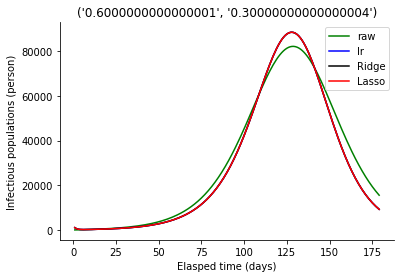

lr,lassoとridgeの回帰係数
[[array([106.01915232, -46.31290111])], [array([105.99611721, -46.29914476])], [array([106.01915227, -46.31290108])]]


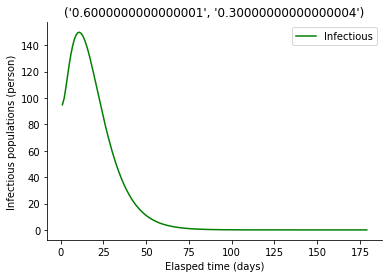

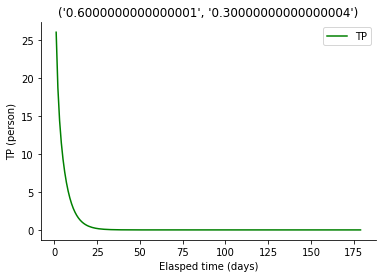

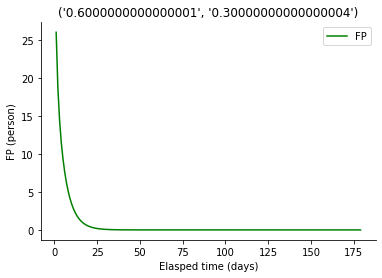

    VIF Factor features
0  5846.724334       TP
1  5846.724334       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 795721280.4483116, tolerance: 214036605.66316685
  positive)


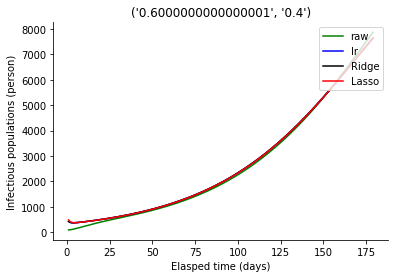

lr,lassoとridgeの回帰係数
[[array([19.00176579,  3.68424956])], [array([23.89858461,  0.59033642])], [array([19.00173768,  3.68426732])]]


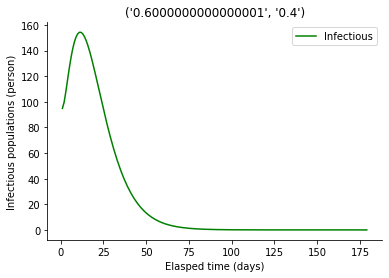

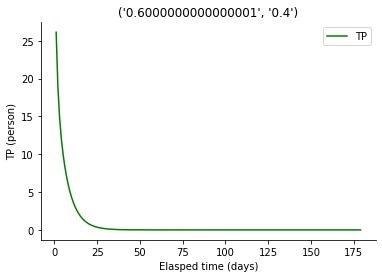

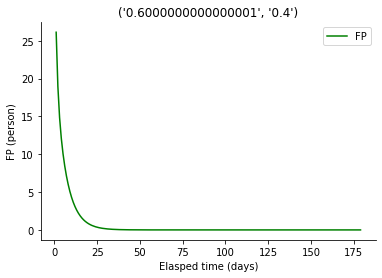

   VIF Factor features
0   13.911067       TP
1   13.911067       FP


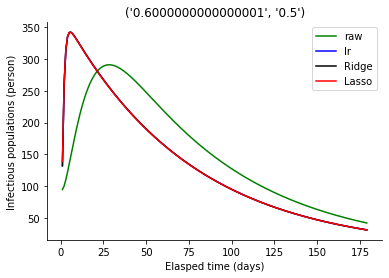

lr,lassoとridgeの回帰係数
[[array([-4.80225213, 20.6652863 ])], [array([-4.34067194, 20.31286113])], [array([-4.80222315, 20.66526361])]]


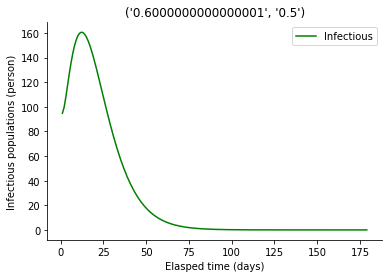

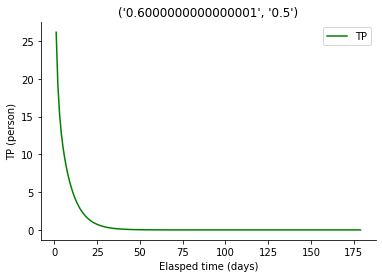

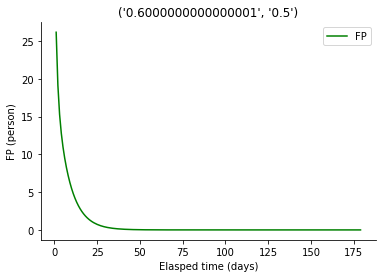

   VIF Factor features
0    4.840392       TP
1    4.840392       FP


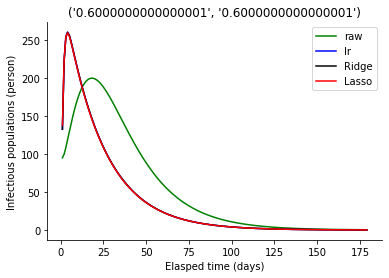

lr,lassoとridgeの回帰係数
[[array([-2.39410778, 17.06000485])], [array([-2.02148988, 16.68950951])], [array([-2.39408875, 17.05998419])]]


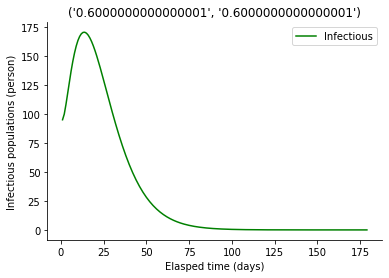

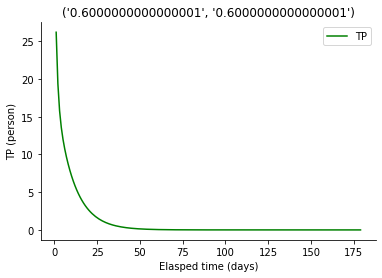

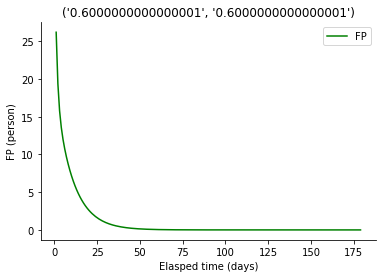

   VIF Factor features
0    3.250598       TP
1    3.250598       FP


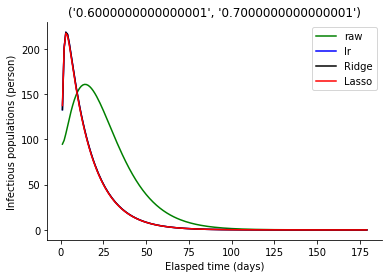

lr,lassoとridgeの回帰係数
[[array([-1.28662089, 15.33119517])], [array([-0.97004827, 14.9300667 ])], [array([-1.28660615, 15.33117365])]]


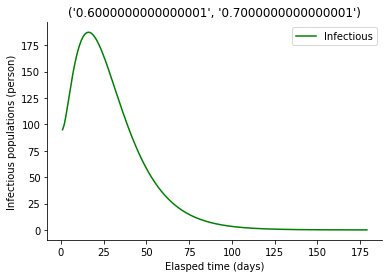

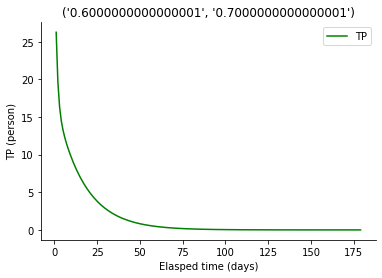

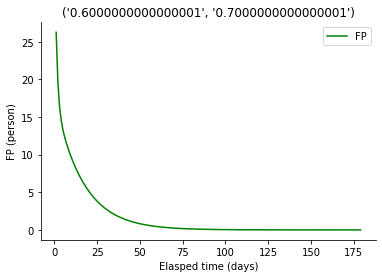

   VIF Factor features
0    2.591626       TP
1    2.591626       FP


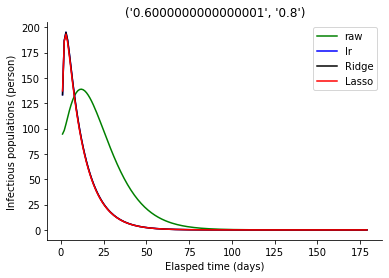

lr,lassoとridgeの回帰係数
[[array([-0.71536989, 14.50656369])], [array([-0.43690062, 14.06573152])], [array([-0.71535728, 14.50653979])]]


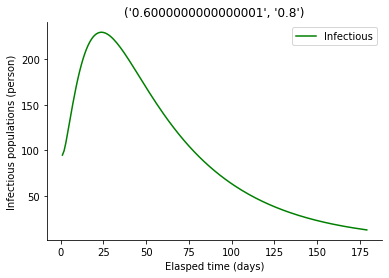

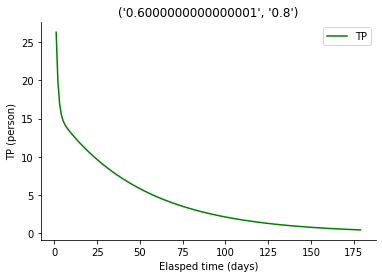

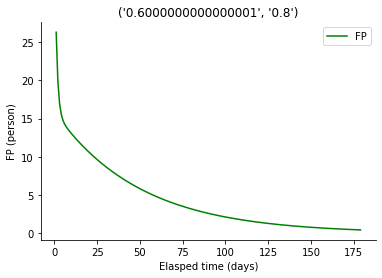

   VIF Factor features
0    2.231166       TP
1    2.231166       FP


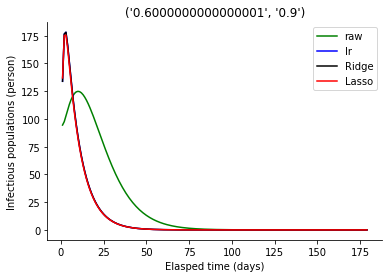

lr,lassoとridgeの回帰係数
[[array([-0.39332977, 14.16303777])], [array([-0.14303254, 13.67614955])], [array([-0.39331832, 14.16301043])]]


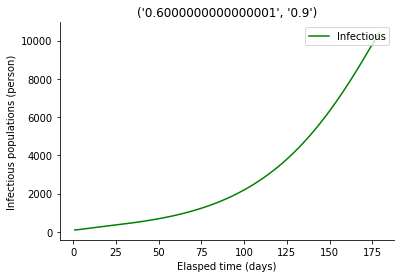

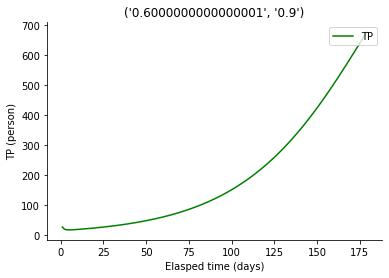

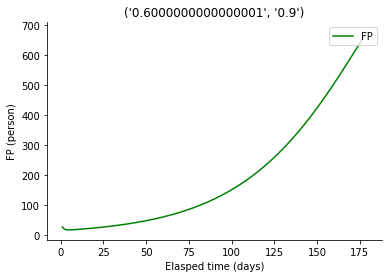

   VIF Factor features
0    2.003846       TP
1    2.003846       FP


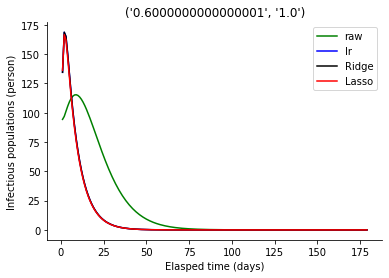

lr,lassoとridgeの回帰係数
[[array([-0.20000754, 14.10176049])], [array([-0.        , 13.60543139])], [array([-0.19999675, 14.10172882])]]


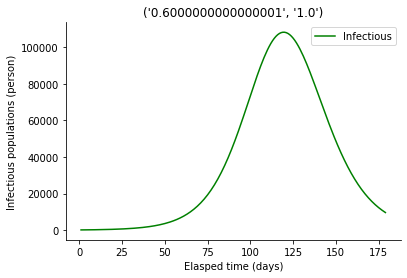

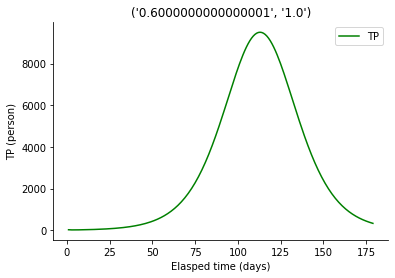

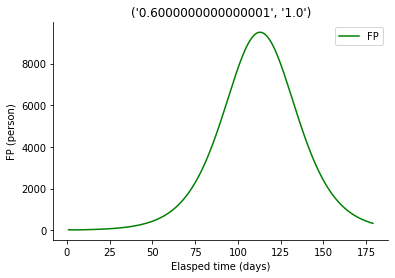

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         NaN       TP
1         1.0       FP


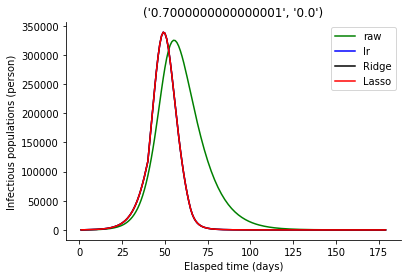

lr,lassoとridgeの回帰係数
[[array([0.        , 6.65916864])], [array([0.        , 6.65916863])], [array([0.        , 6.65916864])]]


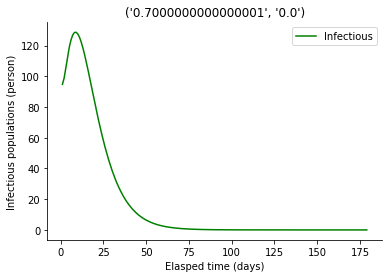

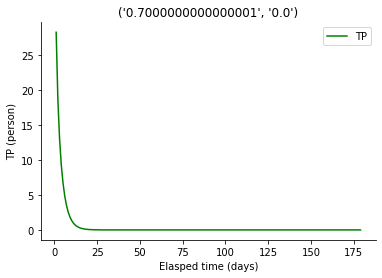

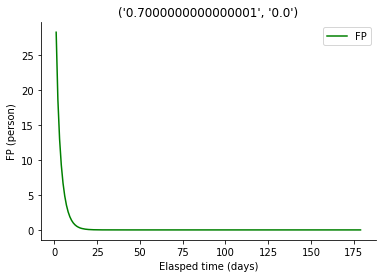

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0     4.08632       TP
1     4.08632       FP


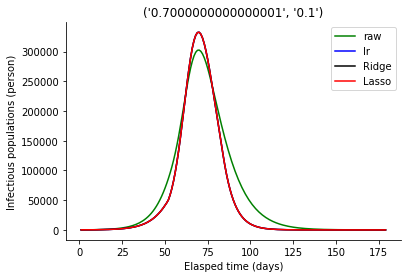

lr,lassoとridgeの回帰係数
[[array([20.5471856 , -0.19890942])], [array([20.54718538, -0.19890933])], [array([20.5471856 , -0.19890942])]]


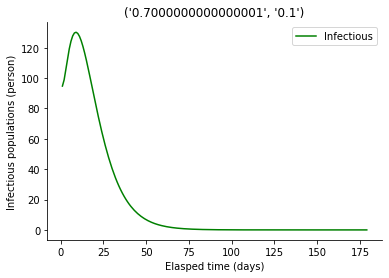

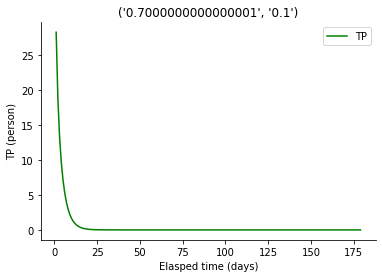

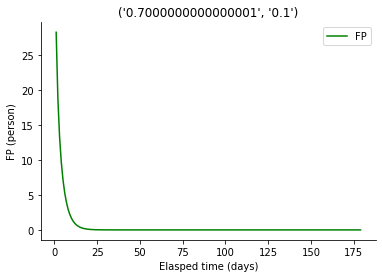

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    5.062689       TP
1    5.062689       FP


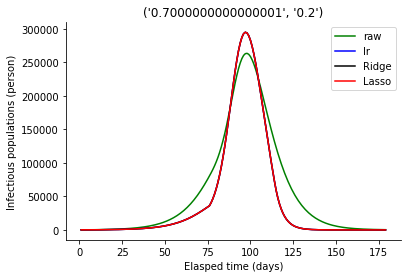

lr,lassoとridgeの回帰係数
[[array([10.55790647,  0.37205903])], [array([10.55790658,  0.37205895])], [array([10.55790647,  0.37205903])]]


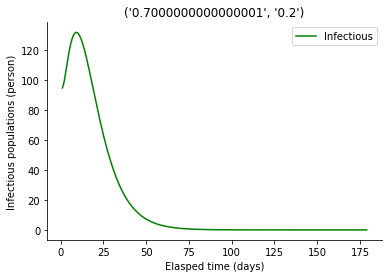

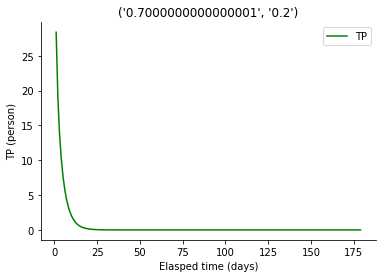

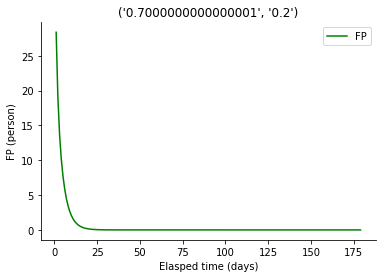

   VIF Factor features
0  256.403452       TP
1  256.403452       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 101205956983.03363, tolerance: 13958728668.721308
  positive)


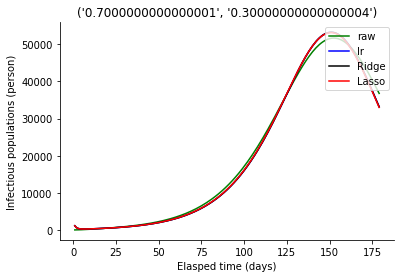

lr,lassoとridgeの回帰係数
[[array([113.26423387, -41.88586673])], [array([111.6159553 , -41.04428833])], [array([113.26423362, -41.8858666 ])]]


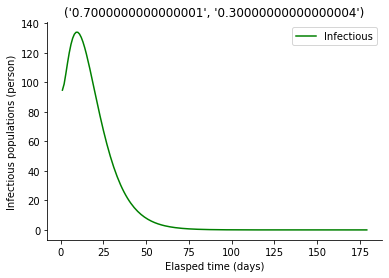

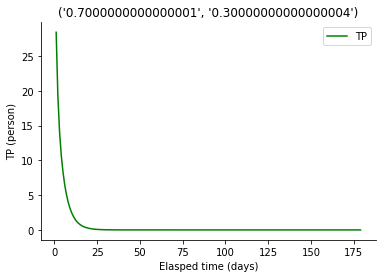

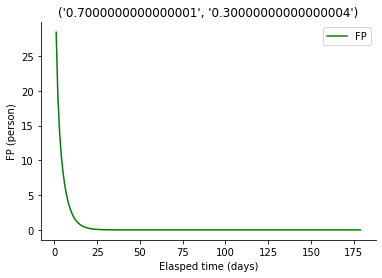

   VIF Factor features
0  202.206709       TP
1  202.206709       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 60104401.977255106, tolerance: 7963755.231652971
  positive)


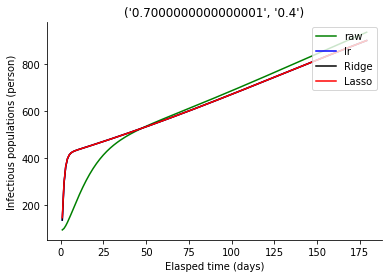

lr,lassoとridgeの回帰係数
[[array([-7.51375257, 20.40319193])], [array([-6.67401708, 19.9349499 ])], [array([-7.51371167, 20.40316909])]]


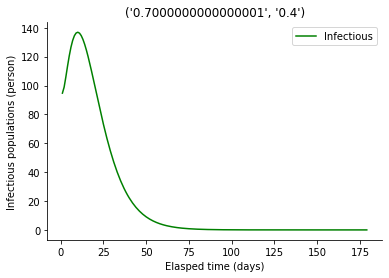

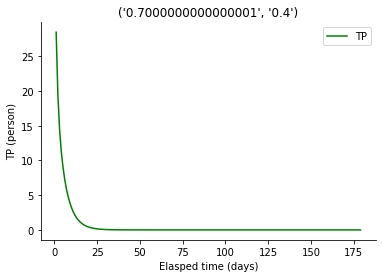

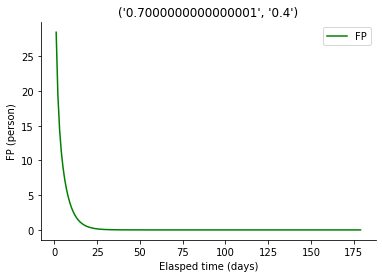

   VIF Factor features
0    7.852017       TP
1    7.852017       FP


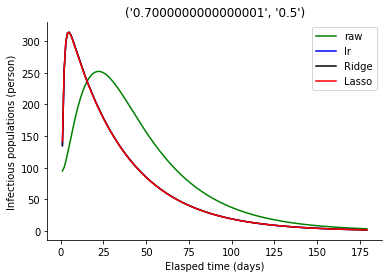

lr,lassoとridgeの回帰係数
[[array([-4.38849699, 17.46899026])], [array([-3.92934794, 17.13677528])], [array([-4.38847259, 17.46897181])]]


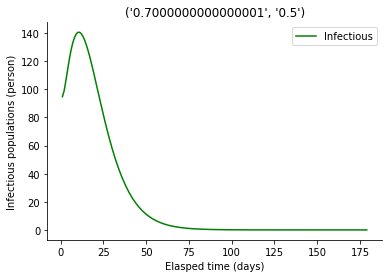

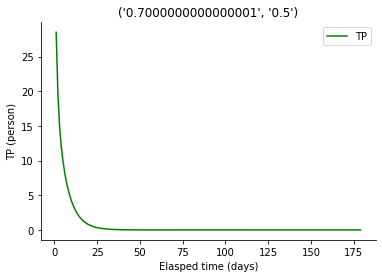

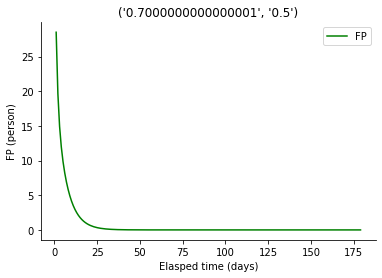

   VIF Factor features
0    4.161134       TP
1    4.161134       FP


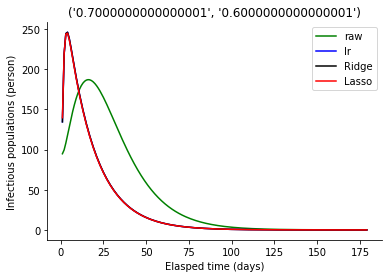

lr,lassoとridgeの回帰係数
[[array([-2.23255683, 14.6922793 ])], [array([-1.86202121, 14.34541043])], [array([-2.23254081, 14.69226266])]]


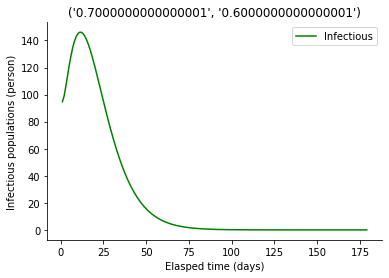

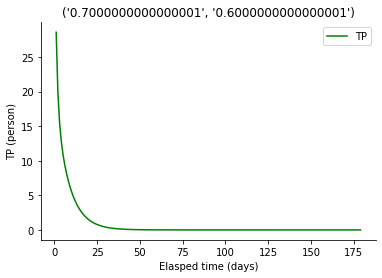

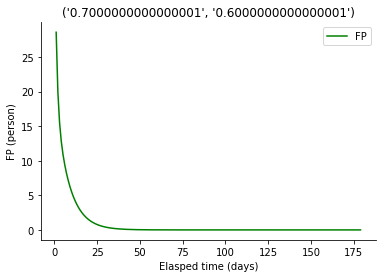

   VIF Factor features
0    3.054043       TP
1    3.054043       FP


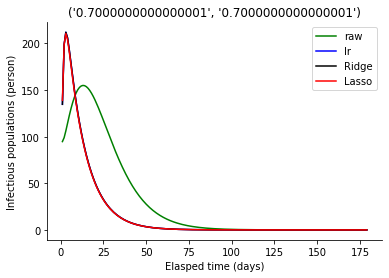

lr,lassoとridgeの回帰係数
[[array([-1.22643323, 13.35992564])], [array([-0.91259088, 12.98853772])], [array([-1.22642081, 13.35990848])]]


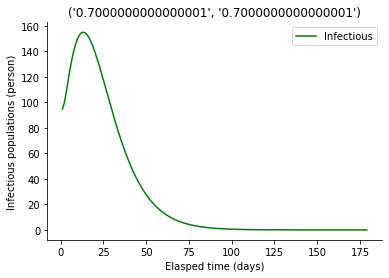

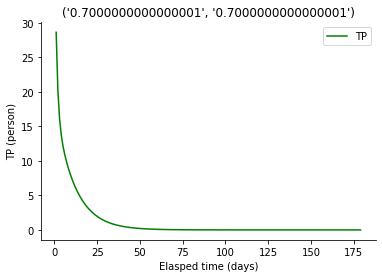

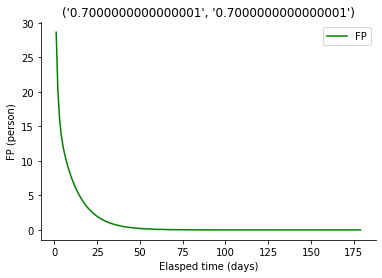

   VIF Factor features
0     2.52127       TP
1     2.52127       FP


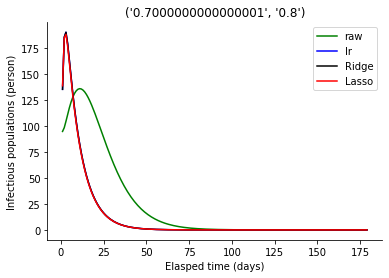

lr,lassoとridgeの回帰係数
[[array([-0.69669802, 12.7235367 ])], [array([-0.42156789, 12.31996839])], [array([-0.69668742, 12.72351784])]]


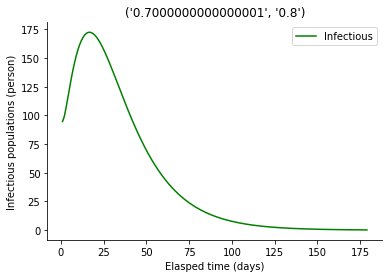

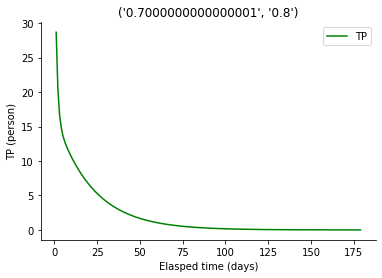

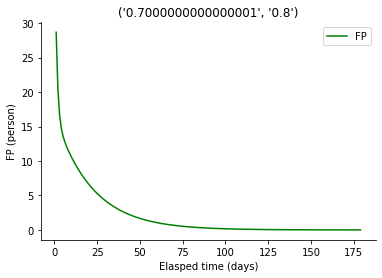

   VIF Factor features
0    2.207977       TP
1    2.207977       FP


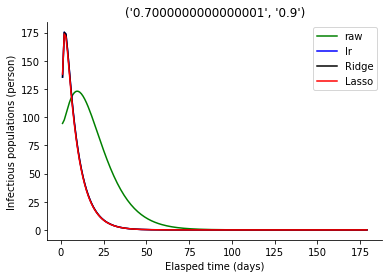

lr,lassoとridgeの回帰係数
[[array([-0.39347471, 12.46727243])], [array([-0.14746149, 12.02681255])], [array([-0.3934651 , 12.46725106])]]


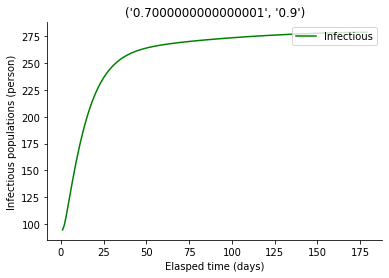

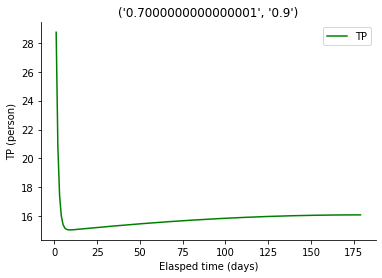

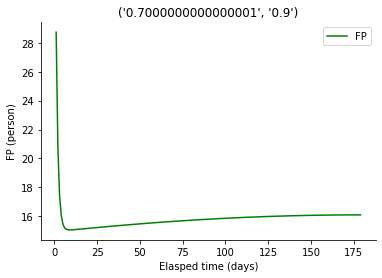

   VIF Factor features
0    2.001709       TP
1    2.001709       FP


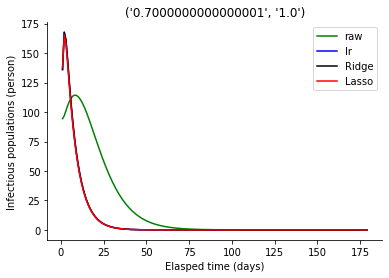

lr,lassoとridgeの回帰係数
[[array([-0.20921371, 12.43822462])], [array([-0.        , 11.97584531])], [array([-0.20920467, 12.43820007])]]


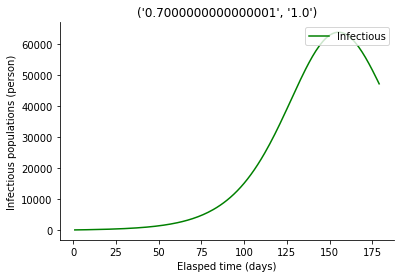

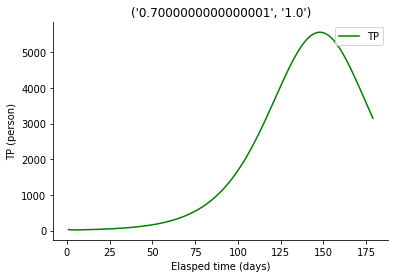

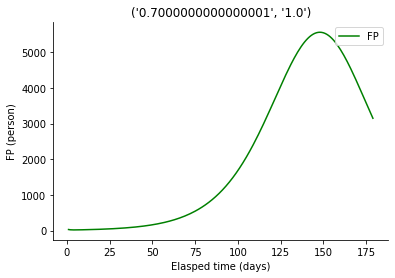

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0         NaN       TP
1         1.0       FP


C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


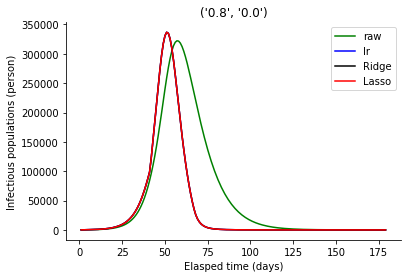

lr,lassoとridgeの回帰係数
[[array([0.        , 5.87113714])], [array([0.        , 5.87113714])], [array([0.        , 5.87113714])]]


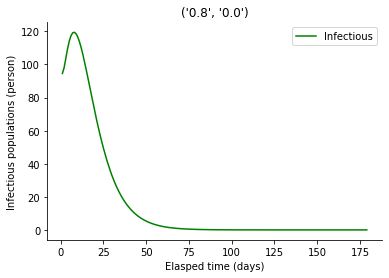

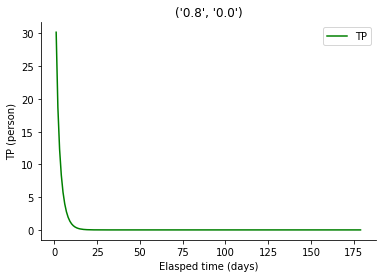

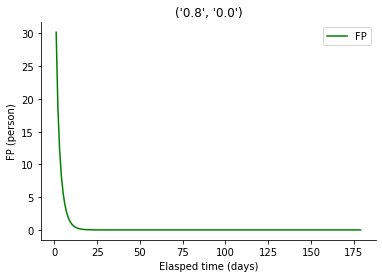

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.071585       TP
1    4.071585       FP


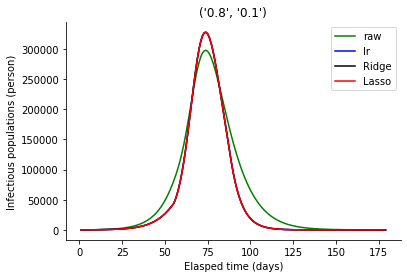

lr,lassoとridgeの回帰係数
[[array([20.49648436, -0.12214199])], [array([20.49648413, -0.12214192])], [array([20.49648436, -0.12214199])]]


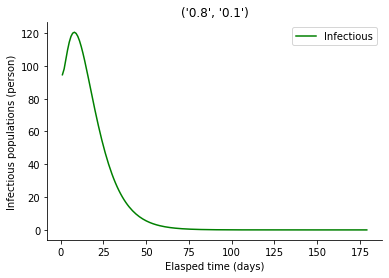

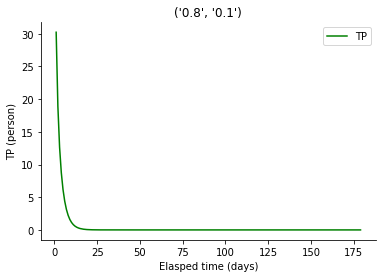

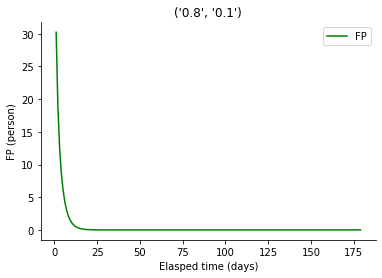

   VIF Factor features
0    5.298533       TP
1    5.298533       FP


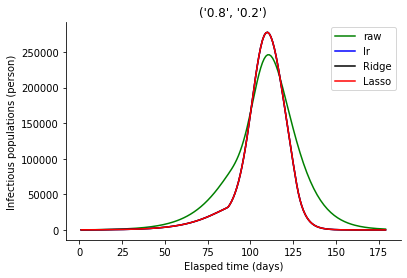

lr,lassoとridgeの回帰係数
[[array([10.62678189,  0.51729602])], [array([10.62678202,  0.51729593])], [array([10.62678189,  0.51729602])]]


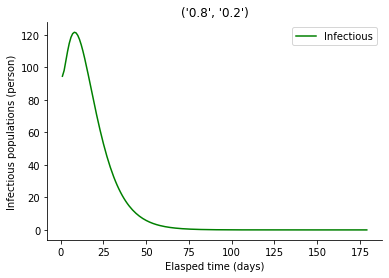

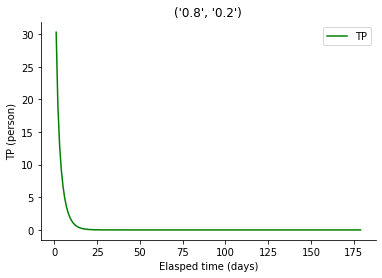

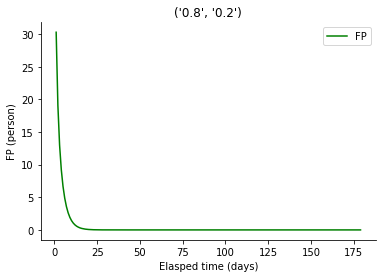

    VIF Factor features
0  1644.012538       TP
1  1644.012538       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14999407789.556784, tolerance: 2523990813.043465
  positive)


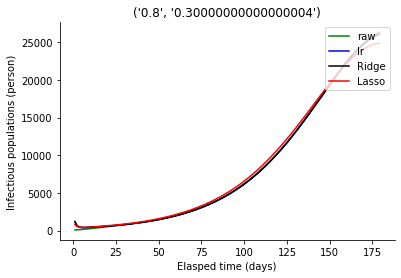

lr,lassoとridgeの回帰係数
[[array([107.62002399, -32.95587699])], [array([ 66.42186272, -15.01812082])], [array([107.62001584, -32.95587344])]]


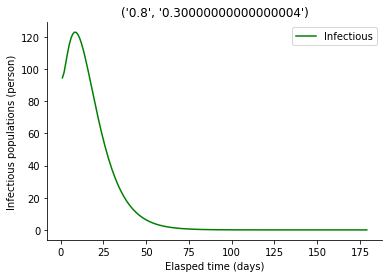

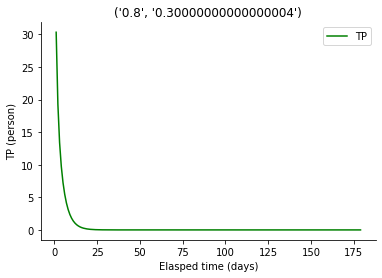

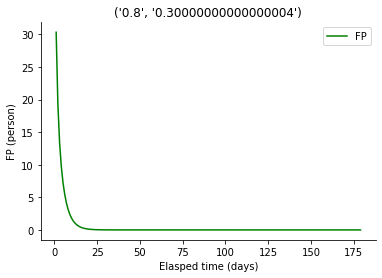

   VIF Factor features
0      26.291       TP
1      26.291       FP


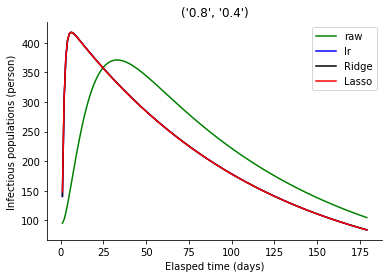

lr,lassoとridgeの回帰係数
[[array([-8.6085769 , 19.71484626])], [array([-7.98297968, 19.38882991])], [array([-8.60853512, 19.7148243 ])]]


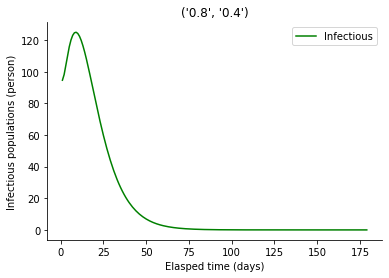

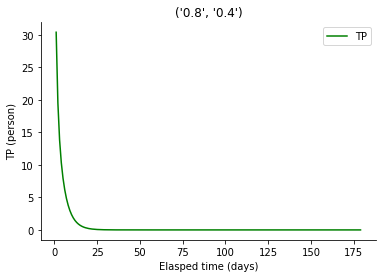

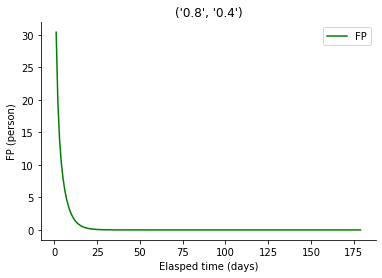

   VIF Factor features
0    6.094461       TP
1    6.094461       FP


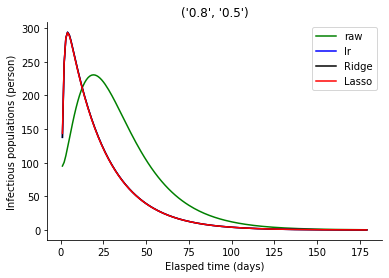

lr,lassoとridgeの回帰係数
[[array([-4.01720044, 15.11329126])], [array([-3.55487664, 14.7940497 ])], [array([-4.01717924, 15.11327576])]]


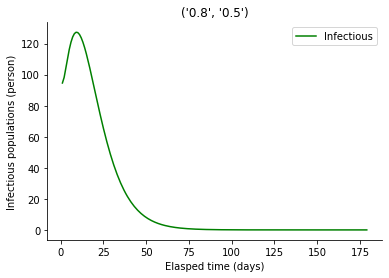

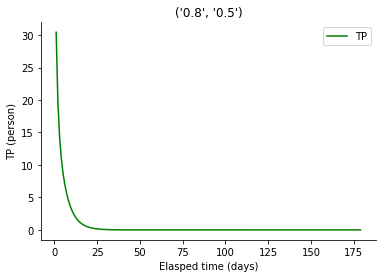

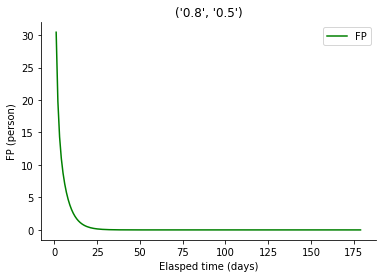

   VIF Factor features
0     3.81572       TP
1     3.81572       FP


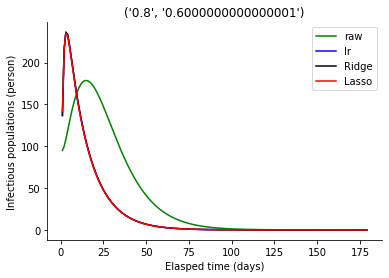

lr,lassoとridgeの回帰係数
[[array([-2.08835492, 12.93467874])], [array([-1.71653954, 12.60442467])], [array([-2.08834096, 12.93466484])]]


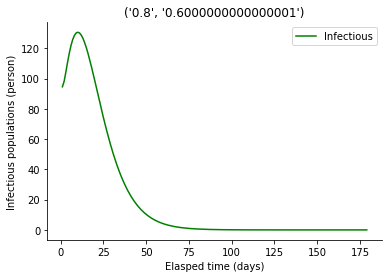

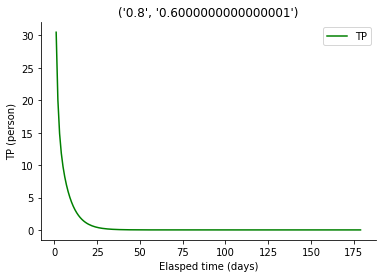

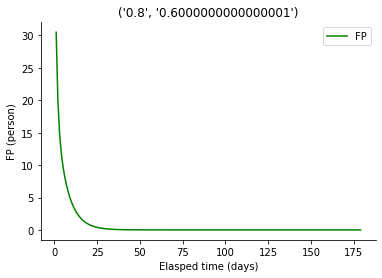

   VIF Factor features
0    2.945406       TP
1    2.945406       FP


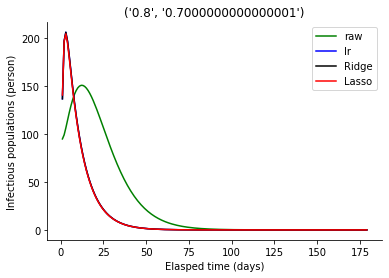

lr,lassoとridgeの回帰係数
[[array([-1.16701506, 11.87451761])], [array([-0.85338525, 11.52455381])], [array([-1.16700426, 11.87450341])]]


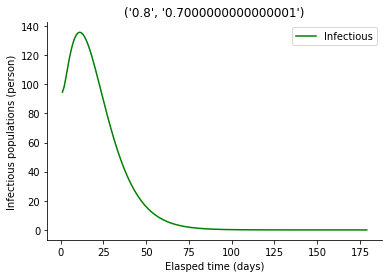

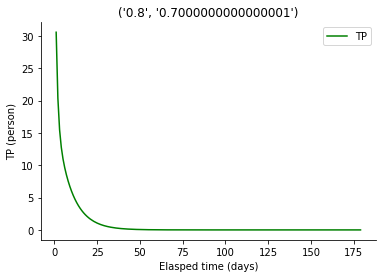

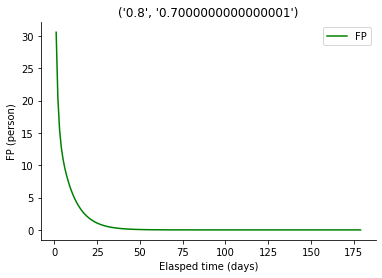

   VIF Factor features
0    2.486098       TP
1    2.486098       FP


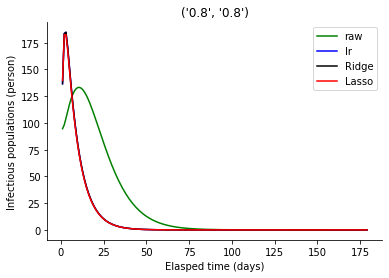

lr,lassoとridgeの回帰係数
[[array([-0.67384774, 11.36969766])], [array([-0.4003522 , 10.99355446])], [array([-0.67383852, 11.36968218])]]


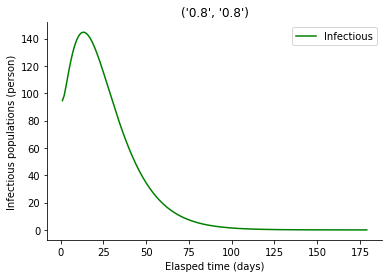

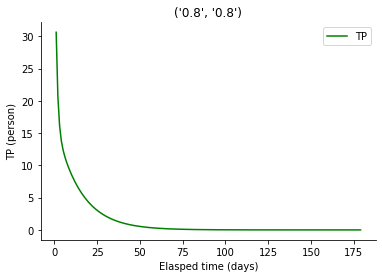

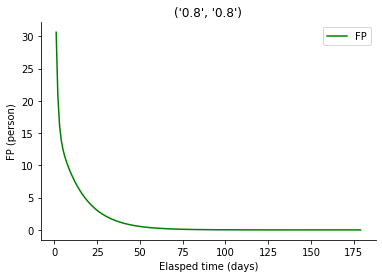

   VIF Factor features
0    2.202274       TP
1    2.202274       FP


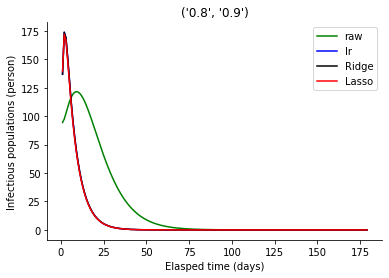

lr,lassoとridgeの回帰係数
[[array([-0.38808226, 11.17477508])], [array([-0.14370271, 10.76716025])], [array([-0.38807392, 11.17475766])]]


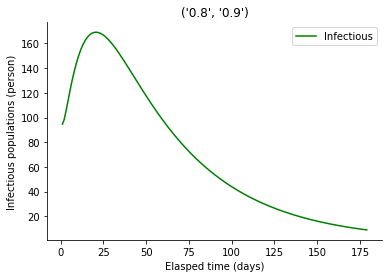

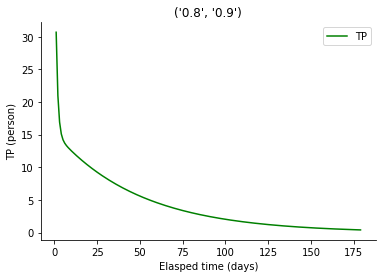

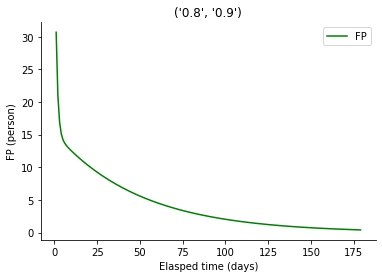

   VIF Factor features
0    2.009498       TP
1    2.009498       FP


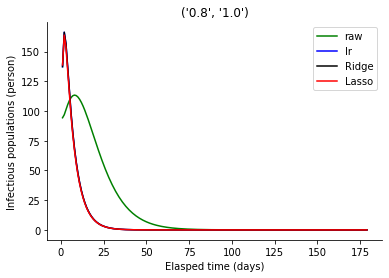

lr,lassoとridgeの回帰係数
[[array([-0.21272765, 11.16796636])], [array([-0.       , 10.7367429])], [array([-0.21271981, 11.16794649])]]


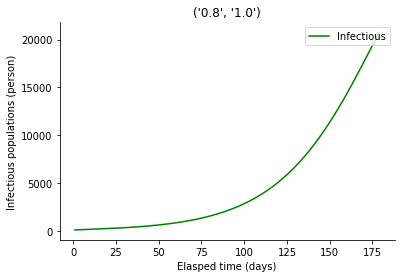

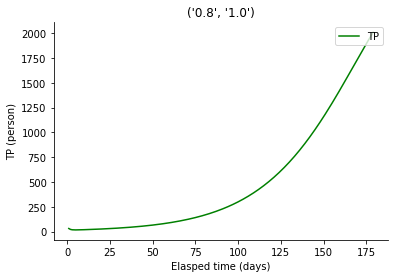

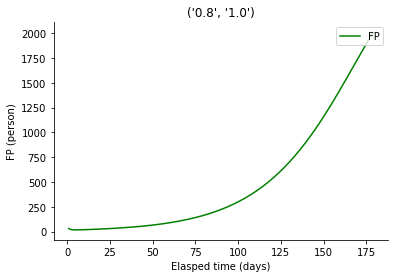

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         NaN       TP
1         1.0       FP


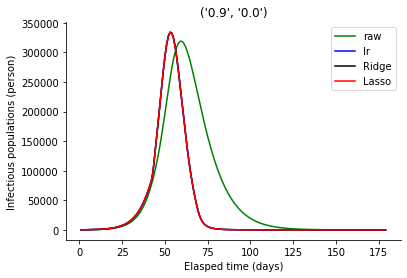

lr,lassoとridgeの回帰係数
[[array([0.        , 5.25653322])], [array([0.        , 5.25653321])], [array([0.        , 5.25653322])]]


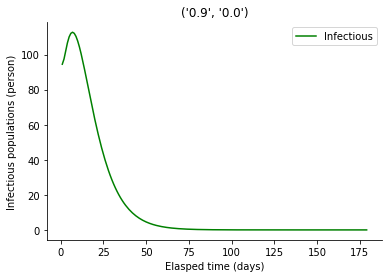

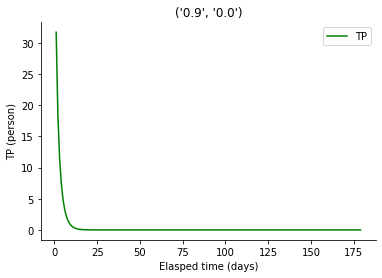

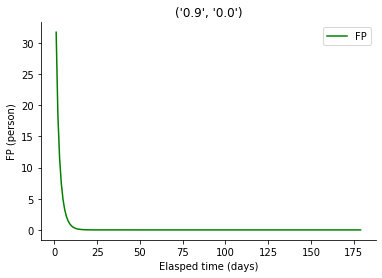

   VIF Factor features
0    4.070471       TP
1    4.070471       FP


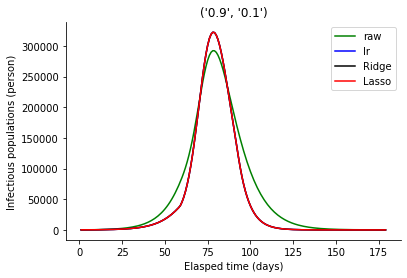

lr,lassoとridgeの回帰係数
[[array([20.4823892 , -0.06523183])], [array([20.48238897, -0.06523176])], [array([20.4823892 , -0.06523183])]]


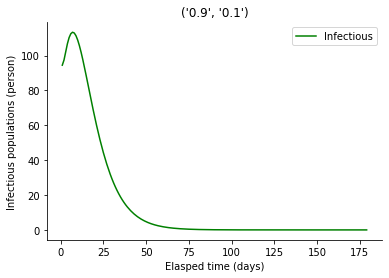

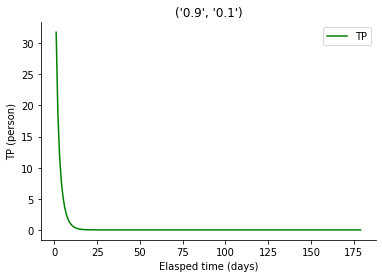

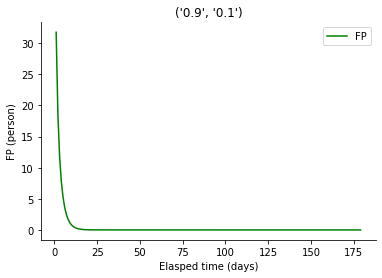

   VIF Factor features
0    5.972793       TP
1    5.972793       FP


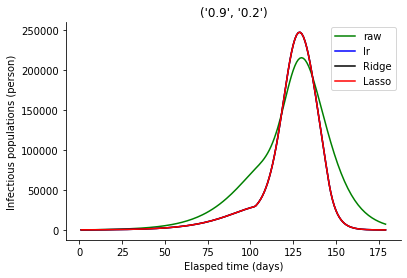

lr,lassoとridgeの回帰係数
[[array([10.79599486,  0.89873182])], [array([10.79599504,  0.89873171])], [array([10.79599486,  0.89873182])]]


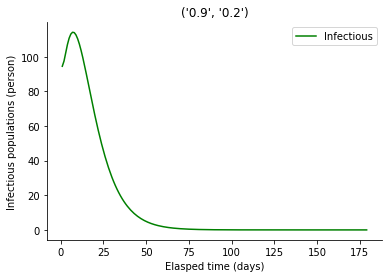

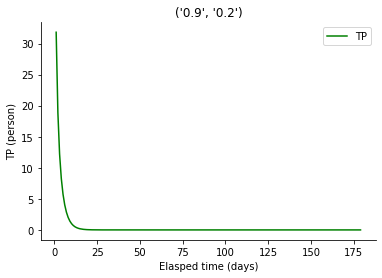

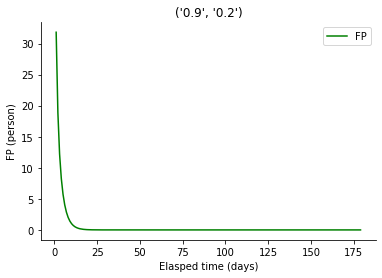

    VIF Factor features
0  4624.746564       TP
1  4624.746564       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1017439693.7568454, tolerance: 181496230.43101496
  positive)


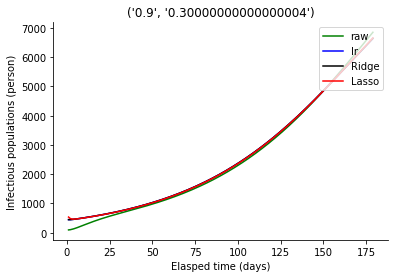

lr,lassoとridgeの回帰係数
[[array([22.39331751,  4.72385469])], [array([32.18557879,  0.94401271])], [array([22.39325458,  4.72387898])]]


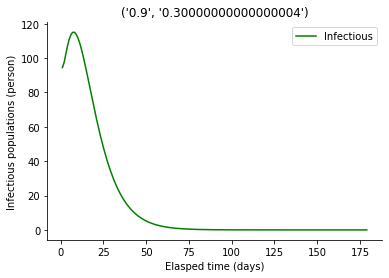

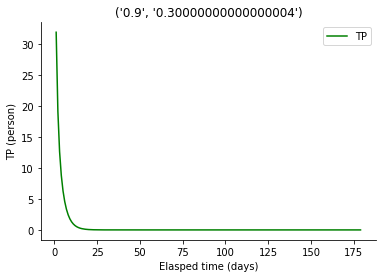

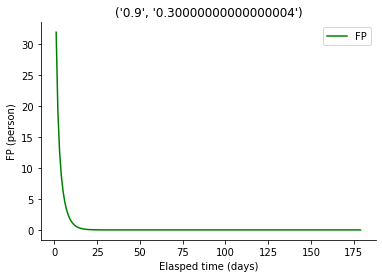

   VIF Factor features
0   12.833154       TP
1   12.833154       FP


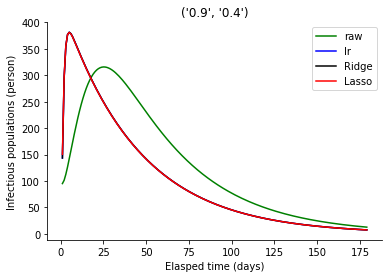

lr,lassoとridgeの回帰係数
[[array([-7.90448062, 17.15454757])], [array([-7.27443794, 16.83893155])], [array([-7.90444308, 17.15452846])]]


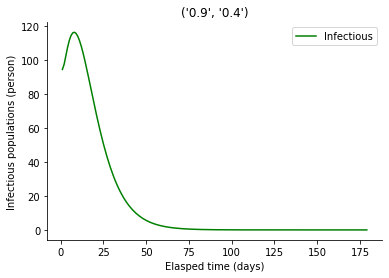

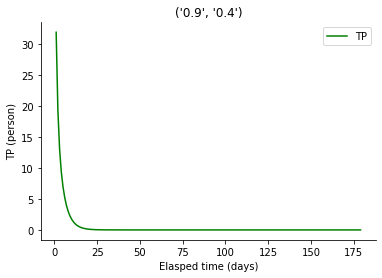

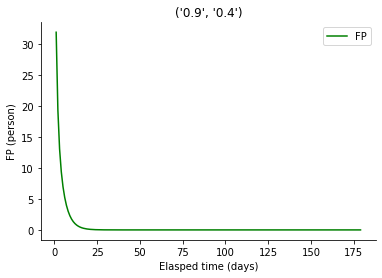

   VIF Factor features
0    5.290907       TP
1    5.290907       FP


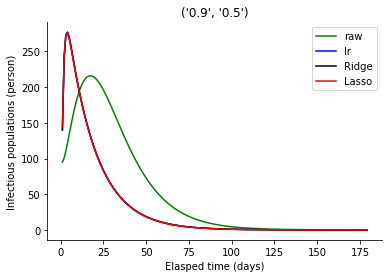

lr,lassoとridgeの回帰係数
[[array([-3.70539645, 13.34537965])], [array([-3.23713069, 13.03512608])], [array([-3.70537753, 13.34536628])]]


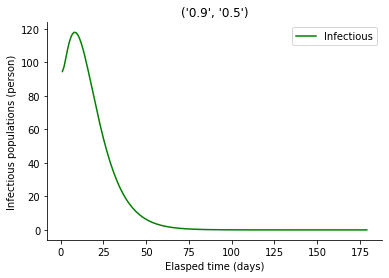

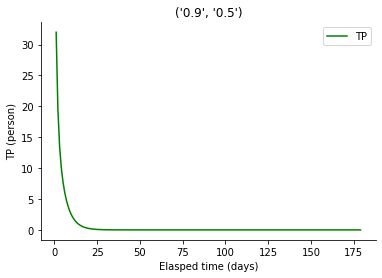

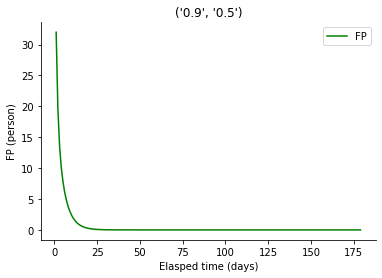

   VIF Factor features
0    3.619247       TP
1    3.619247       FP


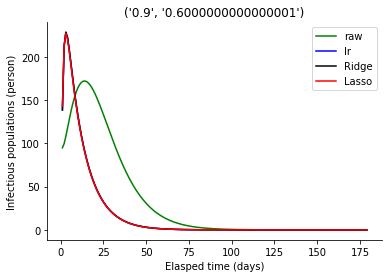

lr,lassoとridgeの回帰係数
[[array([-1.96027379, 11.58410292])], [array([-1.58528033, 11.26601605])], [array([-1.96026134, 11.58409099])]]


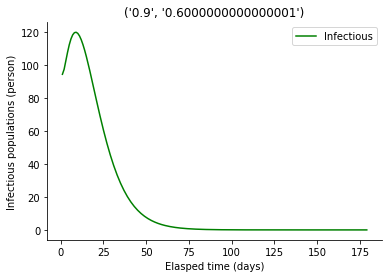

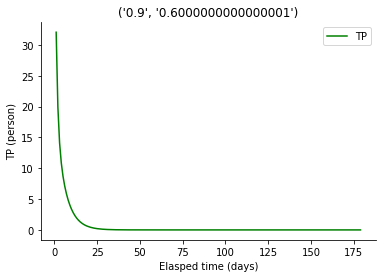

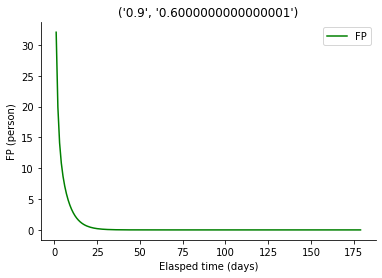

   VIF Factor features
0     2.88491       TP
1     2.88491       FP


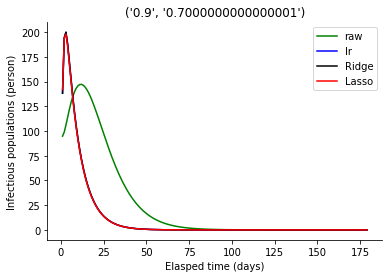

lr,lassoとridgeの回帰係数
[[array([-1.11041163, 10.71822882])], [array([-0.79511657, 10.38396993])], [array([-1.110402  , 10.71821671])]]


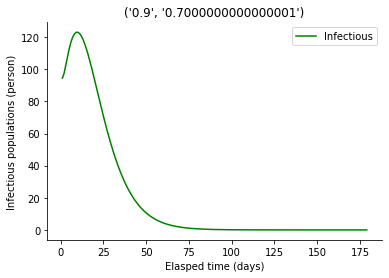

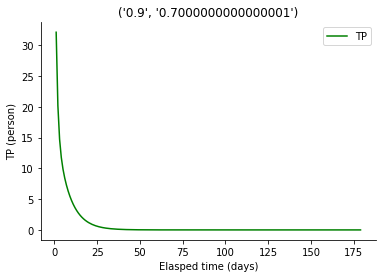

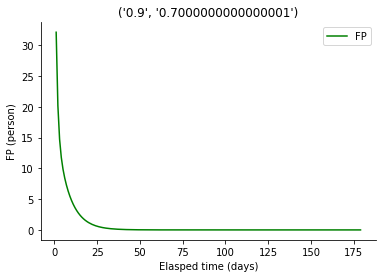

   VIF Factor features
0    2.472201       TP
1    2.472201       FP


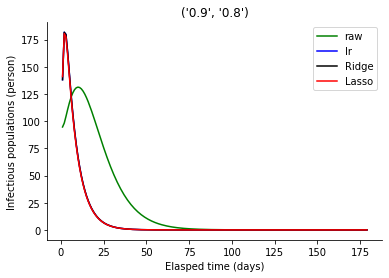

lr,lassoとridgeの回帰係数
[[array([-0.64935454, 10.30847124])], [array([-0.37575455,  9.95261711])], [array([-0.64934634, 10.30845814])]]


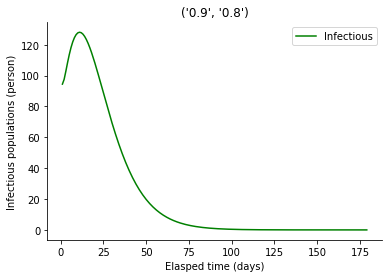

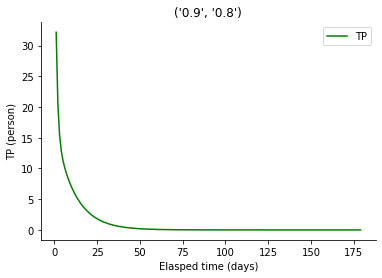

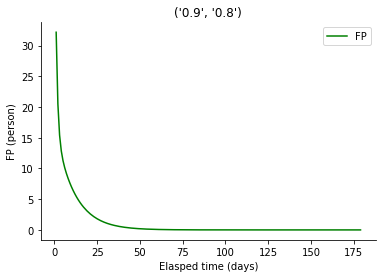

   VIF Factor features
0    2.207783       TP
1    2.207783       FP


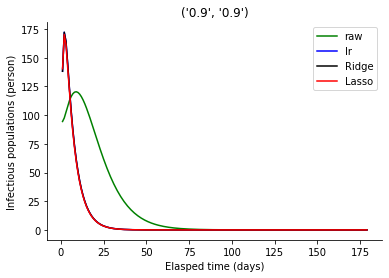

lr,lassoとridgeの回帰係数
[[array([-0.37952052, 10.15781527])], [array([-0.13572287,  9.77506512])], [array([-0.37951311, 10.15780063])]]


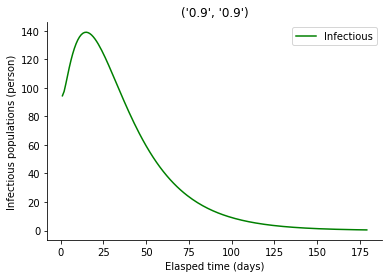

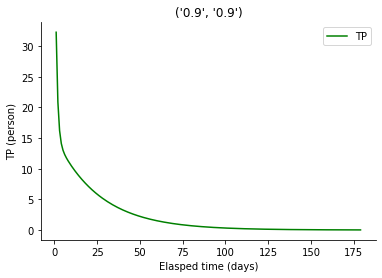

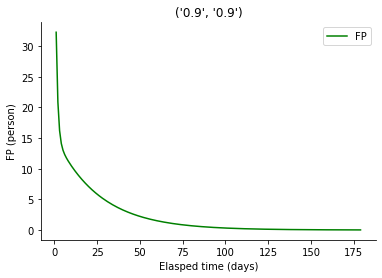

   VIF Factor features
0    2.023907       TP
1    2.023907       FP


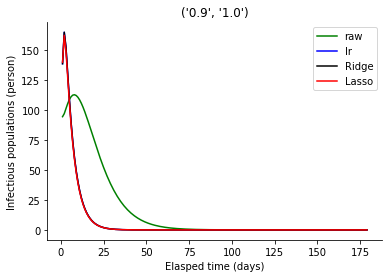

lr,lassoとridgeの回帰係数
[[array([-0.21262535, 10.16647528])], [array([-0.       ,  9.7633438])], [array([-0.2126184 , 10.16645867])]]


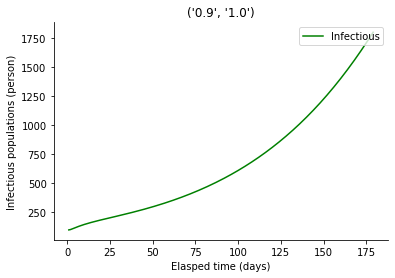

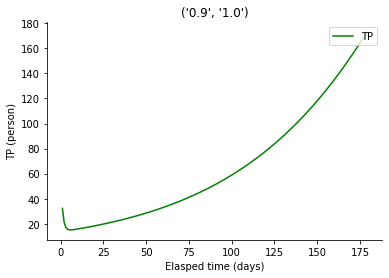

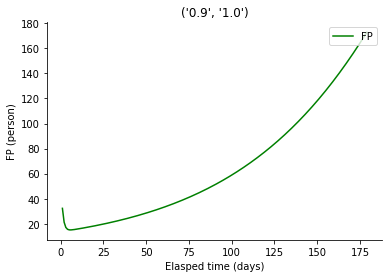

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\bougt\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1687: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.uncentered_tss


   VIF Factor features
0         NaN       TP
1         1.0       FP


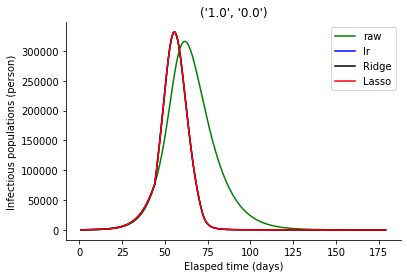

lr,lassoとridgeの回帰係数
[[array([0.        , 4.76405486])], [array([0.        , 4.76405486])], [array([0.        , 4.76405486])]]


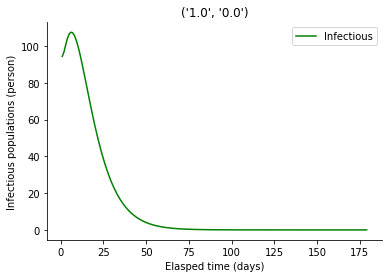

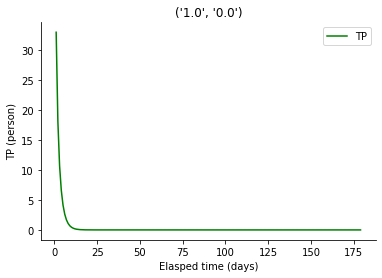

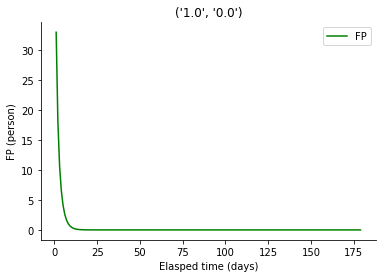

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


   VIF Factor features
0    4.083944       TP
1    4.083944       FP


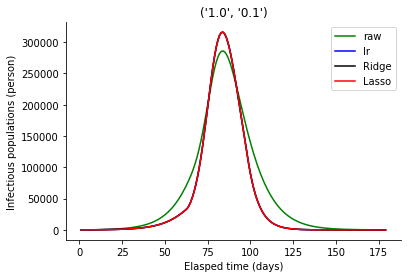

lr,lassoとridgeの回帰係数
[[array([20.50528071, -0.02062446])], [array([20.50528048, -0.0206244 ])], [array([20.50528071, -0.02062446])]]


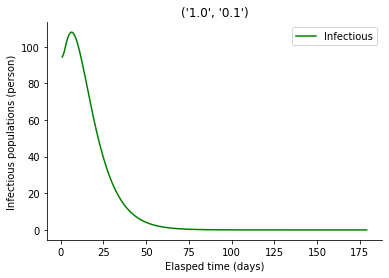

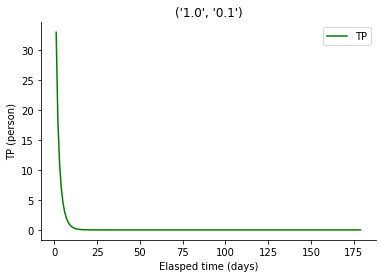

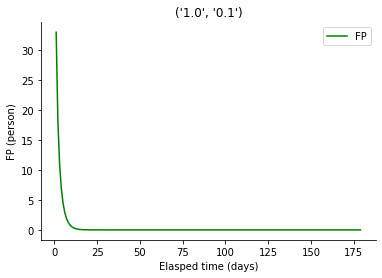

   VIF Factor features
0   92.297466       TP
1   92.297466       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 652136439173.9683, tolerance: 26319505570.65414
  positive)


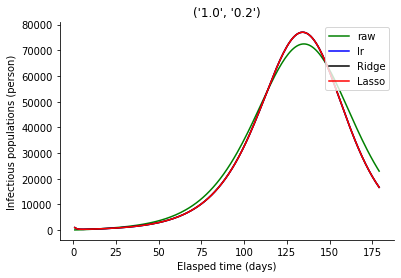

lr,lassoとridgeの回帰係数
[[array([140.69123012, -29.38259876])], [array([140.68926993, -29.38199593])], [array([140.69123001, -29.38259873])]]


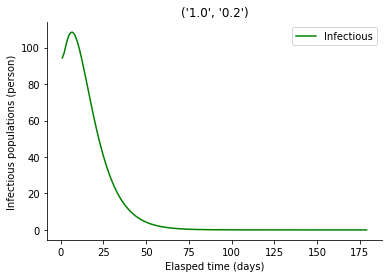

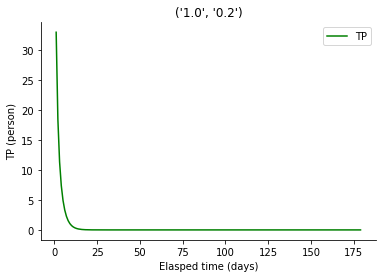

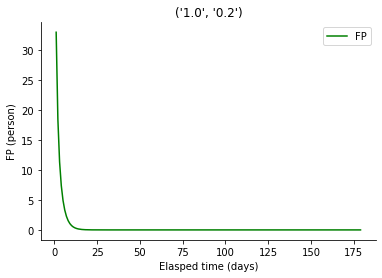

   VIF Factor features
0  343.682465       TP
1  343.682465       FP


C:\Users\bougt\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 444711152.9733613, tolerance: 13493976.02993316
  positive)


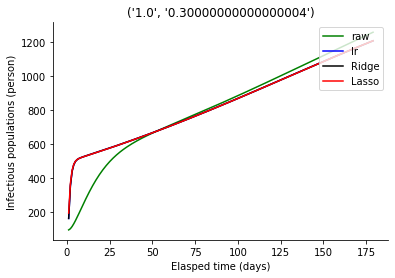

lr,lassoとridgeの回帰係数
[[array([-13.03836864,  18.64901039])], [array([-9.5112806 , 17.39085496])], [array([-13.03829074,  18.64898258])]]


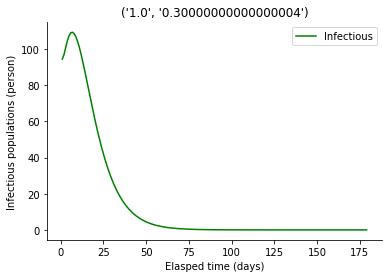

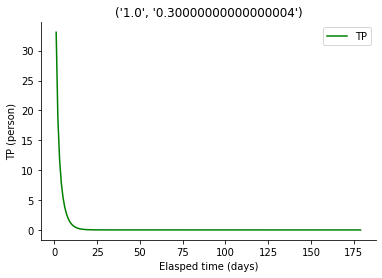

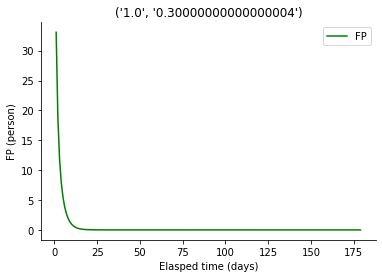

   VIF Factor features
0    9.327288       TP
1    9.327288       FP


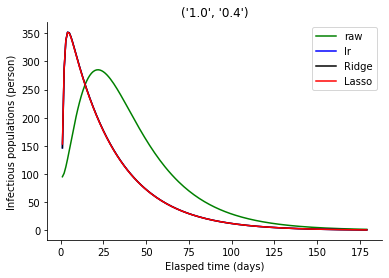

lr,lassoとridgeの回帰係数
[[array([-7.19468804, 15.07590298])], [array([-6.553794  , 14.76545579])], [array([-7.19465404, 15.07588617])]]


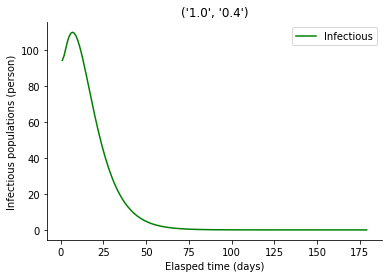

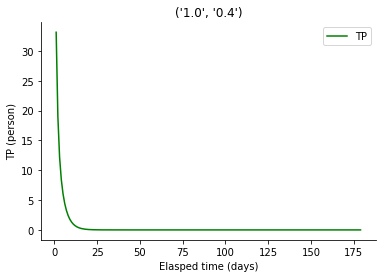

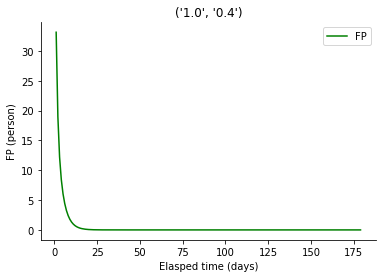

   VIF Factor features
0    4.848369       TP
1    4.848369       FP


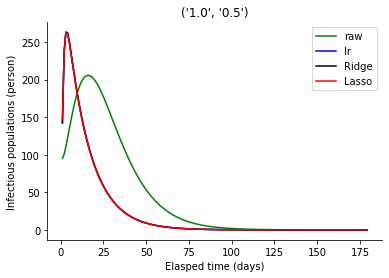

lr,lassoとridgeの回帰係数
[[array([-3.44101387, 11.97699999])], [array([-2.96639318, 11.67381042])], [array([-3.44099666, 11.9769882 ])]]


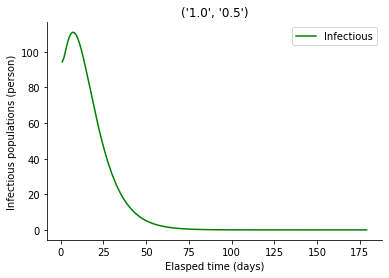

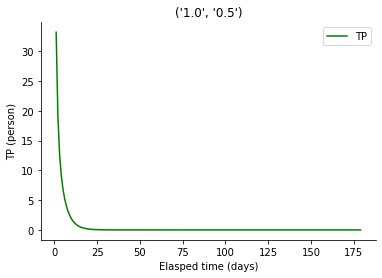

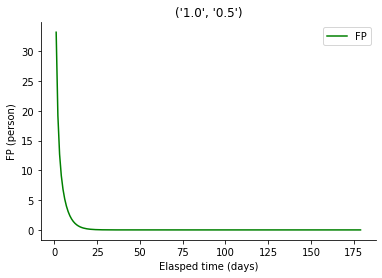

   VIF Factor features
0    3.502066       TP
1    3.502066       FP


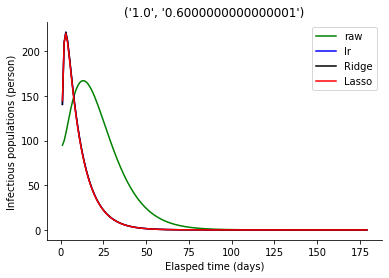

lr,lassoとridgeの回帰係数
[[array([-1.84645118, 10.51737296])], [array([-1.4680632 , 10.20907586])], [array([-1.84643985, 10.51736249])]]


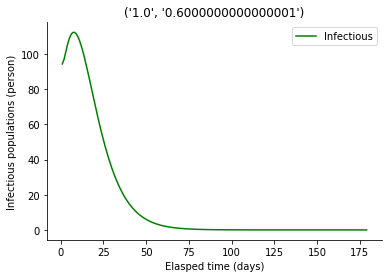

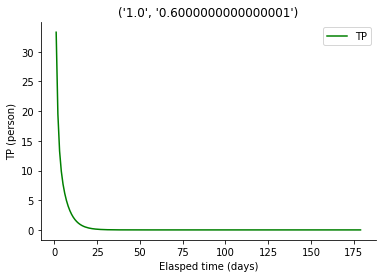

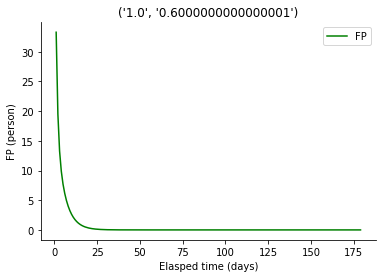

   VIF Factor features
0    2.853629       TP
1    2.853629       FP


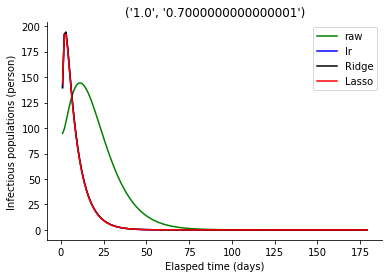

lr,lassoとridgeの回帰係数
[[array([-1.05742387,  9.79466495])], [array([-0.73990986,  9.47274562])], [array([-1.05741512,  9.7946544 ])]]


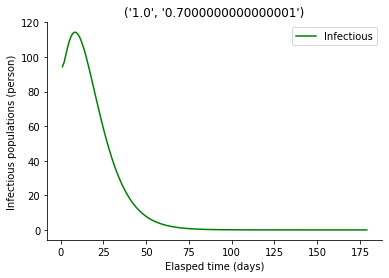

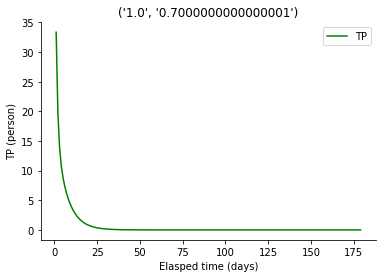

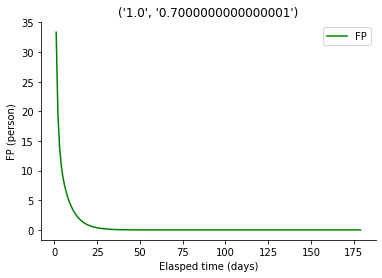

   VIF Factor features
0    2.472149       TP
1    2.472149       FP


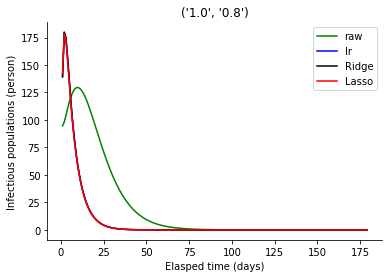

lr,lassoとridgeの回帰係数
[[array([-0.62460687,  9.45549573])], [array([-0.3497208 ,  9.11504203])], [array([-0.62459943,  9.45548438])]]


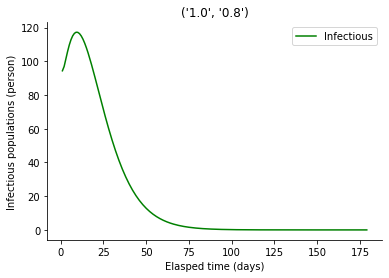

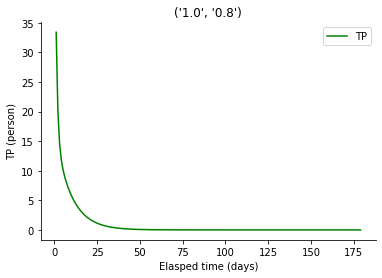

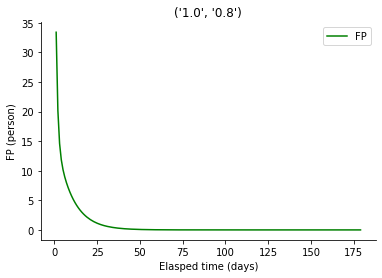

   VIF Factor features
0    2.220914       TP
1    2.220914       FP


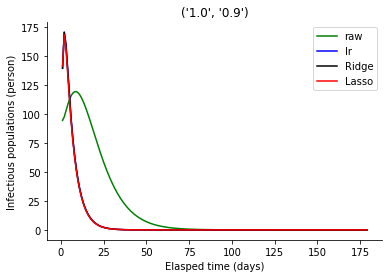

lr,lassoとridgeの回帰係数
[[array([-0.3692107 ,  9.33748651])], [array([-0.1248921 ,  8.97369664])], [array([-0.36920399,  9.3374739 ])]]


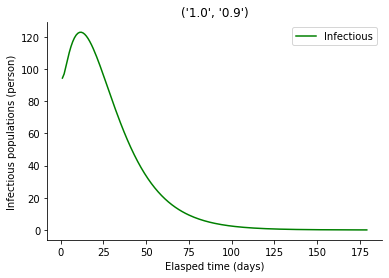

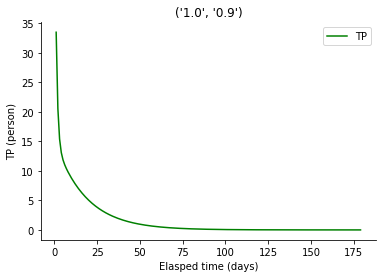

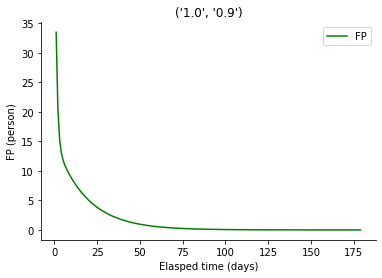

   VIF Factor features
0    2.042949       TP
1    2.042949       FP


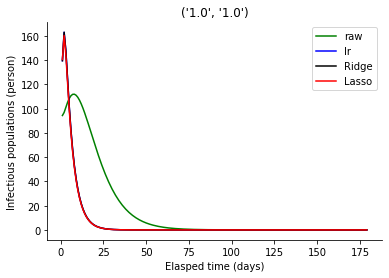

lr,lassoとridgeの回帰係数
[[array([-0.21021424,  9.35695046])], [array([-0.        ,  8.97900039])], [array([-0.21020795,  9.35693623])]]


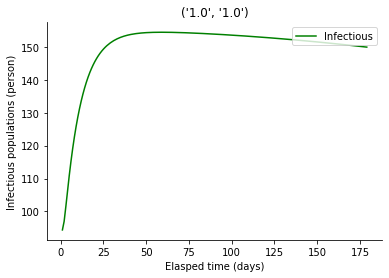

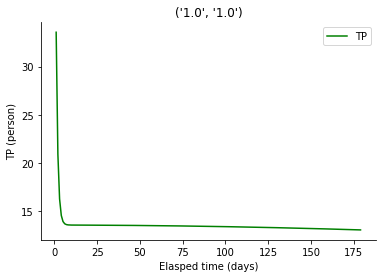

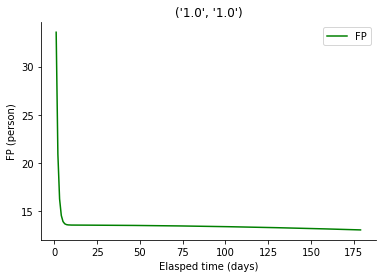

In [142]:
ns = np.linspace(0,1,11)
ps = np.linspace(0,1,11)

for n in ns:
    for p in ps:
        matrix_to_regression_(n,p)

In [20]:
def matrix_to_coef(n,p):
    df = tSEIRD_matrix(n,p,0.7,0.7)[1:]
    
    X = df.drop('Infectious',axis=1)
    X['product'] = X['TP'] * X['FP']
    Y = df['Infectious']

    # 回帰直線、ロッソ、リッジのモデルを生成
    lr = LinearRegression(fit_intercept=False)
#    lasso = Lasso(fit_intercept=False)
#    ridge = Ridge(fit_intercept=False)

    # モデル関数を作成
    lr.fit(X, Y)
#    lasso.fit(X, Y)
#    ridge.fit(X, Y)
    import statsmodels.api as sm

    # Fit and summary:
    model = sm.OLS(Y, X)
    res = model.fit(intercept=False)

#    coef=[]
#    coef.append([lr.coef_])
#    coef.append([lasso.coef_])
#    coef.append([ridge.coef_])

    return [n,p,np.round(lr.coef_[0],2),np.round(lr.coef_[1],2),np.round(lr.coef_[2],2),np.round(res.rsquared_adj,2)]

In [21]:
matrix_to_coef(0.7,0.7) #lrによる回帰係数

[0.7, 0.7, 8.06, 22.23, -1.42, 0.85]

In [214]:
ns = np.linspace(0,1,11)
ps = np.linspace(0,1,11)

scipy_coef = []
for n in ns:
    for p in ps:
        scipy_coef.append(matrix_to_coef(n,p))

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning:

overflow encountered in double_scalars

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning:

overflow encountered in double_scalars

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning:

overflow encountered in double_scalars

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning:

overflow encountered in double_scalars

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning:

overflow encountered in double_scalars

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning:

overflow encountered in double_scalars

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning:

overflow encountered in double_scalars

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning:

overflow encountered in double_scalars



In [215]:
df_scipy_coef = pd.DataFrame(scipy_coef).rename(columns={0:'n',1:'p',2:'TP',3:'FP',4:'product',5:'adj_R2'})
df_scipy_coef['abs_product'] = np.abs(df_scipy_coef['product'])
df_scipy_coef

,n,p,TP,FP,product,adj_R2,abs_product
0,0.0,0.0,0.00,0.00,0.00,0.58,0.00
1,0.0,0.1,21.20,0.00,0.00,0.58,0.00
2,0.0,0.2,11.73,0.00,0.00,0.58,0.00
3,0.0,0.3,8.41,0.00,0.00,0.58,0.00
4,0.0,0.4,6.98,0.00,0.00,0.58,0.00
...,...,...,...,...,...,...,...
116,1.0,0.6,9.66,18.56,-1.27,0.58,1.27
117,1.0,0.7,7.42,16.70,-1.01,0.58,1.01
118,1.0,0.8,5.87,15.50,-0.82,0.58,0.82
119,1.0,0.9,4.78,14.74,-0.70,0.58,0.70


Text(0.5, 1.0, 'regression to Infectious population')

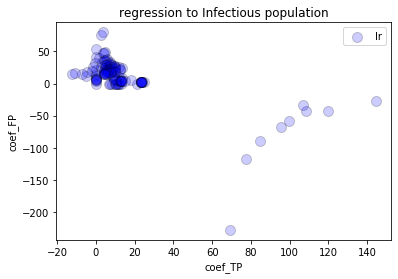

In [217]:
import matplotlib.pyplot as plt

x1 = df_scipy_coef['TP']
y1 = df_scipy_coef['FP']

plt.scatter(x1, y1, s=100, c='blue', alpha=0.2, linewidths='1',edgecolors='black',label='lr')

plt.xlabel('coef_TP')
plt.ylabel('coef_FP')

plt.legend()

plt.title('regression to Infectious population')

In [222]:
import plotly.express as px
df = scipy_coef
fig = px.scatter(df_scipy_coef, x='TP', y='FP', size='p', hover_data=['n','p','product','adj_R2'],color='n')
fig.update_layout(title='coefficient obtained by ls')
fig.show()

# 以下statsmodels

In [137]:
import statsmodels.api as sm

def statsmodels_to_regression(n,p):
    df = tSEIRD_matrix(n,p,0.7,0.7)[1:]
#    title = str(n),str(p)
    
    X = df.drop('Infectious',axis=1)
    X['product'] =  X['TP'] * X['FP']
    Y = df['Infectious']

    model = sm.OLS(Y, X)
    res = model.fit(intercept=False)
#    print (res.summary())
    return res.params

In [139]:
ns = np.linspace(0,1,11)
ps = np.linspace(0,1,11)

coef = []
for n in ns:
    for p in ps:
        coef.append(statsmodels_to_regression(n,p))

coef

C:\Users\bougt\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


[TP         0.0
 FP         0.0
 product    0.0
 dtype: float64,
 TP         21.204037
 FP          0.000000
 product     0.000000
 dtype: float64,
 TP         11.730134
 FP          0.000000
 product     0.000000
 dtype: float64,
 TP         8.413563
 FP         0.000000
 product    0.000000
 dtype: float64,
 TP         6.976206
 FP         0.000000
 product    0.000000
 dtype: float64,
 TP         7.223841
 FP         0.000000
 product    0.000000
 dtype: float64,
 TP         11.604429
 FP          0.000000
 product     0.000000
 dtype: float64,
 TP         11.216283
 FP          0.000000
 product     0.000000
 dtype: float64,
 TP         9.989796
 FP         0.000000
 product    0.000000
 dtype: float64,
 TP         10.359819
 FP          0.000000
 product     0.000000
 dtype: float64,
 TP         10.367367
 FP          0.000000
 product     0.000000
 dtype: float64,
 TP          0.000000
 FP         40.682999
 product     0.000000
 dtype: float64,
 TP         24.765651
 FP         

In [140]:
df_coef = pd.DataFrame(coef)
df_coef

,TP,FP,product
0,0.000000,0.000000,0.000000
1,21.204037,0.000000,0.000000
2,11.730134,0.000000,0.000000
3,8.413563,0.000000,0.000000
4,6.976206,0.000000,0.000000
...,...,...,...
116,9.661827,18.558495,-1.267216
117,7.419058,16.703006,-1.005660
118,5.868353,15.502222,-0.824666
119,4.784916,14.736563,-0.697063


Text(0.5, 1.0, 'statsmodels regression to Infectious population')

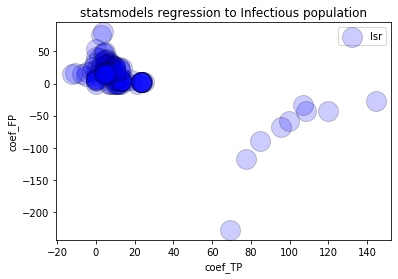

In [141]:
import matplotlib.pyplot as plt

x1 = df_coef['TP']
y1 = df_coef['FP']

plt.scatter(x1, y1, s=400, c='blue', alpha=0.2, linewidths='1',edgecolors='black',label='lsr')

plt.xlabel('coef_TP')
plt.ylabel('coef_FP')

plt.legend()

plt.title('statsmodels regression to Infectious population')